# W207 Final Project Notebook - Facial Keypoint Detection

https://www.kaggle.com/c/facial-keypoints-detection


**Authors:**
- Whit Blodgett
- Sam Temlock
- Haoyu Zhang
- Alan Zhang


## 0. Initialize the Environment

In [ ]:
# Python standard packages
import random
import itertools
from datetime import datetime
from math import radians, sin, cos
import copy

# EDA/general purpose libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

# Image pckages
from PIL import Image
import cv2
from scipy.ndimage import gaussian_filter

# ML libraries/packages
import keras 
import tensorflow as tf

from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

from keras.optimizers import Adam
from keras.models import Sequential, load_model
from keras.layers import Dense, Activation, Dropout, BatchNormalization, Flatten
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.regularizers import l1, l2

plt.style.use('default')

In [ ]:
# upload data from gdrive 
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


### Enable the TPU processor

In [ ]:
# detect and init the TPU
tpu = tf.distribute.cluster_resolver.TPUClusterResolver.connect()

# instantiate a distributed processing strategy
tpu_strategy = tf.distribute.experimental.TPUStrategy(tpu)

INFO:tensorflow:Initializing the TPU system: grpc://10.11.200.234:8470


INFO:tensorflow:Initializing the TPU system: grpc://10.11.200.234:8470


INFO:tensorflow:Clearing out eager caches


INFO:tensorflow:Clearing out eager caches


INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 0, 0)


### Paths to save and load the data





Read in the image datasets from the Kaggle competition.

In [ ]:
# Path to google drive
path = 'gdrive/MyDrive/207_final_project/data/'

train = pd.read_csv(path + 'training.zip')
test = pd.read_csv(path + 'test.zip')

## 1. EDA

### Preview the data

In [ ]:
train.iloc[:,:30].head(5)

,left_eye_center_x,left_eye_center_y,right_eye_center_x,right_eye_center_y,left_eye_inner_corner_x,left_eye_inner_corner_y,left_eye_outer_corner_x,left_eye_outer_corner_y,right_eye_inner_corner_x,right_eye_inner_corner_y,right_eye_outer_corner_x,right_eye_outer_corner_y,left_eyebrow_inner_end_x,left_eyebrow_inner_end_y,left_eyebrow_outer_end_x,left_eyebrow_outer_end_y,right_eyebrow_inner_end_x,right_eyebrow_inner_end_y,right_eyebrow_outer_end_x,right_eyebrow_outer_end_y,nose_tip_x,nose_tip_y,mouth_left_corner_x,mouth_left_corner_y,mouth_right_corner_x,mouth_right_corner_y,mouth_center_top_lip_x,mouth_center_top_lip_y,mouth_center_bottom_lip_x,mouth_center_bottom_lip_y
0,66.033564,39.002274,30.227008,36.421678,59.582075,39.647423,73.130346,39.969997,36.356571,37.389402,23.452872,37.389402,56.953263,29.033648,80.227128,32.228138,40.227609,29.002322,16.356379,29.647471,44.420571,57.066803,61.195308,79.970165,28.614496,77.388992,43.312602,72.935459,43.130707,84.485774
1,64.332936,34.970077,29.949277,33.448715,58.856170,35.274349,70.722723,36.187166,36.034723,34.361532,24.472511,33.144443,53.987404,28.275949,78.634213,30.405923,42.728851,26.146043,16.865362,27.058860,48.206298,55.660936,56.421447,76.352000,35.122383,76.047660,46.684596,70.266553,45.467915,85.480170
2,65.057053,34.909642,30.903789,34.909642,59.412000,36.320968,70.984421,36.320968,37.678105,36.320968,24.976421,36.603221,55.742526,27.570947,78.887368,32.651621,42.193895,28.135453,16.791158,32.087116,47.557263,53.538947,60.822947,73.014316,33.726316,72.732000,47.274947,70.191789,47.274947,78.659368
3,65.225739,37.261774,32.023096,37.261774,60.003339,39.127179,72.314713,38.380967,37.618643,38.754115,25.307270,38.007903,56.433809,30.929864,77.910261,31.665725,41.671513,31.049990,20.458017,29.909343,51.885078,54.166539,65.598887,72.703722,37.245496,74.195478,50.303165,70.091687,51.561183,78.268383
4,66.725301,39.621261,32.244810,38.042032,58.565890,39.621261,72.515926,39.884466,36.982380,39.094852,22.506110,38.305237,57.249571,30.672177,77.762945,31.737247,38.035436,30.935382,15.925870,30.672177,43.299534,64.889521,60.671411,77.523239,31.191755,76.997301,44.962748,73.707387,44.227141,86.871166


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7049 entries, 0 to 7048
Data columns (total 31 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   left_eye_center_x          7039 non-null   float64
 1   left_eye_center_y          7039 non-null   float64
 2   right_eye_center_x         7036 non-null   float64
 3   right_eye_center_y         7036 non-null   float64
 4   left_eye_inner_corner_x    2271 non-null   float64
 5   left_eye_inner_corner_y    2271 non-null   float64
 6   left_eye_outer_corner_x    2267 non-null   float64
 7   left_eye_outer_corner_y    2267 non-null   float64
 8   right_eye_inner_corner_x   2268 non-null   float64
 9   right_eye_inner_corner_y   2268 non-null   float64
 10  right_eye_outer_corner_x   2268 non-null   float64
 11  right_eye_outer_corner_y   2268 non-null   float64
 12  left_eyebrow_inner_end_x   2270 non-null   float64
 13  left_eyebrow_inner_end_y   2270 non-null   float

### Clean the data

Drop any images that have missing facial keypoint labels.

In [ ]:
# Filter out the data from train that is missing values (NaN)
filtered_train = train.dropna()
filtered_train.isna().any()

left_eye_center_x            False
left_eye_center_y            False
right_eye_center_x           False
right_eye_center_y           False
left_eye_inner_corner_x      False
left_eye_inner_corner_y      False
left_eye_outer_corner_x      False
left_eye_outer_corner_y      False
right_eye_inner_corner_x     False
right_eye_inner_corner_y     False
right_eye_outer_corner_x     False
right_eye_outer_corner_y     False
left_eyebrow_inner_end_x     False
left_eyebrow_inner_end_y     False
left_eyebrow_outer_end_x     False
left_eyebrow_outer_end_y     False
right_eyebrow_inner_end_x    False
right_eyebrow_inner_end_y    False
right_eyebrow_outer_end_x    False
right_eyebrow_outer_end_y    False
nose_tip_x                   False
nose_tip_y                   False
mouth_left_corner_x          False
mouth_left_corner_y          False
mouth_right_corner_x         False
mouth_right_corner_y         False
mouth_center_top_lip_x       False
mouth_center_top_lip_y       False
mouth_center_bottom_

In [ ]:
# We only have 2140 examples left
filtered_train.shape

(2140, 31)

In [ ]:
# Reset the index so they are sequential
filtered_train = filtered_train.reset_index(drop=True)

### Check for outliers



Examine the distributions of the keypoints and use Z scores to determine if there are any potential outliers/mislabeled points.

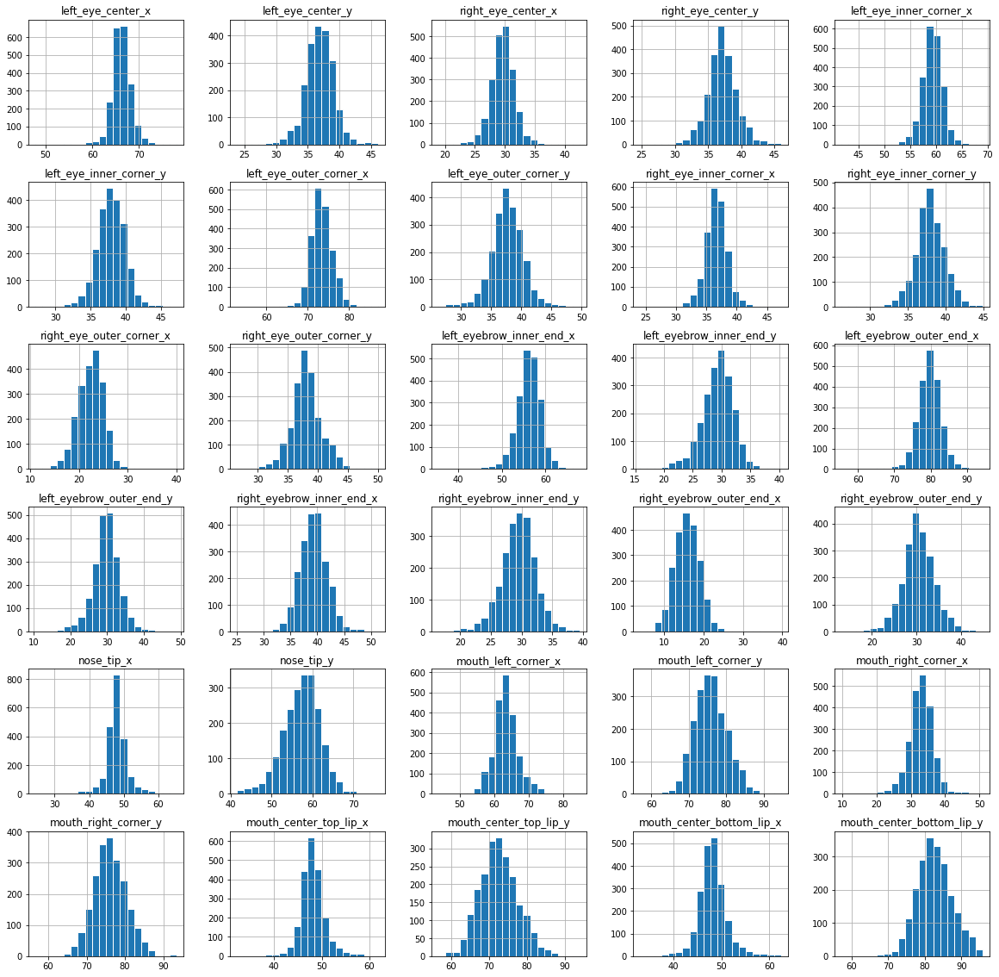

In [ ]:
# Check out the distributions of targets
filtered_train.hist(bins=20, figsize=(20,20), ec='w')
plt.show()

Check to see how many images have keypoints that are greater than 3 standard deviations from the mean of the distribution and may be potential outliers.

In [ ]:
# Get the z scores and check for outliers
z = np.abs(stats.zscore(filtered_train.iloc[:,:-1], nan_policy='omit'))
threshold = 3
outliers = np.argwhere(np.any(z > threshold, axis = 1)).flatten()
print("Number of rows with potential outliers:", len(outliers))

Number of rows with potential outliers: 236


### Data transform and saving

Transform the image pixels that were given as strings in the original data files to a numpy array for manipulation and model training.

In [ ]:
def string_to_array(pd_string, reshape=True):

    '''
    Function to transform string values in the dataframe image column to a numpy array.
    By default, the function will reshape the image into a 96x96 array.
    '''

    image_data = []
    
    if reshape: 
        for i in range(len(pd_string)):
            image_array = np.fromstring(pd_string[i], dtype=int, sep=' ')  # string to 1D array
            image_array = np.reshape(image_array, (96, 96))  # 1D array to 2D array
            image_data.append(image_array)  # 3D
            
    else:
        for i in range(len(pd_string)):
            image_array = np.fromstring(pd_string[i], dtype=int, sep=' ')  # string to 1D array
            image_data.append(image_array) # 2D
            
            
    image_data = np.array(image_data)  # list to array
           
    return image_data

Apply the transform function to the train and test data sets, and then save them as .npy files.

In [ ]:
# Convert the image pixel data from strings to a numpy arrays and save the data

train_data = string_to_array(filtered_train.iloc[:,-1])  # string to array data

np.save(path +'train_data.npy', train_data)  # save train image array to npy

train_labels = filtered_train.iloc[:,:-1].to_numpy()  # face lables to array
np.save(path +'train_labels.npy', train_labels)

test_data = string_to_array(test.iloc[:,-1])
np.save(path +'test_data.npy', test_data)  # save test image array to npy

In [ ]:
# Check the shapes to make sure they were transformed properly
print("Train data array shape:", train_data.shape)
print("Train label array shape:", train_labels.shape)
print("Test data array shape:", test_data.shape)

Train data array shape: (2140, 96, 96)
Train label array shape: (2140, 30)
Test data array shape: (1783, 96, 96)


To avoid rerunning the entire notebook, load the transformed train and test datasets from the .npy files saved above.

In [ ]:
# Load the data back from NPY file
train_data = np.load(path+'train_data.npy')
train_labels = np.load(path+'train_labels.npy')
test_data = np.load(path+'test_data.npy')

### Image Plotting

Display the images from the train dataset to verify that the data transforms perform accordingly.

In [ ]:
def NPY_show(train_data, ax=plt):

  '''
  Function to display an image from the data.
  '''
  
  # If the shape has not been defined, reshape the array
  if len(train_data.shape) == 1:
      image = np.reshape(train_data, (96, 96))  #reshape to 2D array
  else:
      image = train_data
  
  # Plot matrix in greyscale
  ax.imshow(image, cmap ='gray')
  ax.axis('off')
    
    
def NPY_feature_show(train_data, train_labels, ax=plt):

  '''
  Function to display an image with labels from the data.
  '''
  
  # First plot the image
  NPY_show(train_data, ax)

  # Then plot the different feature labels using markers
  ax.scatter(train_labels[0], train_labels[1], s=20, c = 'black') # left eye center
  ax.scatter(train_labels[4:8:2], train_labels[5:9:2], s=20, c = 'black', marker = '^') #left eye inner and outer corners
  ax.scatter(train_labels[12:16:2], train_labels[13:17:2], s=20, c = 'orange') #left eyebrow inner and outer ends

  ax.scatter(train_labels[2], train_labels[3], s=20, c = 'b') #right eye center
  ax.scatter(train_labels[8:12:2], train_labels[9:13:2], s=20, c = 'b', marker = '^') #right eye inner and outer corners
  ax.scatter(train_labels[16:20:2], train_labels[17:21:2], s=20, c = 'g') #right eyebrow inner and outer ends
  
  ax.scatter(train_labels[20], train_labels[21], s=20, c = 'r') # nose tip

  ax.scatter(train_labels[22:26:2], train_labels[23:27:2], s=20, c = 'm', marker = '^')  # mouth right and left corners
  ax.scatter(train_labels[26:29:2], train_labels[27::2], s=20, c = 'm') # mouth top and bottom lip centers

def plot_grid(num_examples, num_rows, num_cols, data, labels, rand=None, indices=[], figsize=(20,20)):
  
  '''
  Plot a grid of example images. If rand is True, plot a random sample 
  of examples. If indices is passed with a list of indices, plot the images 
  specified by the indices.
  '''
  
  # Declare grid to be plotted (rows x cols)
  fig, ax = plt.subplots(num_rows, num_cols, figsize=figsize)

  # If random == True, generate random samples to be plotted
  if rand:
    iters = iter(random.sample(range(len(data)), num_examples))
    data_iter, label_iter = itertools.tee(iters)

  # If the indices are provided, plot those examples
  elif len(indices) > 0:
    data_iter = iter(indices)
    label_iter = iter(indices)

  # Else, just plot from 0 - num_examples examples
  else:
    data_iter = iter(range(0, num_examples))
    label_iter = iter(range(0, num_examples))

  stop = 0

  # Plot each example using the NPY_feature_show() function
  for i in range(num_rows):

    if num_rows < 2:
      row = ax
    else:
      row = ax[i]

    for j in range(num_cols):

      if stop >= num_examples:
        break

      NPY_feature_show(data[next(data_iter)], labels[next(label_iter)], row[j])
      stop += 1

Show a single image without any labeled keypoints.



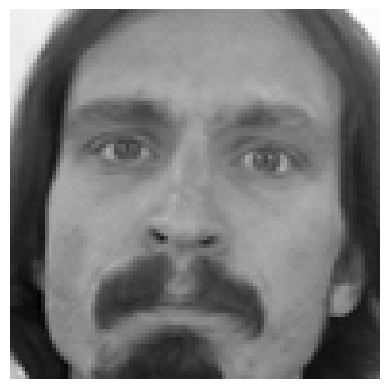

In [ ]:
# Single image without feature labeling
NPY_show(train_data[0])

Show a single image with labeled keypoints.

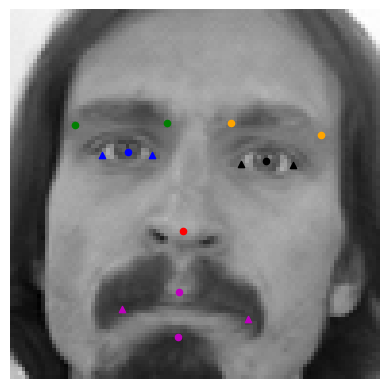

In [ ]:
# Single image without feature labeling
NPY_feature_show(train_data[0], train_labels[0])

Plot a grid of the first 100 faces from the train dataset with labeled keypoints.



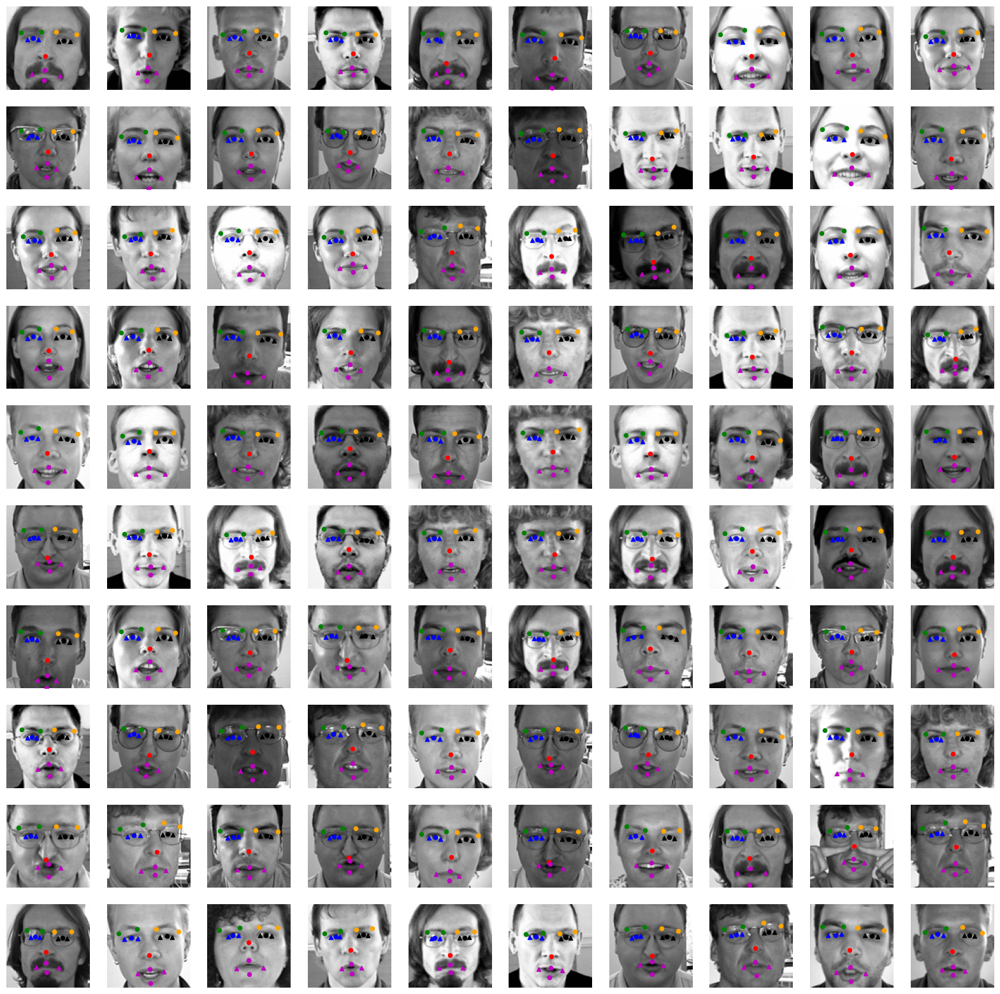

In [ ]:
 # Create a grid to plot faces
 num_examples = 100
 num_rows = 10
 num_cols = 10

 plot_grid(num_examples, num_rows, num_cols, train_data, train_labels, rand=None)

Plot a grid of all the outliers previously found using the Z scores (236 images) to verify the accuracy of the labels.

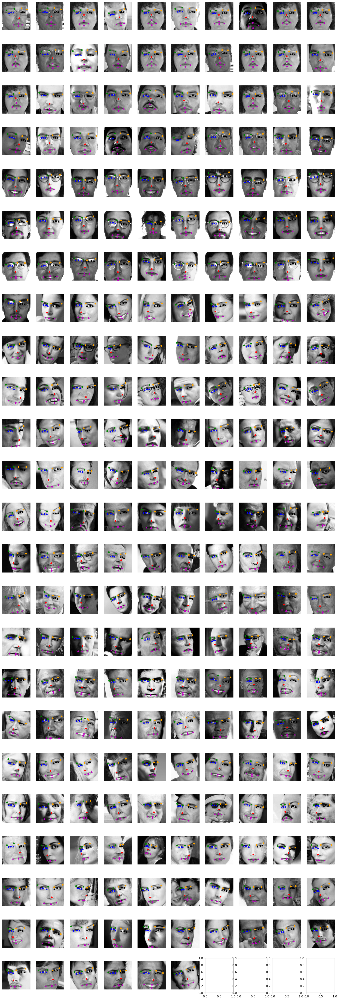

In [ ]:
# Check the outliers 
num_examples = len(outliers)
num_rows = len(outliers)//10 + 1
num_cols = 10

plot_grid(num_examples, num_rows, num_cols, train_data, train_labels, indices=outliers, figsize=(20,60))

## 2. Baseline Model

### Standardize the data

Initially, the data was normalized by subtracting the mean and dividing by the standard deviation. However, it was found that the model performed worse compared to when scaling the data to 0 ~ 1. As a result, the code cells below are commented out.

In [ ]:
# Standardize the data
# numeric_transformer = Pipeline(steps=[('impute', SimpleImputer(strategy='mean')), 
#                                       ('standardize', StandardScaler())])

# train_data_scaled = numeric_transformer.fit_transform(train_data.reshape(train_data.shape[0], np.prod(train_data.shape[1:])))
# test_data_scaled = numeric_transformer.fit_transform(test_data.reshape(test_data.shape[0], np.prod(test_data.shape[1:])))

In [ ]:
# # Check the shapes and new range
# print(train_data_scaled.shape, test_data_scaled.shape)
# print(np.min(train_data_scaled), np.max(train_data_scaled))

Instead, scale the data to 0 ~ 1 by dividing all pixel values by 255.

In [ ]:
# Scale the data
train_data_scaled = train_data / 255
test_data_scaled = test_data / 255

In [ ]:
# Check the new range of pixel values
print("Pixel values scale:", np.min(train_data_scaled), "~", np.max(train_data_scaled))

Pixel values scale: 0.0 ~ 1.0


### Reshape the data

Reshape the train and test data in the proper format for input into the convolutional neural network models.

In [ ]:
# Reshape the data in matrix form to be used as input to the CNN
img_rows = 96
img_cols = 96

train_data_cnn = train_data_scaled.reshape(train_data_scaled.shape[0], img_rows, img_cols, 1)
test_data_cnn = test_data_scaled.reshape(test_data_scaled.shape[0], img_rows, img_cols, 1)

print("Train data array shape:", train_data_cnn.shape)
print("Test data array shape:", test_data_cnn.shape)

Train data array shape: (2140, 96, 96, 1)
Test data array shape: (1783, 96, 96, 1)


### Split the train data into train and validation sets

Split the train data set into a smaller training dataset and a validation set to evaluate model performance. Set the validation set size to 0.2. Also set the random state to 42 the split is always the same.

In [ ]:
train_X, val_X, train_y, val_y = train_test_split(train_data_cnn, train_labels, random_state=42, test_size=0.2)

### Initialize the baseline model

Set up the initial baseline model architecture and hyperparemeters:
- 2 convolutional layers
- 1 max pooling layer
- 1 dropout layer
- 2 dense layers

The total number of parameters for the baseline model is 39,393,034.

In [ ]:
# Instantiating the model in the TPU strategy scope allows the model to be trained using the TPU
with tpu_strategy.scope():

  # Initialize the model
  model = Sequential() 

  # Add two different convolutional layers with different number of filters
  model.add(Conv2D(filters=90, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform', input_shape=(img_rows, img_cols, 1)))
  model.add(Conv2D(filters=64, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform'))

  # Create a pooling layer
  model.add(MaxPooling2D(pool_size=(3, 3)))

  # Add some noise using dropout
  model.add(Dropout(0.5))

  # Flatten to create the input for the feed-forward layers
  model.add(Flatten())

  # Add the dense layers
  model.add(Dense(units=600, activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l2(0.01))) 
  model.add(Dense(input_dim=600, units=30, activation='linear')) 

  # Set the Adam optimizer
  opt = Adam(learning_rate=0.001)

  # Set the cost function & the metric
  model.compile(optimizer=opt, loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])
  model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 96, 96, 90)        900       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 96, 96, 64)        51904     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 32, 32, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 32, 32, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 65536)             0         
_________________________________________________________________
dense (Dense)                (None, 600)               39322200  
_________________________________________________________________
dense_1 (Dense)              (None, 30)                1

Save the initial random weights of the model to be reused when comparing performance. 

In [ ]:
# Save the baseline model weights before training to be reused 
initial_weights = 'models/random_initial_weights.h5'

In [ ]:
#model.save_weights(path + initial_weights)
model.load_weights(path + initial_weights)

Set the initial batch size to 400. The batch size is always be a multiple of the number of TPU cores (8 scores) to maximize computation efficiency.

In [ ]:
# Initialize the ideal batch size based off the number of cores
BATCH_SIZE = 50 * tpu_strategy.num_replicas_in_sync
print("Batch size:", BATCH_SIZE)

Batch size: 400


### Train the baseline model

Train the model on the original dataset in order to obtain a baseline root mean squared error (RMSE).

In [ ]:
history = model.fit(train_X, train_y, validation_data=(val_X, val_y), batch_size=BATCH_SIZE, epochs=100, verbose=1)
score = model.evaluate(val_X, val_y, verbose=0)

Epoch 1/100
5/5 [==============================] - 4s 928ms/step - loss: 1674.3339 - root_mean_squared_error: 40.7457 - val_loss: 329.8119 - val_root_mean_squared_error: 17.4391
Epoch 2/100
5/5 [==============================] - 1s 198ms/step - loss: 403.3487 - root_mean_squared_error: 19.2253 - val_loss: 367.1523 - val_root_mean_squared_error: 17.8578
Epoch 3/100
5/5 [==============================] - 1s 265ms/step - loss: 294.5851 - root_mean_squared_error: 15.5095 - val_loss: 315.3522 - val_root_mean_squared_error: 15.8632
Epoch 4/100
5/5 [==============================] - 1s 204ms/step - loss: 273.7237 - root_mean_squared_error: 14.3839 - val_loss: 231.8986 - val_root_mean_squared_error: 12.6627
Epoch 5/100
5/5 [==============================] - 1s 205ms/step - loss: 238.5623 - root_mean_squared_error: 12.8733 - val_loss: 224.5129 - val_root_mean_squared_error: 12.2481
Epoch 6/100
5/5 [==============================] - 1s 204ms/step - loss: 221.5690 - root_mean_squared_error: 12.12

In [ ]:
# Print the RMSE 
print('Train set RMSE error across the keypoints:', history.history['root_mean_squared_error'][-1])
print('Validation set RMSE error across the keypoints:', score[1])

Train set RMSE error across the keypoints: 2.2323827743530273
Validation set RMSE error across the keypoints: 2.5993432998657227


### Evaluate the baseline model

Evaluate the baseline model training by plotting the train and validation learning curves for both the loss and RMSE.

In [ ]:
def plot_learning_curves(history, log=True, ax=None):

  '''
  Plot the model RMSE and loss learning curves for both the train and validation 
  data sets.
  '''

  if ax is None:
    fig, ax = plt.subplots(1, 2, figsize=(20,8))

  rmse = history.history['root_mean_squared_error']
  val_rmse = history.history['val_root_mean_squared_error']
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  rmse_ylabel = 'RMSE'
  loss_ylabel = 'Loss'

  if log:
    rmse = np.log(rmse)
    val_rmse = np.log(val_rmse)
    loss = np.log(loss)
    val_loss = np.log(val_loss)
    rmse_ylabel = 'Log RMSE'
    loss_ylabel = 'Loss'


  # Plot the RMSE 
  ax[0].plot(rmse)
  ax[0].plot(val_rmse)
  ax[0].set_title('Model performance')
  ax[0].set_ylabel(rmse_ylabel)
  ax[0].set_xlabel('Epoch')
  ax[0].legend(['train', 'val'], loc='upper right')

  # Plot the loss
  ax[1].plot(loss)
  ax[1].plot(val_loss)
  ax[1].set_title('Model loss')
  ax[1].set_ylabel(loss_ylabel)
  ax[1].set_xlabel('Epoch')
  ax[1].legend(['train', 'val'], loc='upper right')

  return ax

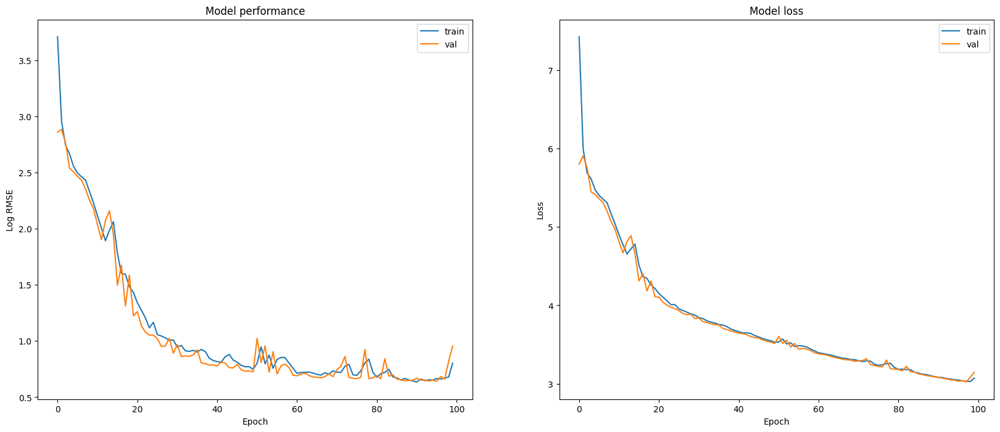

In [ ]:
plot_learning_curves(history, log=True)
plt.show()

### Save the baseline model

Save the evaluated model to be recorded and reused at a later date.

In [ ]:
# Save the model and architecture to single file
def save_model(model, path):
  
  '''
  Saves a model using the current timestamp at the designated path.
  '''

  # Get the current timestamp
  utc_datetime = datetime.utcnow()
  date_string = utc_datetime.strftime("%Y-%m-%d-%H%MZ")

  # Define the filename
  filename = "model_" + date_string + ".h5"

  # Save the model
  model.save(path + filename)
  print(f"Saved {filename} to {path}")

In [ ]:
# Define the file path for the model to be saved
model_path = path + "models/"

# Save the model
save_model(model, model_path)

Saved model_2021-04-09-1431Z.h5 to gdrive/MyDrive/207_final_project/data/models/


## 3. Data Augmentation

Given the small and standardized train dataset, there was a need to augment the dataset with examples and add more variance to the images to train a more robust model.

The following is a list of augmentation functions that were implemented:

  - Gaussian Blur
    - img_blurb
  - Contrast
    - contrast_augment
  - Contrast Limited Adaptive Histogram Equalization (CLAHE)
    - CLAHE_contrast_augment
  - Rotation 
    - rotate_augmentation
  - Brightness
    - brightness_augment
  - Salt & Pepper Noise
    - img_sp_noise
  - Gaussian Noise
    - img_gauss_noise
  - Horizontal Flip
    - img_xflip
  - Vertical Flip
    - img_yflip






In [ ]:
def brightness_augment(img, label, value = 10):

  '''
  Performs brightness augmentation on a given image array by adding the factor
  of the value provided.
  '''

  new_label = copy.deepcopy(label)
  new_img = img + value

  new_img[new_img > 255] = 255
  new_img[new_img < 0] = 0
  
  return new_img, new_label

def contrast_augment(img, label, value = 2):

  '''
  Performs basic linear contrast augmentation on a given image array by
  multiplying the factor of the value provided across all pixel values.
  '''

  new_label = copy.deepcopy(label)  
  new_img = img*value

  new_img[new_img > 255] = 255
  new_img[new_img < 0] = 0
  
  return new_img, new_label

def CLAHE_contrast_augment(img, label, value=2):

  '''
  Performs a contrast limited adaptive histogram equalization which uses
  histogram equalization to balance the out the level of contrast applied 
  to darker vs lighter patches within the image by increasing the spread 
  of a histogram of pixel values. 
  '''

  new_label = copy.deepcopy(label)
  img = img.astype(np.uint8)

  # Define the contrast limited adaptive histogram equalization (clahe) object
  clahe = cv2.createCLAHE(clipLimit=value, tileGridSize=(4,4))
  cl1 = clahe.apply(img)

  return cl1, new_label

def rotate_augmentation(image, label, angle):

  '''
  Performs a rotation on a given image and associated labels at an angle as 
  specified as a parameter.
  '''

  # Convert type to unit8 for cv2
  new_image = image.astype(np.uint8)

  # Get the border 
  mean = np.mean(new_image)

  # Get the rotation matrix for the angle
  M = cv2.getRotationMatrix2D((48,48), angle, 1.0)

  # Perform an affine transformation on the original image using the rotation matrix to get the rotated image
  new_image = cv2.warpAffine(new_image, M, (96,96), flags=cv2.INTER_CUBIC, borderValue=np.array([mean, mean, mean]))

  # Perform the matrix operations to rotate the coordinations of the keypoints
  old_label = np.hstack((label.reshape(15,2), np.ones((15,1)))).T
  new_label = np.matmul(M,old_label).T.flatten()

  return new_image, new_label

def img_yflip(img_arr, labels, value=None):

  '''
  Performs a vertical flip on an image and it's associated labels.

  *Value parameter is only included to be consistent with the other augmentation functions
  '''
    
  new_img_arr = np.flip(img_arr,0)
  
  new_label = copy.deepcopy(labels)
  new_label[[0,2]] = new_label[[2,0]]
  new_label[[1,3]]= new_label[[3,1]]

  new_label[[4,8]] = new_label[[8,4]]
  new_label[[5,9]] = new_label[[9,5]]
  new_label[[6,10]] = new_label[[10,6]]
  new_label[[7,11]] = new_label[[11,7]]

  new_label[[12,16]] = new_label[[16,12]]
  new_label[[13,17]] = new_label[[17,13]]
  new_label[[14,18]] = new_label[[18,14]]
  new_label[[15,19]] = new_label[[19,15]]

  new_label[[22,24]] = new_label[[24,22]]
  new_label[[23,25]] = new_label[[25,23]]

  new_label[1::2] = 95-new_label[1::2]
  
  return new_img_arr, new_label


def img_xflip(img_arr, labels, value=None):

  '''
  Performs a horizontal flip on an image and it's associated labels.
  
  *Value parameter is only included to be consistent with the other augmentation functions
  '''
    
  new_img_arr = np.flip(img_arr,1)
  
  new_label = copy.deepcopy(labels)
  new_label[[0,2]] = new_label[[2,0]]
  new_label[[1,3]]= new_label[[3,1]]

  new_label[[4,8]] = new_label[[8,4]]
  new_label[[5,9]] = new_label[[9,5]]
  new_label[[6,10]] = new_label[[10,6]]
  new_label[[7,11]] = new_label[[11,7]]

  new_label[[12,16]] = new_label[[16,12]]
  new_label[[13,17]] = new_label[[17,13]]
  new_label[[14,18]] = new_label[[18,14]]
  new_label[[15,19]] = new_label[[19,15]]

  new_label[[22,24]] = new_label[[24,22]]
  new_label[[23,25]] = new_label[[25,23]]

  new_label[::2] = 95-new_label[::2]
  
  return new_img_arr, new_label


def img_blurb(img_arr, labels, sigma):

  '''
  Performs Gaussian blur with a defined sigma value. 
  '''

  new_labels = copy.deepcopy(labels)
  blur_img = gaussian_filter(img_arr, sigma)

  return blur_img, new_labels


def img_sp_noise(img_arr, labels, rand=0.1, mode=1):

  '''
  Return image array with salt or pepper noise, which decided by label (1-Salt, 2-pepper).
  '''

  new_labels = copy.deepcopy(labels)
  row, column = img_arr.shape
  
  if mode ==2:  # pepper mode  
      noise_pepper = np.random.randint(0, 256, (row, column))
      noise_pepper = np.where(noise_pepper < rand * 256, -255, 0)
      pepper = img_arr + noise_pepper
      new_img_arr = np.where(pepper < 0, 0, pepper)
  
  else:  # default salt mode
      noise_salt = np.random.randint(0, 256, (row, column))
      noise_salt = np.where(noise_salt < rand * 256, 255, 0)
      salt = img_arr + noise_salt
      new_img_arr = np.where(salt > 255, 255, salt)
      
  return new_img_arr, new_labels


def img_gauss_noise(img_arr, labels, sd):
    
  '''
  Adds Gaussian noise to the image with a provided standard deviation.
  '''

  new_labels = copy.deepcopy(labels)
  row, column = img_arr.shape
  Gauss_noise = np.random.normal(0, sd, (row, column))
  Gauss = img_arr + Gauss_noise
  Gauss = np.where(Gauss < 0, 0, np.where(Gauss > 255, 255, Gauss))
  img_g_noise = Gauss.astype("int")  # if array is required to be int
  
  return img_g_noise, new_labels


def transform_compare(img_arr, labels, new_img_arr, new_labels):

  '''
  Plots two images side-by-side for comparison.
  '''

  fig = plt.figure()
  ax1 = fig.add_subplot(121)  # left side
  ax2 = fig.add_subplot(122)  # right side
  NPY_feature_show(img_arr, labels, ax1)
  NPY_feature_show(new_img_arr, new_labels, ax2)
  plt.show()

### Example image transforms

Select a random image and perform all the different augmentations to show examples of the output images.

In [ ]:
# Load the data back from NPY file
train_data = np.load(path+'train_data.npy')
train_labels = np.load(path+'train_labels.npy')

# Pick a random image from the train dataset
i = random.randint(0, len(train_data))

#### Gaussian Blur

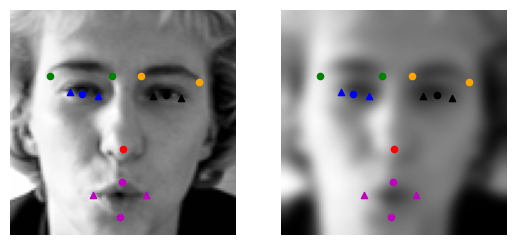

In [ ]:
a, b = img_blurb(train_data[i], train_labels[i], 2.5)
transform_compare(train_data[i], train_labels[i], a, b)

#### Contrast

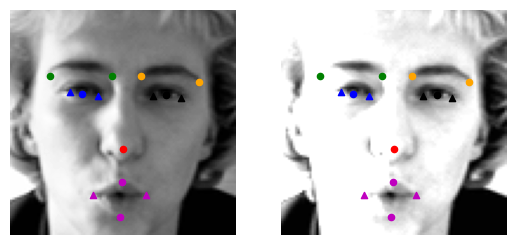

In [ ]:
a, b  = contrast_augment(train_data[i], train_labels[i], value=2)
transform_compare(train_data[i], train_labels[i], a, b)

#### Contrast Limited Adaptive Histogram Equalization (CLAHE)

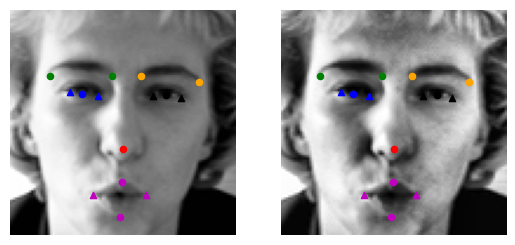

In [ ]:
a, b = CLAHE_contrast_augment(train_data[i], train_labels[i], value=3)
transform_compare(train_data[i], train_labels[i], a, b)

#### Brightness

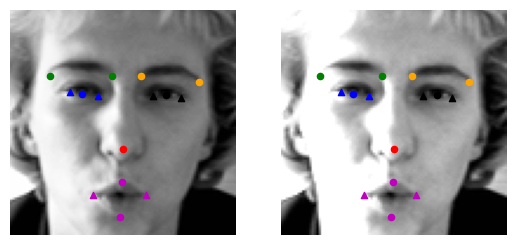

In [ ]:
a, b = brightness_augment(train_data[i], train_labels[i], value=70)
transform_compare(train_data[i], train_labels[i], a, b)

#### Rotation

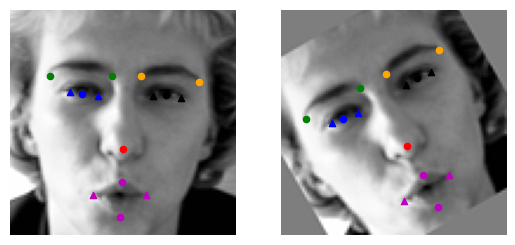

In [ ]:
a, b = rotate_augmentation(train_data[i], train_labels[i], 30)
transform_compare(train_data[i], train_labels[i], a, b)

#### Salt Noise

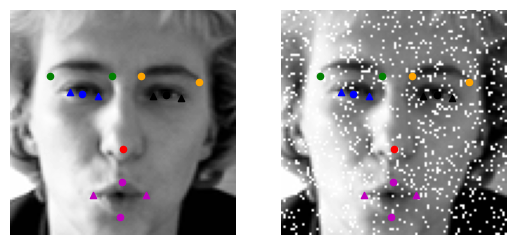

In [ ]:
a,b = img_sp_noise(train_data[i], train_labels[i], 0.1, 1) 
tranform_compare(train_data[i], train_labels[i], a, b)

#### Pepper Noise

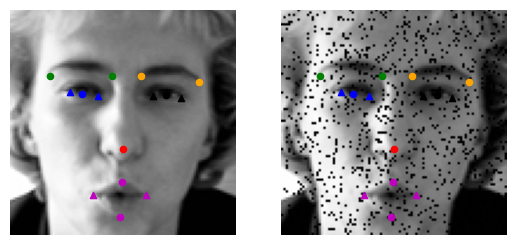

In [ ]:
a, b = img_sp_noise(train_data[i], train_labels[i], 0.1, 2)
tranform_compare(train_data[i], train_labels[i], a, b)

#### Gaussian Noise

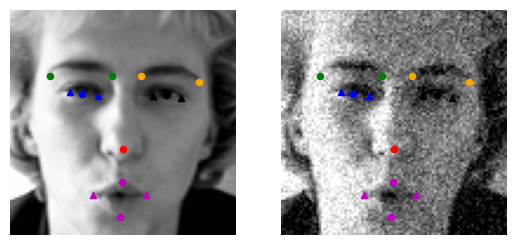

In [ ]:
a, b = img_gauss_noise(train_data[i], train_labels[i], 25)
tranform_compare(train_data[i], train_labels[i], a, b)

#### Horizontal Flip

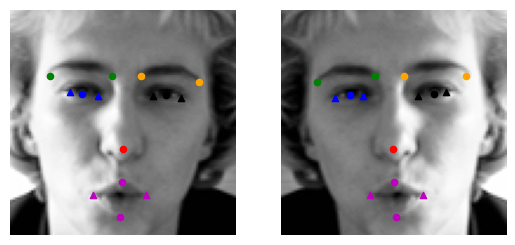

In [ ]:
a, b = img_xflip(train_data[i], train_labels[i])
tranform_compare(train_data[i], train_labels[i], a, b)

#### Vertical Flip

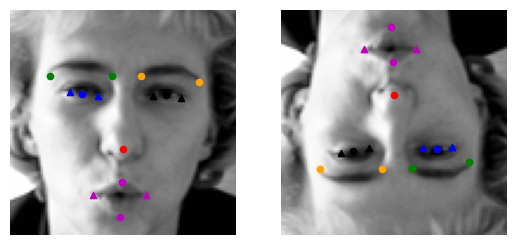

In [ ]:
a, b = img_yflip(train_data[i], train_labels[i])
tranform_compare(train_data[i], train_labels[i], a, b)

### Evaluation of the augmentations

The impact of each augmentation on the baseline model was evaluated on a range of values to see how much it impacted the model performance (validation RMSE). The baseline model was trained on a dataset with the augmentation applied to the train data for each value specified in the given range.

The following range of values were explored for the augmentations:

  - Gaussian Blur
    - sigma: 0 ~ 4
  - Contrast
    - contrast factor: 0 ~ 4 (excluding 1)
  - Contrast Limited Adaptive Histogram Equalization (CLAHE)
    - clipping limit: 0 ~ 4
  - Rotation 
    - angle: -60 ~ 60 (excluding 0)
  - Brightness
    - brightness factor: -100 ~ 100 (excluding 0)
  - Salt Noise
    - noise probability: 0 ~ 0.4
  - Gaussian Noise
    - distribution standard deviation: 0 ~ 40
  - Horizontal Flip
    - N/A
  - Vertical Flip
    - N/A

*It was determined that pepper noise would not be used given it's known poor performance

In [ ]:
def eval_augmentation(aug_func, values, model, init_weights, data, labels, verb=1):

  '''
  Uses an augmentation function to augment data and then train and evaluate a CNN model
  performance given each augmentation value provided. 
  '''

  # Capture all the histories and scores
  histories = []
  scores = []

  # Do a single split for train and validation data
  train_X, val_X, train_y, val_y = train_test_split(data, labels, random_state=42, test_size=0.2)

  # For the range of values to be evaluated, fit a model using data augmented 
  # with the value and check performance
  for value in values:

    augmented_data = []
    augmented_labels = []

    # For each sample and label in the train data, perform augmentation
    for sample, label in zip(train_X, train_y):

      # Augment the sample and label and then append them to the new lists
      new_img, new_label = aug_func(sample, label, value)
      augmented_data.append(new_img)
      augmented_labels.append(new_label)

    NPY_feature_show(new_img, new_label)
    plt.show()

    # Create the combined data and label sets
    train_data = np.vstack((train_X, augmented_data))
    train_labels = np.vstack((train_y, augmented_labels))

    train_data_scaled = train_data/255
    val_data_scaled = val_X/255

    # Reshape the data in matrix form to be used as input to the CNN
    img_rows = 96
    img_cols = 96

    train_data_cnn = train_data_scaled.reshape(train_data_scaled.shape[0], img_rows, img_cols, 1)
    val_data_cnn = val_data_scaled.reshape(val_data_scaled.shape[0], img_rows, img_cols, 1)

    # Load the same initial weights
    model.load_weights(init_weights)

    print(f"EVALUATING MODEL FOR {aug_func.__name__} WITH VALUE: {value}")

    histories.append(model.fit(train_data_cnn, train_labels, validation_data=(val_data_cnn, val_y), batch_size=BATCH_SIZE, epochs=100, verbose=verb))
    score = model.evaluate(val_data_cnn, val_y, verbose=0)
    scores.append(score)

    print(f"Validation RMSE: {score}")

  return histories, scores


#### Gaussian Blur

The baseline model was trained on the augmented dataset for each value. An example image after augmentation is plotted for each value.

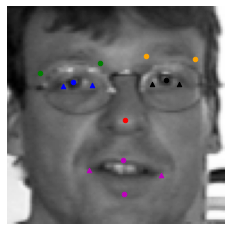

EVALUATING MODEL FOR img_blurb WITH VALUE: 0.5
Epoch 1/100
9/9 [==============================] - 15s 1s/step - loss: 1263.1336 - root_mean_squared_error: 34.6103 - val_loss: 194.6719 - val_root_mean_squared_error: 13.5342
Epoch 2/100
9/9 [==============================] - 1s 138ms/step - loss: 227.9573 - root_mean_squared_error: 14.6905 - val_loss: 161.4990 - val_root_mean_squared_error: 12.2005
Epoch 3/100
9/9 [==============================] - 1s 139ms/step - loss: 156.5020 - root_mean_squared_error: 11.9893 - val_loss: 125.0329 - val_root_mean_squared_error: 10.5874
Epoch 4/100
9/9 [==============================] - 1s 134ms/step - loss: 123.1812 - root_mean_squared_error: 10.4951 - val_loss: 102.0893 - val_root_mean_squared_error: 9.4320
Epoch 5/100
9/9 [==============================] - 1s 138ms/step - loss: 114.4797 - root_mean_squared_error: 10.0649 - val_loss: 107.7900 - val_root_mean_squared_error: 9.7398
Epoch 6/100
9/9 [==============================] - 1s 133ms/step - loss

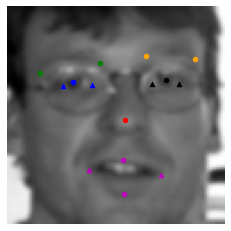

EVALUATING MODEL FOR img_blurb WITH VALUE: 1.0
Epoch 1/100
9/9 [==============================] - 1s 164ms/step - loss: 790.6750 - root_mean_squared_error: 27.7935 - val_loss: 242.7485 - val_root_mean_squared_error: 14.5080
Epoch 2/100
9/9 [==============================] - 1s 139ms/step - loss: 236.0826 - root_mean_squared_error: 13.9937 - val_loss: 184.4697 - val_root_mean_squared_error: 11.6771
Epoch 3/100
9/9 [==============================] - 1s 134ms/step - loss: 234.1448 - root_mean_squared_error: 13.5601 - val_loss: 247.8212 - val_root_mean_squared_error: 14.0063
Epoch 4/100
9/9 [==============================] - 1s 138ms/step - loss: 185.6548 - root_mean_squared_error: 11.5927 - val_loss: 157.0621 - val_root_mean_squared_error: 10.3359
Epoch 5/100
9/9 [==============================] - 1s 143ms/step - loss: 138.6066 - root_mean_squared_error: 9.4595 - val_loss: 107.8782 - val_root_mean_squared_error: 7.7691
Epoch 6/100
9/9 [==============================] - 1s 143ms/step - los

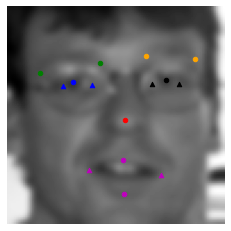

EVALUATING MODEL FOR img_blurb WITH VALUE: 1.5
Epoch 1/100
9/9 [==============================] - 1s 166ms/step - loss: 922.8526 - root_mean_squared_error: 30.0388 - val_loss: 380.8480 - val_root_mean_squared_error: 18.4792
Epoch 2/100
9/9 [==============================] - 1s 143ms/step - loss: 277.0501 - root_mean_squared_error: 15.0632 - val_loss: 223.7497 - val_root_mean_squared_error: 12.7708
Epoch 3/100
9/9 [==============================] - 1s 141ms/step - loss: 235.7009 - root_mean_squared_error: 13.1179 - val_loss: 206.8849 - val_root_mean_squared_error: 11.8873
Epoch 4/100
9/9 [==============================] - 1s 143ms/step - loss: 203.9495 - root_mean_squared_error: 11.7808 - val_loss: 192.6868 - val_root_mean_squared_error: 11.3479
Epoch 5/100
9/9 [==============================] - 1s 142ms/step - loss: 183.5227 - root_mean_squared_error: 11.0003 - val_loss: 161.4024 - val_root_mean_squared_error: 10.0466
Epoch 6/100
9/9 [==============================] - 1s 140ms/step - l

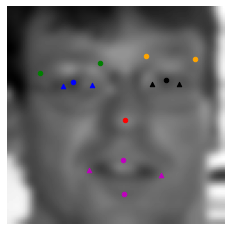

EVALUATING MODEL FOR img_blurb WITH VALUE: 2.0
Epoch 1/100
9/9 [==============================] - 1s 166ms/step - loss: 1008.7535 - root_mean_squared_error: 31.4225 - val_loss: 358.9436 - val_root_mean_squared_error: 17.8056
Epoch 2/100
9/9 [==============================] - 1s 152ms/step - loss: 274.1735 - root_mean_squared_error: 14.8514 - val_loss: 230.3887 - val_root_mean_squared_error: 12.8607
Epoch 3/100
9/9 [==============================] - 1s 142ms/step - loss: 234.3502 - root_mean_squared_error: 12.8906 - val_loss: 212.7822 - val_root_mean_squared_error: 11.9373
Epoch 4/100
9/9 [==============================] - 1s 140ms/step - loss: 192.4720 - root_mean_squared_error: 11.0746 - val_loss: 155.8632 - val_root_mean_squared_error: 9.3484
Epoch 5/100
9/9 [==============================] - 1s 139ms/step - loss: 154.4632 - root_mean_squared_error: 9.3544 - val_loss: 127.9600 - val_root_mean_squared_error: 7.9499
Epoch 6/100
9/9 [==============================] - 1s 141ms/step - los

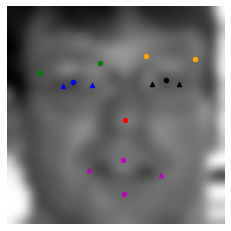

EVALUATING MODEL FOR img_blurb WITH VALUE: 2.5
Epoch 1/100
9/9 [==============================] - 1s 171ms/step - loss: 1032.1438 - root_mean_squared_error: 31.7861 - val_loss: 410.7241 - val_root_mean_squared_error: 19.1743
Epoch 2/100
9/9 [==============================] - 1s 136ms/step - loss: 322.4335 - root_mean_squared_error: 16.3483 - val_loss: 331.5964 - val_root_mean_squared_error: 16.2696
Epoch 3/100
9/9 [==============================] - 1s 136ms/step - loss: 271.7765 - root_mean_squared_error: 14.2006 - val_loss: 215.1348 - val_root_mean_squared_error: 11.9564
Epoch 4/100
9/9 [==============================] - 1s 138ms/step - loss: 217.7087 - root_mean_squared_error: 12.0860 - val_loss: 202.8611 - val_root_mean_squared_error: 11.5206
Epoch 5/100
9/9 [==============================] - 1s 138ms/step - loss: 191.0078 - root_mean_squared_error: 11.0674 - val_loss: 163.0559 - val_root_mean_squared_error: 9.8429
Epoch 6/100
9/9 [==============================] - 1s 137ms/step - l

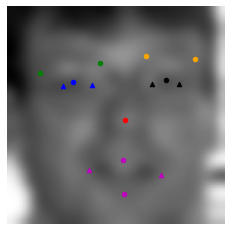

EVALUATING MODEL FOR img_blurb WITH VALUE: 3.0
Epoch 1/100
9/9 [==============================] - 1s 161ms/step - loss: 1023.9404 - root_mean_squared_error: 31.6610 - val_loss: 409.2837 - val_root_mean_squared_error: 19.1546
Epoch 2/100
9/9 [==============================] - 1s 139ms/step - loss: 304.4513 - root_mean_squared_error: 15.8164 - val_loss: 262.1092 - val_root_mean_squared_error: 14.0099
Epoch 3/100
9/9 [==============================] - 1s 136ms/step - loss: 245.6278 - root_mean_squared_error: 13.2897 - val_loss: 217.2214 - val_root_mean_squared_error: 12.0904
Epoch 4/100
9/9 [==============================] - 1s 181ms/step - loss: 215.5049 - root_mean_squared_error: 12.0420 - val_loss: 182.9655 - val_root_mean_squared_error: 10.6752
Epoch 5/100
9/9 [==============================] - 1s 138ms/step - loss: 186.5932 - root_mean_squared_error: 10.9176 - val_loss: 158.0867 - val_root_mean_squared_error: 9.6451
Epoch 6/100
9/9 [==============================] - 1s 136ms/step - l

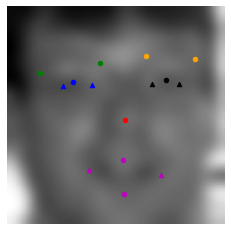

EVALUATING MODEL FOR img_blurb WITH VALUE: 3.5
Epoch 1/100
9/9 [==============================] - 1s 163ms/step - loss: 981.1081 - root_mean_squared_error: 30.9752 - val_loss: 424.6216 - val_root_mean_squared_error: 19.5436
Epoch 2/100
9/9 [==============================] - 1s 138ms/step - loss: 311.9680 - root_mean_squared_error: 16.0451 - val_loss: 276.4414 - val_root_mean_squared_error: 14.5094
Epoch 3/100
9/9 [==============================] - 1s 137ms/step - loss: 246.3529 - root_mean_squared_error: 13.3187 - val_loss: 210.8089 - val_root_mean_squared_error: 11.8314
Epoch 4/100
9/9 [==============================] - 1s 138ms/step - loss: 213.2826 - root_mean_squared_error: 11.9620 - val_loss: 192.2227 - val_root_mean_squared_error: 11.1182
Epoch 5/100
9/9 [==============================] - 1s 141ms/step - loss: 183.2167 - root_mean_squared_error: 10.7821 - val_loss: 154.7967 - val_root_mean_squared_error: 9.4982
Epoch 6/100
9/9 [==============================] - 1s 139ms/step - lo

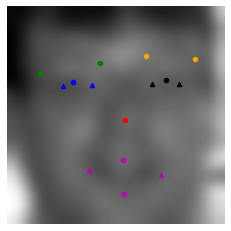

EVALUATING MODEL FOR img_blurb WITH VALUE: 4.0
Epoch 1/100
9/9 [==============================] - 1s 169ms/step - loss: 1127.3390 - root_mean_squared_error: 33.2442 - val_loss: 421.2372 - val_root_mean_squared_error: 19.4118
Epoch 2/100
9/9 [==============================] - 1s 140ms/step - loss: 340.7290 - root_mean_squared_error: 16.8444 - val_loss: 295.5426 - val_root_mean_squared_error: 15.0482
Epoch 3/100
9/9 [==============================] - 1s 138ms/step - loss: 264.8911 - root_mean_squared_error: 13.8763 - val_loss: 224.5870 - val_root_mean_squared_error: 12.2580
Epoch 4/100
9/9 [==============================] - 1s 140ms/step - loss: 219.2547 - root_mean_squared_error: 12.0651 - val_loss: 187.8064 - val_root_mean_squared_error: 10.7589
Epoch 5/100
9/9 [==============================] - 1s 136ms/step - loss: 186.3034 - root_mean_squared_error: 10.7688 - val_loss: 160.4699 - val_root_mean_squared_error: 9.6233
Epoch 6/100
9/9 [==============================] - 1s 139ms/step - l

In [ ]:
# Check the range of values for Gaussian blur
gblur_values = np.linspace(0.5, 4, 8)

gblur_histories, gblur_scores = eval_augmentation(img_blurb, gblur_values, model, path + initial_weights, train_data, train_labels)

The impact of the augmentation values on the model performance was plotted. From the plot, it was determined that a good cut-off point would be 1 ~ 3.

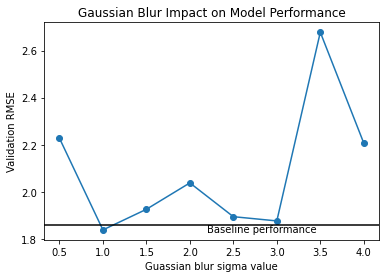

In [ ]:
# Plot the impact on the baseline model performance
plt.plot(gblur_values, np.array(gblur_scores)[:,1], marker='o')
plt.axhline(y=1.86, color='black')

plt.title("Gaussian Blur Impact on Model Performance")
plt.xlabel("Guassian blur sigma value")
plt.ylabel("Validation RMSE")
plt.annotate("Baseline performance", (2.2, 1.83))
plt.show()

#### Contrast

The baseline model was trained on the augmented dataset for each value. An example image after augmentation is plotted for each value.

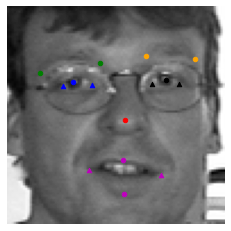

EVALUATING MODEL FOR contrast_augment WITH VALUE: 0.5
Epoch 1/100
9/9 [==============================] - 1s 162ms/step - loss: 969.1212 - root_mean_squared_error: 30.7952 - val_loss: 299.7919 - val_root_mean_squared_error: 16.1572
Epoch 2/100
9/9 [==============================] - 1s 174ms/step - loss: 489.1075 - root_mean_squared_error: 21.0104 - val_loss: 348.9980 - val_root_mean_squared_error: 17.1293
Epoch 3/100
9/9 [==============================] - 1s 135ms/step - loss: 310.7627 - root_mean_squared_error: 15.9261 - val_loss: 134.0382 - val_root_mean_squared_error: 8.7436
Epoch 4/100
9/9 [==============================] - 1s 137ms/step - loss: 193.0020 - root_mean_squared_error: 11.6649 - val_loss: 214.2505 - val_root_mean_squared_error: 12.5908
Epoch 5/100
9/9 [==============================] - 1s 143ms/step - loss: 122.7114 - root_mean_squared_error: 8.2737 - val_loss: 85.6228 - val_root_mean_squared_error: 5.8074
Epoch 6/100
9/9 [==============================] - 1s 139ms/step 

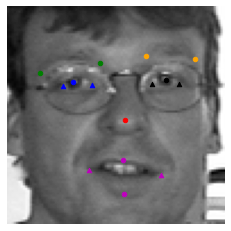

EVALUATING MODEL FOR contrast_augment WITH VALUE: 1.0
Epoch 1/100
9/9 [==============================] - 1s 165ms/step - loss: 1912.4347 - root_mean_squared_error: 43.4266 - val_loss: 438.3087 - val_root_mean_squared_error: 19.4795
Epoch 2/100
9/9 [==============================] - 1s 133ms/step - loss: 383.9054 - root_mean_squared_error: 17.4998 - val_loss: 282.0601 - val_root_mean_squared_error: 13.6383
Epoch 3/100
9/9 [==============================] - 1s 137ms/step - loss: 295.8300 - root_mean_squared_error: 13.9450 - val_loss: 257.7359 - val_root_mean_squared_error: 12.3585
Epoch 4/100
9/9 [==============================] - 1s 131ms/step - loss: 252.1688 - root_mean_squared_error: 12.1495 - val_loss: 199.3092 - val_root_mean_squared_error: 9.8248
Epoch 5/100
9/9 [==============================] - 1s 131ms/step - loss: 185.0204 - root_mean_squared_error: 9.1823 - val_loss: 162.1090 - val_root_mean_squared_error: 8.0278
Epoch 6/100
9/9 [==============================] - 1s 135ms/ste

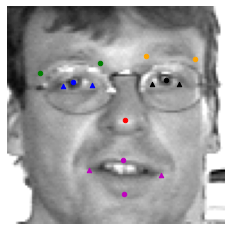

EVALUATING MODEL FOR contrast_augment WITH VALUE: 1.5
Epoch 1/100
9/9 [==============================] - 1s 170ms/step - loss: 2010.9832 - root_mean_squared_error: 44.5635 - val_loss: 385.6584 - val_root_mean_squared_error: 18.2106
Epoch 2/100
9/9 [==============================] - 1s 146ms/step - loss: 534.7729 - root_mean_squared_error: 21.5379 - val_loss: 273.4975 - val_root_mean_squared_error: 13.6363
Epoch 3/100
9/9 [==============================] - 1s 143ms/step - loss: 347.1360 - root_mean_squared_error: 15.9576 - val_loss: 446.7871 - val_root_mean_squared_error: 18.7291
Epoch 4/100
9/9 [==============================] - 1s 139ms/step - loss: 280.4456 - root_mean_squared_error: 13.5908 - val_loss: 278.1960 - val_root_mean_squared_error: 13.5606
Epoch 5/100
9/9 [==============================] - 1s 141ms/step - loss: 229.9070 - root_mean_squared_error: 11.7228 - val_loss: 231.3830 - val_root_mean_squared_error: 11.8993
Epoch 6/100
9/9 [==============================] - 1s 141ms/

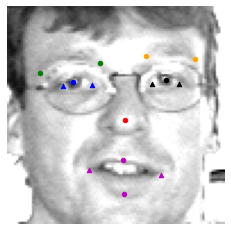

EVALUATING MODEL FOR contrast_augment WITH VALUE: 2.0
Epoch 1/100
9/9 [==============================] - 1s 163ms/step - loss: 1961.2634 - root_mean_squared_error: 44.0111 - val_loss: 327.9007 - val_root_mean_squared_error: 16.6181
Epoch 2/100
9/9 [==============================] - 1s 137ms/step - loss: 552.5939 - root_mean_squared_error: 22.0153 - val_loss: 308.4757 - val_root_mean_squared_error: 14.9814
Epoch 3/100
9/9 [==============================] - 1s 138ms/step - loss: 378.5863 - root_mean_squared_error: 17.0185 - val_loss: 461.2767 - val_root_mean_squared_error: 19.2012
Epoch 4/100
9/9 [==============================] - 1s 135ms/step - loss: 304.1103 - root_mean_squared_error: 14.5476 - val_loss: 342.8879 - val_root_mean_squared_error: 15.8622
Epoch 5/100
9/9 [==============================] - 1s 139ms/step - loss: 255.8380 - root_mean_squared_error: 12.8933 - val_loss: 351.7546 - val_root_mean_squared_error: 16.2691
Epoch 6/100
9/9 [==============================] - 1s 137ms/

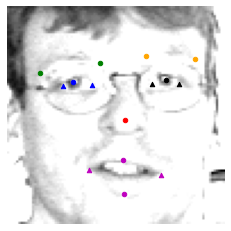

EVALUATING MODEL FOR contrast_augment WITH VALUE: 2.5
Epoch 1/100
9/9 [==============================] - 1s 167ms/step - loss: 2073.6147 - root_mean_squared_error: 45.2741 - val_loss: 465.7053 - val_root_mean_squared_error: 20.3778
Epoch 2/100
9/9 [==============================] - 1s 137ms/step - loss: 581.6137 - root_mean_squared_error: 22.7052 - val_loss: 356.2040 - val_root_mean_squared_error: 16.5682
Epoch 3/100
9/9 [==============================] - 1s 140ms/step - loss: 393.6779 - root_mean_squared_error: 17.5255 - val_loss: 360.0551 - val_root_mean_squared_error: 16.4284
Epoch 4/100
9/9 [==============================] - 1s 143ms/step - loss: 320.5044 - root_mean_squared_error: 15.1780 - val_loss: 476.2937 - val_root_mean_squared_error: 19.6777
Epoch 5/100
9/9 [==============================] - 1s 145ms/step - loss: 269.4604 - root_mean_squared_error: 13.4877 - val_loss: 300.8900 - val_root_mean_squared_error: 14.6864
Epoch 6/100
9/9 [==============================] - 1s 134ms/

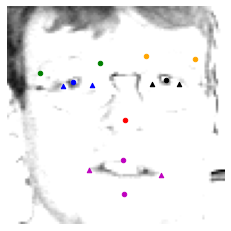

EVALUATING MODEL FOR contrast_augment WITH VALUE: 3.0
Epoch 1/100
9/9 [==============================] - 1s 162ms/step - loss: 1947.3402 - root_mean_squared_error: 43.8679 - val_loss: 329.9260 - val_root_mean_squared_error: 16.8046
Epoch 2/100
9/9 [==============================] - 1s 138ms/step - loss: 602.6769 - root_mean_squared_error: 23.2535 - val_loss: 320.2947 - val_root_mean_squared_error: 15.6187
Epoch 3/100
9/9 [==============================] - 1s 141ms/step - loss: 429.5453 - root_mean_squared_error: 18.6749 - val_loss: 350.0291 - val_root_mean_squared_error: 16.3062
Epoch 4/100
9/9 [==============================] - 1s 141ms/step - loss: 344.2055 - root_mean_squared_error: 16.1276 - val_loss: 552.4849 - val_root_mean_squared_error: 21.6645
Epoch 5/100
9/9 [==============================] - 1s 137ms/step - loss: 290.5820 - root_mean_squared_error: 14.4523 - val_loss: 330.8763 - val_root_mean_squared_error: 15.8531
Epoch 6/100
9/9 [==============================] - 1s 139ms/

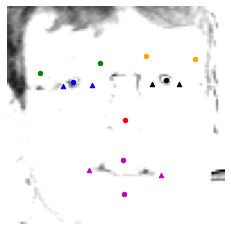

EVALUATING MODEL FOR contrast_augment WITH VALUE: 3.5
Epoch 1/100
9/9 [==============================] - 1s 168ms/step - loss: 1781.3398 - root_mean_squared_error: 41.9372 - val_loss: 217.4952 - val_root_mean_squared_error: 13.0745
Epoch 2/100
9/9 [==============================] - 1s 135ms/step - loss: 619.6884 - root_mean_squared_error: 23.6468 - val_loss: 322.5454 - val_root_mean_squared_error: 15.7515
Epoch 3/100
9/9 [==============================] - 1s 141ms/step - loss: 416.0360 - root_mean_squared_error: 18.3668 - val_loss: 436.6733 - val_root_mean_squared_error: 18.8359
Epoch 4/100
9/9 [==============================] - 1s 141ms/step - loss: 324.8250 - root_mean_squared_error: 15.5884 - val_loss: 507.9153 - val_root_mean_squared_error: 20.6654
Epoch 5/100
9/9 [==============================] - 1s 140ms/step - loss: 277.0833 - root_mean_squared_error: 14.0578 - val_loss: 361.4828 - val_root_mean_squared_error: 16.8561
Epoch 6/100
9/9 [==============================] - 1s 137ms/

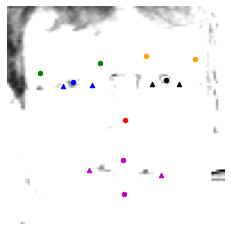

EVALUATING MODEL FOR contrast_augment WITH VALUE: 4.0
Epoch 1/100
9/9 [==============================] - 1s 167ms/step - loss: 1829.6893 - root_mean_squared_error: 42.5101 - val_loss: 245.9181 - val_root_mean_squared_error: 14.1206
Epoch 2/100
9/9 [==============================] - 1s 145ms/step - loss: 605.5772 - root_mean_squared_error: 23.3477 - val_loss: 292.1396 - val_root_mean_squared_error: 14.7590
Epoch 3/100
9/9 [==============================] - 1s 150ms/step - loss: 436.8113 - root_mean_squared_error: 18.9286 - val_loss: 385.8517 - val_root_mean_squared_error: 17.4413
Epoch 4/100
9/9 [==============================] - 1s 145ms/step - loss: 339.2389 - root_mean_squared_error: 16.0516 - val_loss: 500.3831 - val_root_mean_squared_error: 20.4884
Epoch 5/100
9/9 [==============================] - 1s 141ms/step - loss: 282.9618 - root_mean_squared_error: 14.2735 - val_loss: 367.6394 - val_root_mean_squared_error: 17.0438
Epoch 6/100
9/9 [==============================] - 1s 143ms/

In [ ]:
# Check the range of values for contrast
contrast_values = np.linspace(0.5, 4, 8)

contrast_histories, contrast_scores = eval_augmentation(contrast_augment, contrast_values, model, path + initial_weights, train_data, train_labels)

The impact of the augmentation values on the model performance was plotted. From the plot, it was determined that all the values were within a suitable range of the baseline model performance.

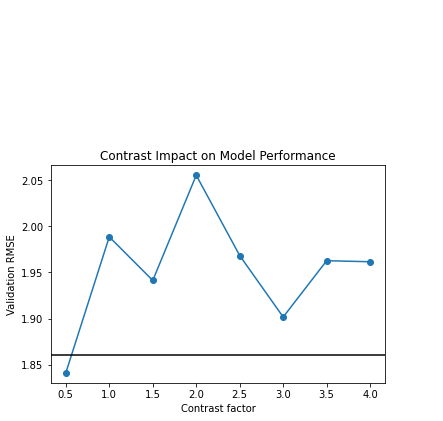

In [ ]:
# Plot the impact on the baseline model performance

plt.plot(contrast_values, np.array(contrast_scores)[:,1], marker='o')
plt.axhline(y=1.86, color='black')

plt.title("Contrast Impact on Model Performance")
plt.xlabel("Contrast factor")
plt.ylabel("Validation RMSE")
plt.annotate("Baseline performance", (3.5, 2.23))
plt.show()

#### Contrast Limited Adaptive Histogram Equalization (CLAHE)

The baseline model was trained on the augmented dataset for each value. An example image after augmentation is plotted for each value.

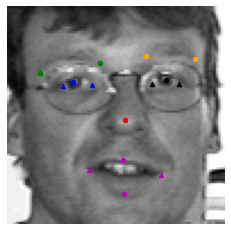

EVALUATING MODEL FOR CLAHE_contrast_augment WITH VALUE: 0.5
Epoch 1/100
9/9 [==============================] - 1s 161ms/step - loss: 884.2267 - root_mean_squared_error: 29.3940 - val_loss: 384.8278 - val_root_mean_squared_error: 18.6391
Epoch 2/100
9/9 [==============================] - 1s 137ms/step - loss: 262.1691 - root_mean_squared_error: 14.6949 - val_loss: 270.5901 - val_root_mean_squared_error: 14.7078
Epoch 3/100
9/9 [==============================] - 1s 136ms/step - loss: 197.7207 - root_mean_squared_error: 11.9026 - val_loss: 179.0575 - val_root_mean_squared_error: 11.0534
Epoch 4/100
9/9 [==============================] - 1s 150ms/step - loss: 164.1601 - root_mean_squared_error: 10.3909 - val_loss: 142.1601 - val_root_mean_squared_error: 9.3438
Epoch 5/100
9/9 [==============================] - 1s 138ms/step - loss: 122.5403 - root_mean_squared_error: 8.2921 - val_loss: 109.7496 - val_root_mean_squared_error: 7.5822
Epoch 6/100
9/9 [==============================] - 1s 135m

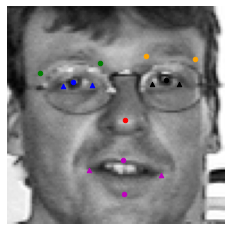

EVALUATING MODEL FOR CLAHE_contrast_augment WITH VALUE: 1.0
Epoch 1/100
9/9 [==============================] - 1s 172ms/step - loss: 891.1036 - root_mean_squared_error: 29.4671 - val_loss: 321.4019 - val_root_mean_squared_error: 16.5988
Epoch 2/100
9/9 [==============================] - 1s 139ms/step - loss: 235.6835 - root_mean_squared_error: 13.3144 - val_loss: 256.8341 - val_root_mean_squared_error: 13.6627
Epoch 3/100
9/9 [==============================] - 1s 138ms/step - loss: 202.8850 - root_mean_squared_error: 11.3958 - val_loss: 211.5044 - val_root_mean_squared_error: 11.7063
Epoch 4/100
9/9 [==============================] - 1s 142ms/step - loss: 173.7032 - root_mean_squared_error: 10.0118 - val_loss: 198.1022 - val_root_mean_squared_error: 11.2564
Epoch 5/100
9/9 [==============================] - 1s 140ms/step - loss: 149.7439 - root_mean_squared_error: 8.9619 - val_loss: 167.5955 - val_root_mean_squared_error: 10.0462
Epoch 6/100
9/9 [==============================] - 1s 13

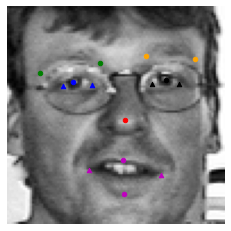

EVALUATING MODEL FOR CLAHE_contrast_augment WITH VALUE: 1.5
Epoch 1/100
9/9 [==============================] - 1s 172ms/step - loss: 1176.3016 - root_mean_squared_error: 33.9505 - val_loss: 408.4064 - val_root_mean_squared_error: 18.9567
Epoch 2/100
9/9 [==============================] - 1s 150ms/step - loss: 294.9853 - root_mean_squared_error: 15.2201 - val_loss: 277.1960 - val_root_mean_squared_error: 14.1469
Epoch 3/100
9/9 [==============================] - 1s 151ms/step - loss: 228.2819 - root_mean_squared_error: 12.1460 - val_loss: 276.9191 - val_root_mean_squared_error: 13.9251
Epoch 4/100
9/9 [==============================] - 1s 145ms/step - loss: 191.6052 - root_mean_squared_error: 10.4564 - val_loss: 204.0999 - val_root_mean_squared_error: 11.1221
Epoch 5/100
9/9 [==============================] - 1s 145ms/step - loss: 170.6176 - root_mean_squared_error: 9.6020 - val_loss: 178.6396 - val_root_mean_squared_error: 10.1518
Epoch 6/100
9/9 [==============================] - 1s 1

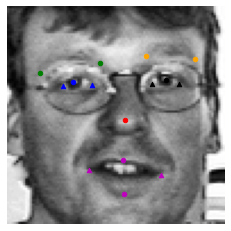

EVALUATING MODEL FOR CLAHE_contrast_augment WITH VALUE: 2.0
Epoch 1/100
9/9 [==============================] - 1s 174ms/step - loss: 1273.5548 - root_mean_squared_error: 35.3541 - val_loss: 323.2867 - val_root_mean_squared_error: 16.5650
Epoch 2/100
9/9 [==============================] - 1s 152ms/step - loss: 310.9090 - root_mean_squared_error: 15.7409 - val_loss: 391.9881 - val_root_mean_squared_error: 17.7514
Epoch 3/100
9/9 [==============================] - 1s 148ms/step - loss: 234.5968 - root_mean_squared_error: 12.4078 - val_loss: 230.8096 - val_root_mean_squared_error: 12.1575
Epoch 4/100
9/9 [==============================] - 1s 145ms/step - loss: 191.5856 - root_mean_squared_error: 10.4531 - val_loss: 227.4483 - val_root_mean_squared_error: 12.1212
Epoch 5/100
9/9 [==============================] - 1s 147ms/step - loss: 173.4831 - root_mean_squared_error: 9.7409 - val_loss: 221.9662 - val_root_mean_squared_error: 12.0894
Epoch 6/100
9/9 [==============================] - 1s 1

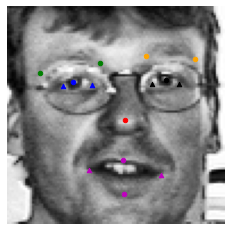

EVALUATING MODEL FOR CLAHE_contrast_augment WITH VALUE: 2.5
Epoch 1/100
9/9 [==============================] - 1s 175ms/step - loss: 1212.6370 - root_mean_squared_error: 34.4825 - val_loss: 470.5441 - val_root_mean_squared_error: 20.5395
Epoch 2/100
9/9 [==============================] - 1s 142ms/step - loss: 337.7804 - root_mean_squared_error: 16.5808 - val_loss: 333.4025 - val_root_mean_squared_error: 16.0270
Epoch 3/100
9/9 [==============================] - 1s 148ms/step - loss: 231.1145 - root_mean_squared_error: 12.2819 - val_loss: 233.6199 - val_root_mean_squared_error: 12.2899
Epoch 4/100
9/9 [==============================] - 1s 140ms/step - loss: 191.5525 - root_mean_squared_error: 10.4733 - val_loss: 231.1368 - val_root_mean_squared_error: 12.2928
Epoch 5/100
9/9 [==============================] - 1s 144ms/step - loss: 171.4205 - root_mean_squared_error: 9.6619 - val_loss: 217.5990 - val_root_mean_squared_error: 11.9311
Epoch 6/100
9/9 [==============================] - 1s 1

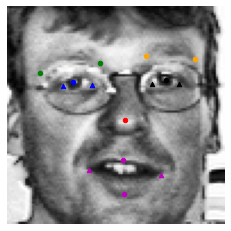

EVALUATING MODEL FOR CLAHE_contrast_augment WITH VALUE: 3.0
Epoch 1/100
9/9 [==============================] - 1s 164ms/step - loss: 1289.6934 - root_mean_squared_error: 35.5806 - val_loss: 387.0145 - val_root_mean_squared_error: 18.3762
Epoch 2/100
9/9 [==============================] - 1s 146ms/step - loss: 354.8071 - root_mean_squared_error: 17.0550 - val_loss: 418.8820 - val_root_mean_squared_error: 18.4608
Epoch 3/100
9/9 [==============================] - 1s 139ms/step - loss: 236.0434 - root_mean_squared_error: 12.4105 - val_loss: 239.2321 - val_root_mean_squared_error: 12.4374
Epoch 4/100
9/9 [==============================] - 1s 178ms/step - loss: 206.6062 - root_mean_squared_error: 11.0781 - val_loss: 287.4930 - val_root_mean_squared_error: 14.3321
Epoch 5/100
9/9 [==============================] - 1s 143ms/step - loss: 182.9350 - root_mean_squared_error: 10.1392 - val_loss: 206.0832 - val_root_mean_squared_error: 11.3485
Epoch 6/100
9/9 [==============================] - 1s 

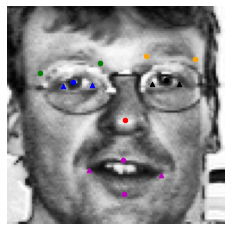

EVALUATING MODEL FOR CLAHE_contrast_augment WITH VALUE: 3.5
Epoch 1/100
9/9 [==============================] - 1s 167ms/step - loss: 1235.9915 - root_mean_squared_error: 34.8150 - val_loss: 418.0495 - val_root_mean_squared_error: 19.1989
Epoch 2/100
9/9 [==============================] - 1s 142ms/step - loss: 334.2534 - root_mean_squared_error: 16.4439 - val_loss: 402.0411 - val_root_mean_squared_error: 18.0088
Epoch 3/100
9/9 [==============================] - 1s 141ms/step - loss: 234.8075 - root_mean_squared_error: 12.3815 - val_loss: 239.9857 - val_root_mean_squared_error: 12.4955
Epoch 4/100
9/9 [==============================] - 1s 141ms/step - loss: 202.6974 - root_mean_squared_error: 10.9358 - val_loss: 289.0572 - val_root_mean_squared_error: 14.4166
Epoch 5/100
9/9 [==============================] - 1s 140ms/step - loss: 180.7550 - root_mean_squared_error: 10.0760 - val_loss: 216.2813 - val_root_mean_squared_error: 11.8292
Epoch 6/100
9/9 [==============================] - 1s 

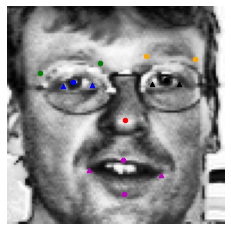

EVALUATING MODEL FOR CLAHE_contrast_augment WITH VALUE: 4.0
Epoch 1/100
9/9 [==============================] - 1s 173ms/step - loss: 1300.8435 - root_mean_squared_error: 35.7305 - val_loss: 331.1281 - val_root_mean_squared_error: 16.7546
Epoch 2/100
9/9 [==============================] - 1s 138ms/step - loss: 341.2238 - root_mean_squared_error: 16.6121 - val_loss: 462.4678 - val_root_mean_squared_error: 19.5673
Epoch 3/100
9/9 [==============================] - 1s 138ms/step - loss: 247.8578 - root_mean_squared_error: 12.8192 - val_loss: 241.5644 - val_root_mean_squared_error: 12.4730
Epoch 4/100
9/9 [==============================] - 1s 137ms/step - loss: 207.6212 - root_mean_squared_error: 11.0620 - val_loss: 243.6415 - val_root_mean_squared_error: 12.6609
Epoch 5/100
9/9 [==============================] - 1s 142ms/step - loss: 177.5498 - root_mean_squared_error: 9.8108 - val_loss: 253.5088 - val_root_mean_squared_error: 13.2351
Epoch 6/100
9/9 [==============================] - 1s 1

In [ ]:
# Check the range of values for CLAHE
CLAHE_values = np.linspace(0.5, 4, 8)
CLAHE_histories, CLAHE_scores = eval_augmentation(CLAHE_contrast_augment, CLAHE_values, model, path + initial_weights, train_data, train_labels)

The impact of the augmentation values on the model performance was plotted. From the plot, it was determined that all the values were within a suitable range of the baseline model performance.


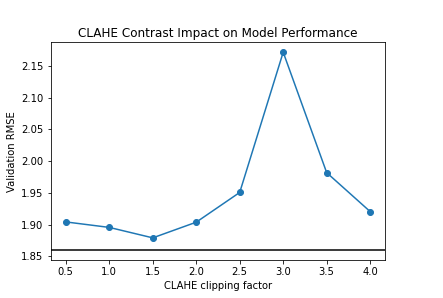

In [ ]:
# Plot the impact on the baseline model performance

plt.plot(CLAHE_values, np.array(CLAHE_scores)[:,1], marker='o')
plt.axhline(y=1.86, color='black')

plt.title("CLAHE Contrast Impact on Model Performance")
plt.xlabel("CLAHE clipping factor")
plt.ylabel("Validation RMSE")
plt.annotate("Baseline performance", (3.5, 2.23))
plt.show()

#### Brightness Augmentation

The baseline model was trained on the augmented dataset for each value. An example image after augmentation is plotted for each value.

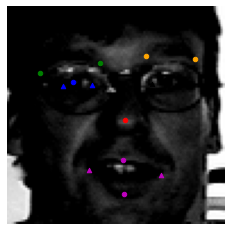

EVALUATING MODEL FOR brightness_augment WITH VALUE: -100
Epoch 1/100
9/9 [==============================] - 1s 162ms/step - loss: 1475.4308 - root_mean_squared_error: 38.0942 - val_loss: 744.5162 - val_root_mean_squared_error: 26.4157
Epoch 2/100
9/9 [==============================] - 1s 134ms/step - loss: 496.2596 - root_mean_squared_error: 20.8737 - val_loss: 371.9246 - val_root_mean_squared_error: 17.2980
Epoch 3/100
9/9 [==============================] - 1s 135ms/step - loss: 380.7768 - root_mean_squared_error: 17.4813 - val_loss: 1205.0253 - val_root_mean_squared_error: 33.6091
Epoch 4/100
9/9 [==============================] - 1s 171ms/step - loss: 404.1786 - root_mean_squared_error: 18.1894 - val_loss: 338.9406 - val_root_mean_squared_error: 16.4235
Epoch 5/100
9/9 [==============================] - 1s 133ms/step - loss: 215.0741 - root_mean_squared_error: 12.1879 - val_loss: 240.0607 - val_root_mean_squared_error: 13.3497
Epoch 6/100
9/9 [==============================] - 1s 13

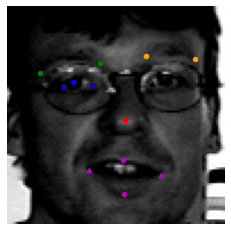

EVALUATING MODEL FOR brightness_augment WITH VALUE: -80
Epoch 1/100
9/9 [==============================] - 1s 157ms/step - loss: 1017.3556 - root_mean_squared_error: 31.5274 - val_loss: 310.3432 - val_root_mean_squared_error: 16.2222
Epoch 2/100
9/9 [==============================] - 1s 135ms/step - loss: 459.3706 - root_mean_squared_error: 19.9721 - val_loss: 730.7958 - val_root_mean_squared_error: 25.6671
Epoch 3/100
9/9 [==============================] - 1s 131ms/step - loss: 321.7151 - root_mean_squared_error: 15.7084 - val_loss: 236.4527 - val_root_mean_squared_error: 12.6420
Epoch 4/100
9/9 [==============================] - 1s 133ms/step - loss: 218.0302 - root_mean_squared_error: 11.9693 - val_loss: 204.0875 - val_root_mean_squared_error: 11.4819
Epoch 5/100
9/9 [==============================] - 1s 132ms/step - loss: 171.1199 - root_mean_squared_error: 10.0555 - val_loss: 179.0662 - val_root_mean_squared_error: 10.5998
Epoch 6/100
9/9 [==============================] - 1s 133m

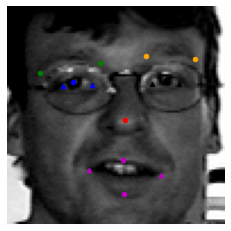

EVALUATING MODEL FOR brightness_augment WITH VALUE: -60
Epoch 1/100
9/9 [==============================] - 1s 164ms/step - loss: 974.2792 - root_mean_squared_error: 30.8299 - val_loss: 331.2134 - val_root_mean_squared_error: 16.8077
Epoch 2/100
9/9 [==============================] - 1s 136ms/step - loss: 417.1727 - root_mean_squared_error: 18.7894 - val_loss: 530.0180 - val_root_mean_squared_error: 21.2336
Epoch 3/100
9/9 [==============================] - 1s 137ms/step - loss: 322.9264 - root_mean_squared_error: 15.4724 - val_loss: 231.8542 - val_root_mean_squared_error: 12.0509
Epoch 4/100
9/9 [==============================] - 1s 138ms/step - loss: 243.1872 - root_mean_squared_error: 12.5697 - val_loss: 228.3327 - val_root_mean_squared_error: 12.0704
Epoch 5/100
9/9 [==============================] - 1s 136ms/step - loss: 188.6403 - root_mean_squared_error: 10.4085 - val_loss: 184.0846 - val_root_mean_squared_error: 10.3466
Epoch 6/100
9/9 [==============================] - 1s 136ms

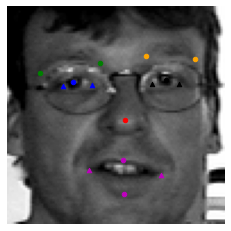

EVALUATING MODEL FOR brightness_augment WITH VALUE: -40
Epoch 1/100
9/9 [==============================] - 2s 200ms/step - loss: 1240.7217 - root_mean_squared_error: 34.8848 - val_loss: 324.0847 - val_root_mean_squared_error: 16.5885
Epoch 2/100
9/9 [==============================] - 1s 136ms/step - loss: 386.7412 - root_mean_squared_error: 17.9709 - val_loss: 405.7101 - val_root_mean_squared_error: 18.0852
Epoch 3/100
9/9 [==============================] - 1s 138ms/step - loss: 309.6927 - root_mean_squared_error: 15.0504 - val_loss: 230.3798 - val_root_mean_squared_error: 11.9980
Epoch 4/100
9/9 [==============================] - 1s 137ms/step - loss: 210.2859 - root_mean_squared_error: 11.1355 - val_loss: 210.4673 - val_root_mean_squared_error: 11.2066
Epoch 5/100
9/9 [==============================] - 1s 134ms/step - loss: 164.4867 - root_mean_squared_error: 9.0380 - val_loss: 146.3955 - val_root_mean_squared_error: 8.1716
Epoch 6/100
9/9 [==============================] - 1s 132ms/

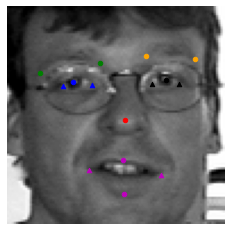

EVALUATING MODEL FOR brightness_augment WITH VALUE: -20
Epoch 1/100
9/9 [==============================] - 1s 163ms/step - loss: 1253.0985 - root_mean_squared_error: 35.0680 - val_loss: 358.5336 - val_root_mean_squared_error: 17.6236
Epoch 2/100
9/9 [==============================] - 1s 176ms/step - loss: 346.9995 - root_mean_squared_error: 16.8673 - val_loss: 249.8707 - val_root_mean_squared_error: 13.1539
Epoch 3/100
9/9 [==============================] - 1s 137ms/step - loss: 258.6264 - root_mean_squared_error: 13.3238 - val_loss: 204.2578 - val_root_mean_squared_error: 10.9623
Epoch 4/100
9/9 [==============================] - 1s 141ms/step - loss: 194.5655 - root_mean_squared_error: 10.5191 - val_loss: 159.0293 - val_root_mean_squared_error: 8.7275
Epoch 5/100
9/9 [==============================] - 1s 139ms/step - loss: 151.6999 - root_mean_squared_error: 8.3903 - val_loss: 158.0099 - val_root_mean_squared_error: 8.8998
Epoch 6/100
9/9 [==============================] - 1s 138ms/s

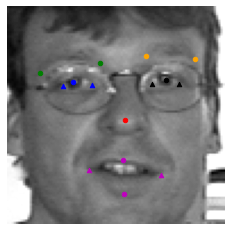

EVALUATING MODEL FOR brightness_augment WITH VALUE: 20
Epoch 1/100
9/9 [==============================] - 1s 160ms/step - loss: 1662.6162 - root_mean_squared_error: 40.4851 - val_loss: 350.8675 - val_root_mean_squared_error: 17.3513
Epoch 2/100
9/9 [==============================] - 1s 176ms/step - loss: 440.5910 - root_mean_squared_error: 19.3591 - val_loss: 372.2391 - val_root_mean_squared_error: 17.0388
Epoch 3/100
9/9 [==============================] - 1s 135ms/step - loss: 316.3949 - root_mean_squared_error: 15.1481 - val_loss: 272.8706 - val_root_mean_squared_error: 13.4993
Epoch 4/100
9/9 [==============================] - 1s 137ms/step - loss: 245.6777 - root_mean_squared_error: 12.4559 - val_loss: 296.1001 - val_root_mean_squared_error: 14.3808
Epoch 5/100
9/9 [==============================] - 1s 137ms/step - loss: 222.8792 - root_mean_squared_error: 11.6317 - val_loss: 189.4844 - val_root_mean_squared_error: 10.2208
Epoch 6/100
9/9 [==============================] - 1s 138ms

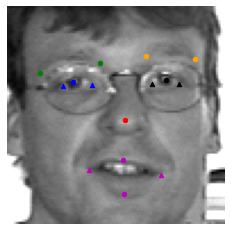

EVALUATING MODEL FOR brightness_augment WITH VALUE: 40
Epoch 1/100
9/9 [==============================] - 1s 159ms/step - loss: 1491.3269 - root_mean_squared_error: 38.3226 - val_loss: 301.3217 - val_root_mean_squared_error: 15.9491
Epoch 2/100
9/9 [==============================] - 1s 134ms/step - loss: 478.5857 - root_mean_squared_error: 20.4226 - val_loss: 343.5853 - val_root_mean_squared_error: 16.3567
Epoch 3/100
9/9 [==============================] - 1s 140ms/step - loss: 331.1735 - root_mean_squared_error: 15.8339 - val_loss: 498.0755 - val_root_mean_squared_error: 20.3577
Epoch 4/100
9/9 [==============================] - 1s 140ms/step - loss: 277.8928 - root_mean_squared_error: 13.9444 - val_loss: 256.7978 - val_root_mean_squared_error: 13.2131
Epoch 5/100
9/9 [==============================] - 1s 137ms/step - loss: 220.7144 - root_mean_squared_error: 11.8377 - val_loss: 223.5064 - val_root_mean_squared_error: 12.0562
Epoch 6/100
9/9 [==============================] - 1s 133ms

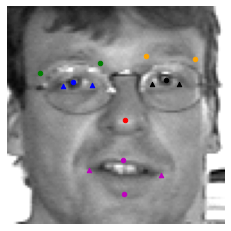

EVALUATING MODEL FOR brightness_augment WITH VALUE: 60
Epoch 1/100
9/9 [==============================] - 1s 164ms/step - loss: 1581.2567 - root_mean_squared_error: 39.4759 - val_loss: 262.6812 - val_root_mean_squared_error: 14.6638
Epoch 2/100
9/9 [==============================] - 1s 137ms/step - loss: 469.1422 - root_mean_squared_error: 20.1666 - val_loss: 418.7880 - val_root_mean_squared_error: 18.4812
Epoch 3/100
9/9 [==============================] - 1s 139ms/step - loss: 313.1829 - root_mean_squared_error: 15.2126 - val_loss: 441.1281 - val_root_mean_squared_error: 18.8694
Epoch 4/100
9/9 [==============================] - 1s 138ms/step - loss: 255.4173 - root_mean_squared_error: 13.0569 - val_loss: 240.5357 - val_root_mean_squared_error: 12.5197
Epoch 5/100
9/9 [==============================] - 1s 144ms/step - loss: 219.0842 - root_mean_squared_error: 11.6988 - val_loss: 269.4104 - val_root_mean_squared_error: 13.7664
Epoch 6/100
9/9 [==============================] - 1s 136ms

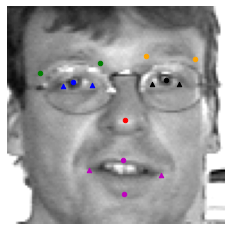

EVALUATING MODEL FOR brightness_augment WITH VALUE: 80
Epoch 1/100
9/9 [==============================] - 1s 164ms/step - loss: 1695.6890 - root_mean_squared_error: 40.9015 - val_loss: 215.6280 - val_root_mean_squared_error: 12.9720
Epoch 2/100
9/9 [==============================] - 1s 134ms/step - loss: 471.6922 - root_mean_squared_error: 20.2375 - val_loss: 447.4475 - val_root_mean_squared_error: 19.2470
Epoch 3/100
9/9 [==============================] - 1s 137ms/step - loss: 344.1368 - root_mean_squared_error: 16.2004 - val_loss: 464.8603 - val_root_mean_squared_error: 19.4840
Epoch 4/100
9/9 [==============================] - 1s 139ms/step - loss: 278.5979 - root_mean_squared_error: 13.9040 - val_loss: 319.4159 - val_root_mean_squared_error: 15.3317
Epoch 5/100
9/9 [==============================] - 1s 139ms/step - loss: 218.5111 - root_mean_squared_error: 11.6431 - val_loss: 229.6767 - val_root_mean_squared_error: 12.2004
Epoch 6/100
9/9 [==============================] - 1s 138ms

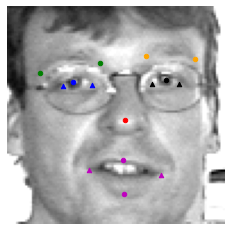

EVALUATING MODEL FOR brightness_augment WITH VALUE: 100
Epoch 1/100
9/9 [==============================] - 1s 160ms/step - loss: 1800.7654 - root_mean_squared_error: 42.1697 - val_loss: 223.1195 - val_root_mean_squared_error: 13.2845
Epoch 2/100
9/9 [==============================] - 1s 142ms/step - loss: 510.3560 - root_mean_squared_error: 21.1931 - val_loss: 348.0490 - val_root_mean_squared_error: 16.4956
Epoch 3/100
9/9 [==============================] - 1s 137ms/step - loss: 344.9884 - root_mean_squared_error: 16.2580 - val_loss: 535.5873 - val_root_mean_squared_error: 21.2426
Epoch 4/100
9/9 [==============================] - 1s 145ms/step - loss: 273.9202 - root_mean_squared_error: 13.7624 - val_loss: 349.0735 - val_root_mean_squared_error: 16.2874
Epoch 5/100
9/9 [==============================] - 1s 133ms/step - loss: 212.5762 - root_mean_squared_error: 11.4025 - val_loss: 238.4678 - val_root_mean_squared_error: 12.5623
Epoch 6/100
9/9 [==============================] - 1s 137m

In [ ]:
# Check the range of values for brightness
brightness_values = [i for i in range(-100, 101, 20) if i != 0]
brightness_histories, brightness_scores = eval_augmentation(brightness_augment, brightness_values, model, path + initial_weights, train_data, train_labels)

The impact of the augmentation values on the model performance was plotted. From the plot, it was determined that the values between -80 ~ 80 were within a suitable range of the baseline model performance.

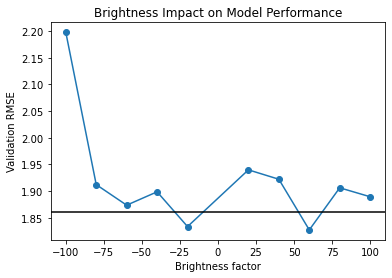

In [ ]:
# Plot the impact on the baseline model performance

plt.plot(brightness_values, np.array(brightness_scores)[:,1], marker='o')
plt.axhline(y=1.86, color='black')

plt.title("Brightness Impact on Model Performance")
plt.xlabel("Brightness factor")
plt.ylabel("Validation RMSE")
plt.show()

#### Rotation Augmentation

The baseline model was trained on the augmented dataset for each value. An example image after augmentation is plotted for each value.

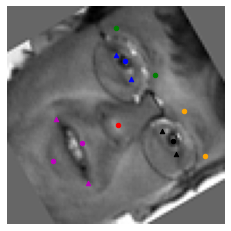

EVALUATING MODEL FOR rotate_augmentation WITH VALUE: -60
Epoch 1/100
9/9 [==============================] - 1s 163ms/step - loss: 1283.2921 - root_mean_squared_error: 35.5197 - val_loss: 374.6928 - val_root_mean_squared_error: 18.2392
Epoch 2/100
9/9 [==============================] - 1s 135ms/step - loss: 450.4354 - root_mean_squared_error: 19.9418 - val_loss: 421.5426 - val_root_mean_squared_error: 18.9445
Epoch 3/100
9/9 [==============================] - 1s 136ms/step - loss: 354.2654 - root_mean_squared_error: 17.0112 - val_loss: 332.2078 - val_root_mean_squared_error: 16.3131
Epoch 4/100
9/9 [==============================] - 1s 133ms/step - loss: 269.1922 - root_mean_squared_error: 14.2742 - val_loss: 233.4511 - val_root_mean_squared_error: 13.0108
Epoch 5/100
9/9 [==============================] - 1s 134ms/step - loss: 251.3105 - root_mean_squared_error: 13.7235 - val_loss: 252.1925 - val_root_mean_squared_error: 13.8190
Epoch 6/100
9/9 [==============================] - 1s 134

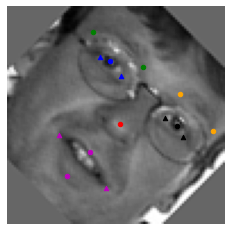

EVALUATING MODEL FOR rotate_augmentation WITH VALUE: -45
Epoch 1/100
9/9 [==============================] - 1s 161ms/step - loss: 931.6157 - root_mean_squared_error: 30.1580 - val_loss: 370.0739 - val_root_mean_squared_error: 18.0615
Epoch 2/100
9/9 [==============================] - 1s 138ms/step - loss: 301.5833 - root_mean_squared_error: 15.6743 - val_loss: 260.3687 - val_root_mean_squared_error: 13.8921
Epoch 3/100
9/9 [==============================] - 1s 131ms/step - loss: 253.6375 - root_mean_squared_error: 13.5345 - val_loss: 224.6758 - val_root_mean_squared_error: 12.3364
Epoch 4/100
9/9 [==============================] - 1s 172ms/step - loss: 193.8051 - root_mean_squared_error: 11.0199 - val_loss: 149.4872 - val_root_mean_squared_error: 8.8238
Epoch 5/100
9/9 [==============================] - 1s 136ms/step - loss: 158.6302 - root_mean_squared_error: 9.3965 - val_loss: 131.6900 - val_root_mean_squared_error: 7.9694
Epoch 6/100
9/9 [==============================] - 1s 137ms/s

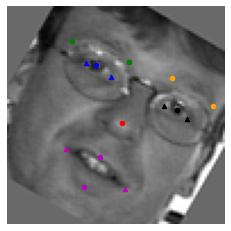

EVALUATING MODEL FOR rotate_augmentation WITH VALUE: -30
Epoch 1/100
9/9 [==============================] - 1s 162ms/step - loss: 1033.2804 - root_mean_squared_error: 31.7966 - val_loss: 366.5379 - val_root_mean_squared_error: 17.9390
Epoch 2/100
9/9 [==============================] - 1s 133ms/step - loss: 292.6384 - root_mean_squared_error: 15.3338 - val_loss: 249.9705 - val_root_mean_squared_error: 13.4208
Epoch 3/100
9/9 [==============================] - 1s 137ms/step - loss: 246.7096 - root_mean_squared_error: 13.1729 - val_loss: 228.0969 - val_root_mean_squared_error: 12.3633
Epoch 4/100
9/9 [==============================] - 1s 140ms/step - loss: 218.5367 - root_mean_squared_error: 11.9976 - val_loss: 185.1964 - val_root_mean_squared_error: 10.5944
Epoch 5/100
9/9 [==============================] - 1s 141ms/step - loss: 175.8467 - root_mean_squared_error: 10.2275 - val_loss: 158.5421 - val_root_mean_squared_error: 9.4715
Epoch 6/100
9/9 [==============================] - 1s 137m

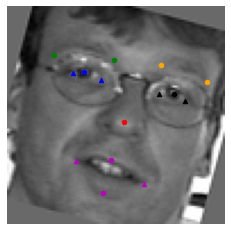

EVALUATING MODEL FOR rotate_augmentation WITH VALUE: -15
Epoch 1/100
9/9 [==============================] - 1s 163ms/step - loss: 1140.4691 - root_mean_squared_error: 33.4371 - val_loss: 388.4653 - val_root_mean_squared_error: 18.5234
Epoch 2/100
9/9 [==============================] - 1s 138ms/step - loss: 294.8249 - root_mean_squared_error: 15.3727 - val_loss: 233.1077 - val_root_mean_squared_error: 12.7210
Epoch 3/100
9/9 [==============================] - 1s 136ms/step - loss: 237.5131 - root_mean_squared_error: 12.7551 - val_loss: 222.8473 - val_root_mean_squared_error: 12.0738
Epoch 4/100
9/9 [==============================] - 1s 136ms/step - loss: 205.9777 - root_mean_squared_error: 11.3795 - val_loss: 184.5397 - val_root_mean_squared_error: 10.4723
Epoch 5/100
9/9 [==============================] - 1s 131ms/step - loss: 174.4879 - root_mean_squared_error: 10.0680 - val_loss: 146.7778 - val_root_mean_squared_error: 8.7272
Epoch 6/100
9/9 [==============================] - 1s 134m

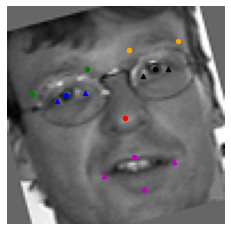

EVALUATING MODEL FOR rotate_augmentation WITH VALUE: 15
Epoch 1/100
9/9 [==============================] - 1s 160ms/step - loss: 1260.1575 - root_mean_squared_error: 35.1848 - val_loss: 392.2752 - val_root_mean_squared_error: 18.6404
Epoch 2/100
9/9 [==============================] - 1s 136ms/step - loss: 355.9849 - root_mean_squared_error: 17.2641 - val_loss: 341.0440 - val_root_mean_squared_error: 16.4396
Epoch 3/100
9/9 [==============================] - 1s 139ms/step - loss: 256.4342 - root_mean_squared_error: 13.4900 - val_loss: 222.6913 - val_root_mean_squared_error: 12.0751
Epoch 4/100
9/9 [==============================] - 1s 169ms/step - loss: 217.1798 - root_mean_squared_error: 11.8654 - val_loss: 195.0753 - val_root_mean_squared_error: 10.9624
Epoch 5/100
9/9 [==============================] - 1s 137ms/step - loss: 181.9028 - root_mean_squared_error: 10.4255 - val_loss: 159.5564 - val_root_mean_squared_error: 9.4238
Epoch 6/100
9/9 [==============================] - 1s 139ms

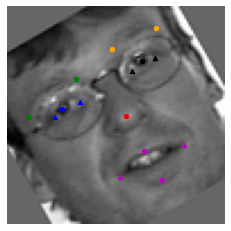

EVALUATING MODEL FOR rotate_augmentation WITH VALUE: 30
Epoch 1/100
9/9 [==============================] - 1s 162ms/step - loss: 1108.6848 - root_mean_squared_error: 32.9650 - val_loss: 517.2371 - val_root_mean_squared_error: 21.7589
Epoch 2/100
9/9 [==============================] - 1s 142ms/step - loss: 361.1733 - root_mean_squared_error: 17.4624 - val_loss: 279.4964 - val_root_mean_squared_error: 14.5321
Epoch 3/100
9/9 [==============================] - 1s 137ms/step - loss: 273.8917 - root_mean_squared_error: 14.2212 - val_loss: 230.9338 - val_root_mean_squared_error: 12.5369
Epoch 4/100
9/9 [==============================] - 1s 139ms/step - loss: 234.7777 - root_mean_squared_error: 12.7113 - val_loss: 203.6042 - val_root_mean_squared_error: 11.4844
Epoch 5/100
9/9 [==============================] - 1s 142ms/step - loss: 200.5784 - root_mean_squared_error: 11.4209 - val_loss: 177.2721 - val_root_mean_squared_error: 10.4550
Epoch 6/100
9/9 [==============================] - 1s 137m

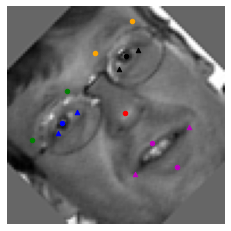

EVALUATING MODEL FOR rotate_augmentation WITH VALUE: 45
Epoch 1/100
9/9 [==============================] - 1s 161ms/step - loss: 1231.8727 - root_mean_squared_error: 34.7788 - val_loss: 473.7610 - val_root_mean_squared_error: 20.7008
Epoch 2/100
9/9 [==============================] - 1s 129ms/step - loss: 390.7970 - root_mean_squared_error: 18.2276 - val_loss: 341.6868 - val_root_mean_squared_error: 16.4358
Epoch 3/100
9/9 [==============================] - 1s 139ms/step - loss: 301.5961 - root_mean_squared_error: 15.0456 - val_loss: 256.5248 - val_root_mean_squared_error: 13.3745
Epoch 4/100
9/9 [==============================] - 1s 177ms/step - loss: 263.2541 - root_mean_squared_error: 13.6410 - val_loss: 257.9525 - val_root_mean_squared_error: 13.4978
Epoch 5/100
9/9 [==============================] - 1s 138ms/step - loss: 235.2661 - root_mean_squared_error: 12.6901 - val_loss: 202.9268 - val_root_mean_squared_error: 11.4404
Epoch 6/100
9/9 [==============================] - 1s 138m

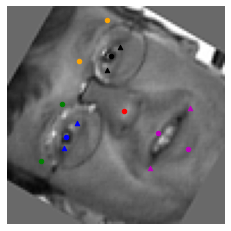

EVALUATING MODEL FOR rotate_augmentation WITH VALUE: 60
Epoch 1/100
9/9 [==============================] - 1s 161ms/step - loss: 1079.9698 - root_mean_squared_error: 32.5307 - val_loss: 561.1716 - val_root_mean_squared_error: 22.7689
Epoch 2/100
9/9 [==============================] - 1s 134ms/step - loss: 377.0597 - root_mean_squared_error: 17.9576 - val_loss: 328.6424 - val_root_mean_squared_error: 16.2070
Epoch 3/100
9/9 [==============================] - 1s 136ms/step - loss: 289.8370 - root_mean_squared_error: 14.8556 - val_loss: 241.2139 - val_root_mean_squared_error: 13.0334
Epoch 4/100
9/9 [==============================] - 1s 178ms/step - loss: 223.3890 - root_mean_squared_error: 12.3350 - val_loss: 195.0884 - val_root_mean_squared_error: 11.1653
Epoch 5/100
9/9 [==============================] - 1s 138ms/step - loss: 181.1350 - root_mean_squared_error: 10.5814 - val_loss: 155.6986 - val_root_mean_squared_error: 9.4100
Epoch 6/100
9/9 [==============================] - 1s 138ms

In [ ]:
# Check the range of values for rotation
rotation_values = [i for i in range(-60, 61, 15) if i != 0]
rotation_histories, rotation_scores = eval_augmentation(rotate_augmentation, rotation_values, model, path + initial_weights, train_data, train_labels)

The impact of the augmentation values on the model performance was plotted. From the plot, it was determined that the values between -45 ~ 45 were within a suitable range of the baseline model performance.

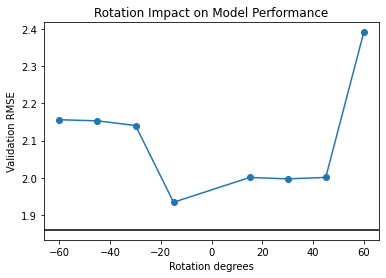

In [ ]:
# Plot the impact on the baseline model performance

plt.plot(rotation_values, np.array(rotation_scores)[:,1], marker='o')
plt.axhline(y=1.86, color='black')

plt.title("Rotation Impact on Model Performance")
plt.xlabel("Rotation degrees")
plt.ylabel("Validation RMSE")
plt.show()

#### Salt Noise Augmentation

The baseline model was trained on the augmented dataset for each value. An example image after augmentation is plotted for each value.

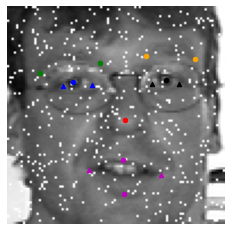

EVALUATING MODEL FOR img_sp_noise WITH VALUE: 0.05
Epoch 1/100
9/9 [==============================] - 1s 162ms/step - loss: 2903.7520 - root_mean_squared_error: 53.5961 - val_loss: 1889.0149 - val_root_mean_squared_error: 42.6169
Epoch 2/100
9/9 [==============================] - 1s 131ms/step - loss: 905.4281 - root_mean_squared_error: 28.4205 - val_loss: 434.3562 - val_root_mean_squared_error: 17.6623
Epoch 3/100
9/9 [==============================] - 1s 131ms/step - loss: 353.4969 - root_mean_squared_error: 14.9499 - val_loss: 290.4229 - val_root_mean_squared_error: 12.4424
Epoch 4/100
9/9 [==============================] - 1s 137ms/step - loss: 267.9279 - root_mean_squared_error: 11.5102 - val_loss: 298.2179 - val_root_mean_squared_error: 12.8297
Epoch 5/100
9/9 [==============================] - 1s 135ms/step - loss: 222.7529 - root_mean_squared_error: 9.5757 - val_loss: 238.7567 - val_root_mean_squared_error: 10.5621
Epoch 6/100
9/9 [==============================] - 1s 139ms/ste

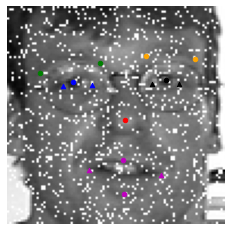

EVALUATING MODEL FOR img_sp_noise WITH VALUE: 0.1
Epoch 1/100
9/9 [==============================] - 1s 163ms/step - loss: 1464.3834 - root_mean_squared_error: 37.9118 - val_loss: 285.4691 - val_root_mean_squared_error: 15.0821
Epoch 2/100
9/9 [==============================] - 1s 136ms/step - loss: 416.9887 - root_mean_squared_error: 18.4838 - val_loss: 384.7469 - val_root_mean_squared_error: 17.1091
Epoch 3/100
9/9 [==============================] - 1s 138ms/step - loss: 310.3340 - root_mean_squared_error: 14.6197 - val_loss: 436.8307 - val_root_mean_squared_error: 18.3674
Epoch 4/100
9/9 [==============================] - 1s 138ms/step - loss: 248.7059 - root_mean_squared_error: 12.2482 - val_loss: 283.8928 - val_root_mean_squared_error: 13.6869
Epoch 5/100
9/9 [==============================] - 1s 136ms/step - loss: 215.5166 - root_mean_squared_error: 11.0118 - val_loss: 244.3992 - val_root_mean_squared_error: 12.3889
Epoch 6/100
9/9 [==============================] - 1s 137ms/step

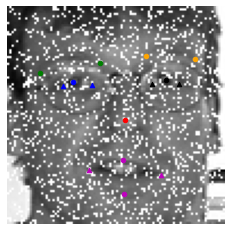

EVALUATING MODEL FOR img_sp_noise WITH VALUE: 0.15000000000000002
Epoch 1/100
9/9 [==============================] - 1s 165ms/step - loss: 2053.7471 - root_mean_squared_error: 44.9979 - val_loss: 462.0507 - val_root_mean_squared_error: 19.9334
Epoch 2/100
9/9 [==============================] - 1s 142ms/step - loss: 519.6959 - root_mean_squared_error: 20.8313 - val_loss: 311.4314 - val_root_mean_squared_error: 14.3144
Epoch 3/100
9/9 [==============================] - 1s 138ms/step - loss: 332.2160 - root_mean_squared_error: 14.8143 - val_loss: 367.3917 - val_root_mean_squared_error: 15.8169
Epoch 4/100
9/9 [==============================] - 1s 139ms/step - loss: 265.5331 - root_mean_squared_error: 12.1919 - val_loss: 277.5103 - val_root_mean_squared_error: 12.7438
Epoch 5/100
9/9 [==============================] - 1s 143ms/step - loss: 233.7058 - root_mean_squared_error: 10.9967 - val_loss: 279.5489 - val_root_mean_squared_error: 13.0477
Epoch 6/100
9/9 [==============================]

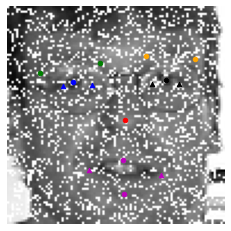

EVALUATING MODEL FOR img_sp_noise WITH VALUE: 0.2
Epoch 1/100
9/9 [==============================] - 1s 163ms/step - loss: 1865.3219 - root_mean_squared_error: 42.8659 - val_loss: 373.6152 - val_root_mean_squared_error: 17.6696
Epoch 2/100
9/9 [==============================] - 1s 137ms/step - loss: 544.5204 - root_mean_squared_error: 21.5220 - val_loss: 293.7644 - val_root_mean_squared_error: 13.8784
Epoch 3/100
9/9 [==============================] - 1s 139ms/step - loss: 344.5504 - root_mean_squared_error: 15.4054 - val_loss: 334.4261 - val_root_mean_squared_error: 14.9239
Epoch 4/100
9/9 [==============================] - 1s 180ms/step - loss: 278.5242 - root_mean_squared_error: 12.9222 - val_loss: 359.1485 - val_root_mean_squared_error: 15.7839
Epoch 5/100
9/9 [==============================] - 1s 145ms/step - loss: 242.1995 - root_mean_squared_error: 11.5883 - val_loss: 256.7647 - val_root_mean_squared_error: 12.3304
Epoch 6/100
9/9 [==============================] - 1s 138ms/step

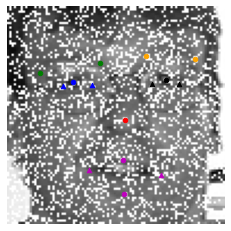

EVALUATING MODEL FOR img_sp_noise WITH VALUE: 0.25
Epoch 1/100
9/9 [==============================] - 1s 171ms/step - loss: 2572.3396 - root_mean_squared_error: 50.4301 - val_loss: 1339.7338 - val_root_mean_squared_error: 35.6830
Epoch 2/100
9/9 [==============================] - 1s 142ms/step - loss: 692.9321 - root_mean_squared_error: 24.5652 - val_loss: 727.1432 - val_root_mean_squared_error: 24.7880
Epoch 3/100
9/9 [==============================] - 1s 139ms/step - loss: 390.0189 - root_mean_squared_error: 16.4238 - val_loss: 365.8138 - val_root_mean_squared_error: 15.4786
Epoch 4/100
9/9 [==============================] - 1s 134ms/step - loss: 307.6132 - root_mean_squared_error: 13.4550 - val_loss: 310.4530 - val_root_mean_squared_error: 13.5996
Epoch 5/100
9/9 [==============================] - 1s 139ms/step - loss: 253.2642 - root_mean_squared_error: 11.3922 - val_loss: 290.5127 - val_root_mean_squared_error: 13.0459
Epoch 6/100
9/9 [==============================] - 2s 183ms/st

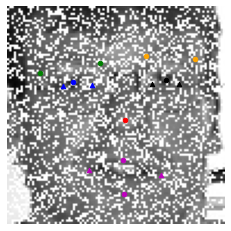

EVALUATING MODEL FOR img_sp_noise WITH VALUE: 0.3
Epoch 1/100
9/9 [==============================] - 1s 167ms/step - loss: 1779.8544 - root_mean_squared_error: 41.8745 - val_loss: 352.6645 - val_root_mean_squared_error: 17.1980
Epoch 2/100
9/9 [==============================] - 1s 140ms/step - loss: 586.1706 - root_mean_squared_error: 22.6054 - val_loss: 275.1960 - val_root_mean_squared_error: 13.4788
Epoch 3/100
9/9 [==============================] - 1s 140ms/step - loss: 366.2203 - root_mean_squared_error: 16.3374 - val_loss: 323.4225 - val_root_mean_squared_error: 14.8213
Epoch 4/100
9/9 [==============================] - 1s 139ms/step - loss: 276.7982 - root_mean_squared_error: 13.1518 - val_loss: 362.8433 - val_root_mean_squared_error: 16.1285
Epoch 5/100
9/9 [==============================] - 1s 136ms/step - loss: 244.3118 - root_mean_squared_error: 11.9735 - val_loss: 293.2818 - val_root_mean_squared_error: 13.9665
Epoch 6/100
9/9 [==============================] - 1s 136ms/step

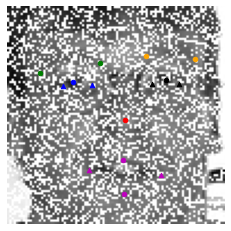

EVALUATING MODEL FOR img_sp_noise WITH VALUE: 0.35000000000000003
Epoch 1/100
9/9 [==============================] - 1s 163ms/step - loss: 2727.4783 - root_mean_squared_error: 51.9540 - val_loss: 1854.7616 - val_root_mean_squared_error: 42.3146
Epoch 2/100
9/9 [==============================] - 1s 145ms/step - loss: 829.3364 - root_mean_squared_error: 27.2477 - val_loss: 921.9410 - val_root_mean_squared_error: 28.4941
Epoch 3/100
9/9 [==============================] - 1s 139ms/step - loss: 461.4973 - root_mean_squared_error: 18.5366 - val_loss: 425.2726 - val_root_mean_squared_error: 17.3478
Epoch 4/100
9/9 [==============================] - 1s 179ms/step - loss: 316.0302 - root_mean_squared_error: 13.8185 - val_loss: 302.2833 - val_root_mean_squared_error: 13.3317
Epoch 5/100
9/9 [==============================] - 1s 143ms/step - loss: 256.3175 - root_mean_squared_error: 11.5515 - val_loss: 281.9277 - val_root_mean_squared_error: 12.7186
Epoch 6/100
9/9 [==============================

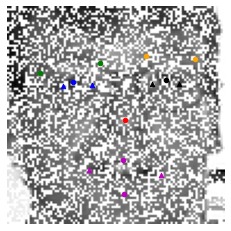

EVALUATING MODEL FOR img_sp_noise WITH VALUE: 0.4
Epoch 1/100
9/9 [==============================] - 1s 166ms/step - loss: 2092.1526 - root_mean_squared_error: 45.4513 - val_loss: 364.8483 - val_root_mean_squared_error: 17.5332
Epoch 2/100
9/9 [==============================] - 1s 135ms/step - loss: 577.1440 - root_mean_squared_error: 22.3736 - val_loss: 318.1339 - val_root_mean_squared_error: 14.9039
Epoch 3/100
9/9 [==============================] - 1s 139ms/step - loss: 402.4675 - root_mean_squared_error: 17.3217 - val_loss: 296.0329 - val_root_mean_squared_error: 13.7280
Epoch 4/100
9/9 [==============================] - 1s 138ms/step - loss: 299.3023 - root_mean_squared_error: 13.8318 - val_loss: 293.1861 - val_root_mean_squared_error: 13.6359
Epoch 5/100
9/9 [==============================] - 1s 139ms/step - loss: 253.7990 - root_mean_squared_error: 12.1719 - val_loss: 305.3237 - val_root_mean_squared_error: 14.2204
Epoch 6/100
9/9 [==============================] - 1s 138ms/step

In [ ]:
# Check the range of values for salt noise
snoise_values = np.linspace(0.05, 0.4, 8)
snoise_histories, snoise_scores = eval_augmentation(img_sp_noise, snoise_values, model, path + initial_weights, train_data, train_labels)

The impact of the augmentation values on the model performance was plotted. From the plot, it was determined that none of the augmentation values of salt noise kept the model performance within the range of the baseline model.

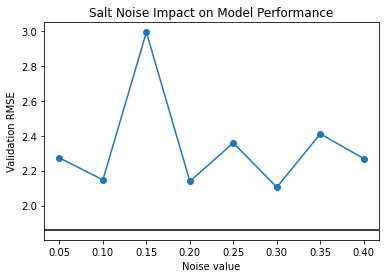

In [ ]:
# Plot the impact on the baseline model performance

plt.plot(snoise_values, np.array(snoise_scores)[:,1], marker='o')
plt.axhline(y=1.86, color='black')

plt.title("Salt Noise Impact on Model Performance")
plt.xlabel("Noise value")
plt.ylabel("Validation RMSE")
plt.show()

#### Gaussian Noise Augmentation

The baseline model was trained on the augmented dataset for each value. An example image after augmentation is plotted for each value.



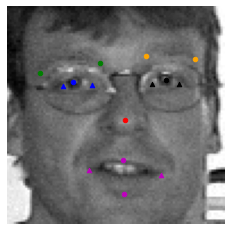

EVALUATING MODEL FOR img_gauss_noise WITH VALUE: 5.0
Epoch 1/100
9/9 [==============================] - 1s 160ms/step - loss: 1802.0344 - root_mean_squared_error: 42.2602 - val_loss: 687.7219 - val_root_mean_squared_error: 25.7123
Epoch 2/100
9/9 [==============================] - 1s 136ms/step - loss: 430.8119 - root_mean_squared_error: 19.9172 - val_loss: 281.8283 - val_root_mean_squared_error: 15.4782
Epoch 3/100
9/9 [==============================] - 1s 135ms/step - loss: 233.5768 - root_mean_squared_error: 13.7193 - val_loss: 212.2079 - val_root_mean_squared_error: 12.8036
Epoch 4/100
9/9 [==============================] - 1s 135ms/step - loss: 235.5101 - root_mean_squared_error: 13.6559 - val_loss: 182.6961 - val_root_mean_squared_error: 11.5387
Epoch 5/100
9/9 [==============================] - 1s 134ms/step - loss: 162.5374 - root_mean_squared_error: 10.6331 - val_loss: 136.3240 - val_root_mean_squared_error: 9.3397
Epoch 6/100
9/9 [==============================] - 1s 135ms/st

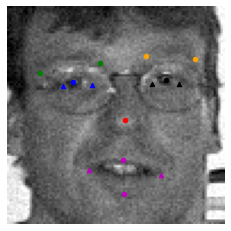

EVALUATING MODEL FOR img_gauss_noise WITH VALUE: 10.0
Epoch 1/100
9/9 [==============================] - 2s 201ms/step - loss: 1165.3501 - root_mean_squared_error: 33.8695 - val_loss: 260.0832 - val_root_mean_squared_error: 15.0849
Epoch 2/100
9/9 [==============================] - 1s 135ms/step - loss: 256.7548 - root_mean_squared_error: 14.6606 - val_loss: 219.7890 - val_root_mean_squared_error: 12.9727
Epoch 3/100
9/9 [==============================] - 1s 139ms/step - loss: 192.9314 - root_mean_squared_error: 11.7497 - val_loss: 180.9385 - val_root_mean_squared_error: 11.0990
Epoch 4/100
9/9 [==============================] - 1s 141ms/step - loss: 353.5363 - root_mean_squared_error: 17.1856 - val_loss: 450.4118 - val_root_mean_squared_error: 19.8063
Epoch 5/100
9/9 [==============================] - 1s 138ms/step - loss: 246.0207 - root_mean_squared_error: 13.7212 - val_loss: 210.6359 - val_root_mean_squared_error: 12.3962
Epoch 6/100
9/9 [==============================] - 1s 135ms/

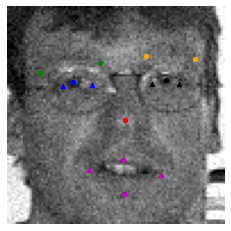

EVALUATING MODEL FOR img_gauss_noise WITH VALUE: 15.0
Epoch 1/100
9/9 [==============================] - 2s 207ms/step - loss: 962.7214 - root_mean_squared_error: 30.6844 - val_loss: 368.8097 - val_root_mean_squared_error: 18.0909
Epoch 2/100
9/9 [==============================] - 1s 136ms/step - loss: 274.9911 - root_mean_squared_error: 14.8622 - val_loss: 269.4636 - val_root_mean_squared_error: 14.2324
Epoch 3/100
9/9 [==============================] - 1s 143ms/step - loss: 213.8935 - root_mean_squared_error: 11.9467 - val_loss: 203.3101 - val_root_mean_squared_error: 11.3428
Epoch 4/100
9/9 [==============================] - 1s 141ms/step - loss: 187.4627 - root_mean_squared_error: 10.6017 - val_loss: 173.1561 - val_root_mean_squared_error: 9.9251
Epoch 5/100
9/9 [==============================] - 1s 140ms/step - loss: 153.1913 - root_mean_squared_error: 8.9218 - val_loss: 167.7956 - val_root_mean_squared_error: 9.7956
Epoch 6/100
9/9 [==============================] - 1s 141ms/step

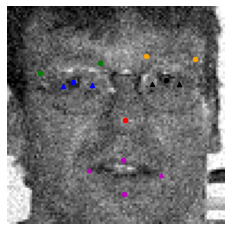

EVALUATING MODEL FOR img_gauss_noise WITH VALUE: 20.0
Epoch 1/100
9/9 [==============================] - 1s 163ms/step - loss: 1080.6052 - root_mean_squared_error: 32.5247 - val_loss: 391.6323 - val_root_mean_squared_error: 18.5863
Epoch 2/100
9/9 [==============================] - 1s 134ms/step - loss: 277.0894 - root_mean_squared_error: 14.7219 - val_loss: 291.3870 - val_root_mean_squared_error: 14.7245
Epoch 3/100
9/9 [==============================] - 1s 136ms/step - loss: 224.9125 - root_mean_squared_error: 12.0797 - val_loss: 218.8817 - val_root_mean_squared_error: 11.6889
Epoch 4/100
9/9 [==============================] - 1s 139ms/step - loss: 191.1549 - root_mean_squared_error: 10.4426 - val_loss: 201.4636 - val_root_mean_squared_error: 10.9772
Epoch 5/100
9/9 [==============================] - 1s 138ms/step - loss: 162.9583 - root_mean_squared_error: 9.1427 - val_loss: 170.8229 - val_root_mean_squared_error: 9.6886
Epoch 6/100
9/9 [==============================] - 1s 143ms/st

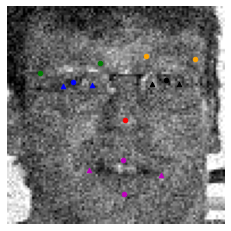

EVALUATING MODEL FOR img_gauss_noise WITH VALUE: 25.0
Epoch 1/100
9/9 [==============================] - 1s 164ms/step - loss: 1445.0974 - root_mean_squared_error: 37.6956 - val_loss: 302.6789 - val_root_mean_squared_error: 15.8716
Epoch 2/100
9/9 [==============================] - 1s 140ms/step - loss: 331.9669 - root_mean_squared_error: 16.2829 - val_loss: 324.6775 - val_root_mean_squared_error: 15.5477
Epoch 3/100
9/9 [==============================] - 1s 137ms/step - loss: 251.6855 - root_mean_squared_error: 12.7963 - val_loss: 268.4626 - val_root_mean_squared_error: 13.2987
Epoch 4/100
9/9 [==============================] - 1s 135ms/step - loss: 209.5689 - root_mean_squared_error: 10.8686 - val_loss: 214.1304 - val_root_mean_squared_error: 11.1355
Epoch 5/100
9/9 [==============================] - 1s 139ms/step - loss: 177.7441 - root_mean_squared_error: 9.4566 - val_loss: 179.6486 - val_root_mean_squared_error: 9.6992
Epoch 6/100
9/9 [==============================] - 1s 137ms/st

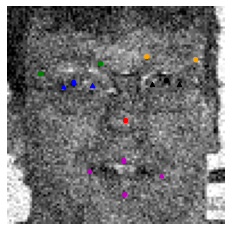

EVALUATING MODEL FOR img_gauss_noise WITH VALUE: 30.0
Epoch 1/100
9/9 [==============================] - 1s 164ms/step - loss: 1578.1526 - root_mean_squared_error: 39.4033 - val_loss: 265.1396 - val_root_mean_squared_error: 14.5244
Epoch 2/100
9/9 [==============================] - 1s 138ms/step - loss: 360.0689 - root_mean_squared_error: 17.0078 - val_loss: 405.1866 - val_root_mean_squared_error: 17.8319
Epoch 3/100
9/9 [==============================] - 1s 136ms/step - loss: 277.1647 - root_mean_squared_error: 13.6050 - val_loss: 259.9388 - val_root_mean_squared_error: 12.8255
Epoch 4/100
9/9 [==============================] - 1s 135ms/step - loss: 229.6616 - root_mean_squared_error: 11.6040 - val_loss: 250.4665 - val_root_mean_squared_error: 12.5352
Epoch 5/100
9/9 [==============================] - 1s 134ms/step - loss: 195.1857 - root_mean_squared_error: 10.1927 - val_loss: 252.5270 - val_root_mean_squared_error: 12.8165
Epoch 6/100
9/9 [==============================] - 1s 135ms/

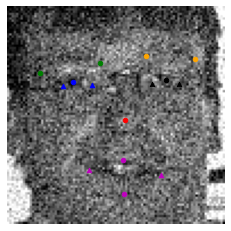

EVALUATING MODEL FOR img_gauss_noise WITH VALUE: 35.0
Epoch 1/100
9/9 [==============================] - 1s 163ms/step - loss: 1670.8350 - root_mean_squared_error: 40.5515 - val_loss: 392.3960 - val_root_mean_squared_error: 18.3113
Epoch 2/100
9/9 [==============================] - 1s 173ms/step - loss: 438.7375 - root_mean_squared_error: 19.0740 - val_loss: 354.0536 - val_root_mean_squared_error: 16.1713
Epoch 3/100
9/9 [==============================] - 1s 140ms/step - loss: 312.4347 - root_mean_squared_error: 14.6502 - val_loss: 427.4729 - val_root_mean_squared_error: 18.0544
Epoch 4/100
9/9 [==============================] - 1s 138ms/step - loss: 265.5682 - root_mean_squared_error: 12.8225 - val_loss: 261.4258 - val_root_mean_squared_error: 12.7256
Epoch 5/100
9/9 [==============================] - 1s 140ms/step - loss: 221.3904 - root_mean_squared_error: 11.1353 - val_loss: 225.1200 - val_root_mean_squared_error: 11.4382
Epoch 6/100
9/9 [==============================] - 1s 140ms/

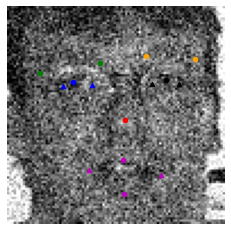

EVALUATING MODEL FOR img_gauss_noise WITH VALUE: 40.0
Epoch 1/100
9/9 [==============================] - 2s 206ms/step - loss: 1484.9427 - root_mean_squared_error: 38.2024 - val_loss: 283.8634 - val_root_mean_squared_error: 15.1619
Epoch 2/100
9/9 [==============================] - 1s 138ms/step - loss: 403.7229 - root_mean_squared_error: 18.2597 - val_loss: 472.9806 - val_root_mean_squared_error: 19.6647
Epoch 3/100
9/9 [==============================] - 1s 139ms/step - loss: 301.4445 - root_mean_squared_error: 14.5095 - val_loss: 338.0408 - val_root_mean_squared_error: 15.6198
Epoch 4/100
9/9 [==============================] - 1s 137ms/step - loss: 241.9887 - root_mean_squared_error: 12.1829 - val_loss: 233.7437 - val_root_mean_squared_error: 11.9121
Epoch 5/100
9/9 [==============================] - 1s 138ms/step - loss: 216.6941 - root_mean_squared_error: 11.2644 - val_loss: 273.1442 - val_root_mean_squared_error: 13.6506
Epoch 6/100
9/9 [==============================] - 1s 138ms/

In [ ]:
# Check the range of values for Gaussian noise
gnoise_values = np.linspace(5, 40, 8)
gnoise_histories, gnoise_scores = eval_augmentation(img_gauss_noise, gnoise_values, model, path + initial_weights, train_data, train_labels)

The impact of the augmentation values on the model performance was plotted. From the plot, it was determined that all the values were within a suitable range of the baseline model performance.

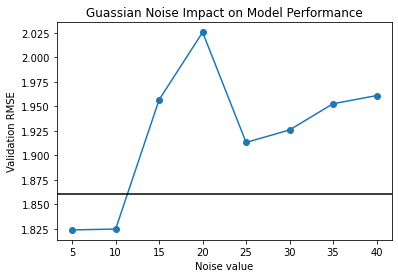

In [ ]:
# Plot the impact on the baseline model performance

plt.plot(gnoise_values, np.array(gnoise_scores)[:,1], marker='o')
plt.axhline(y=1.86, color='black')

plt.title("Guassian Noise Impact on Model Performance")
plt.xlabel("Noise value")
plt.ylabel("Validation RMSE")
plt.show()

#### Horizontal Flip Augmentation

For the horizontal flip augmentation, the baseline model was trained on the augmented dataset on 5 iterations. An example image after augmentation is plotted for each iteration.


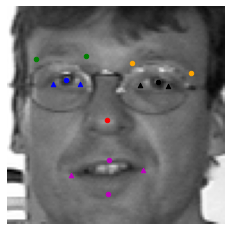

EVALUATING MODEL FOR img_xflip WITH VALUE: 1
Epoch 1/100
9/9 [==============================] - 1s 161ms/step - loss: 1986.8927 - root_mean_squared_error: 44.2980 - val_loss: 602.6082 - val_root_mean_squared_error: 23.4334
Epoch 2/100
9/9 [==============================] - 1s 136ms/step - loss: 393.5720 - root_mean_squared_error: 17.9526 - val_loss: 374.9312 - val_root_mean_squared_error: 16.9011
Epoch 3/100
9/9 [==============================] - 1s 137ms/step - loss: 294.0992 - root_mean_squared_error: 14.1070 - val_loss: 217.1325 - val_root_mean_squared_error: 10.8391
Epoch 4/100
9/9 [==============================] - 1s 139ms/step - loss: 220.3269 - root_mean_squared_error: 10.9722 - val_loss: 206.9790 - val_root_mean_squared_error: 10.3854
Epoch 5/100
9/9 [==============================] - 1s 134ms/step - loss: 164.5643 - root_mean_squared_error: 8.1824 - val_loss: 139.3586 - val_root_mean_squared_error: 6.6530
Epoch 6/100
9/9 [==============================] - 1s 135ms/step - loss

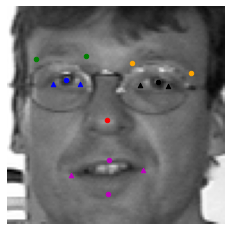

EVALUATING MODEL FOR img_xflip WITH VALUE: 2
Epoch 1/100
9/9 [==============================] - 1s 163ms/step - loss: 869.4489 - root_mean_squared_error: 29.1320 - val_loss: 365.9115 - val_root_mean_squared_error: 18.0631
Epoch 2/100
9/9 [==============================] - 1s 134ms/step - loss: 267.9055 - root_mean_squared_error: 14.7510 - val_loss: 212.0912 - val_root_mean_squared_error: 12.3043
Epoch 3/100
9/9 [==============================] - 1s 132ms/step - loss: 220.1547 - root_mean_squared_error: 12.5123 - val_loss: 198.8322 - val_root_mean_squared_error: 11.5474
Epoch 4/100
9/9 [==============================] - 1s 136ms/step - loss: 185.3143 - root_mean_squared_error: 10.9656 - val_loss: 161.8987 - val_root_mean_squared_error: 9.8992
Epoch 5/100
9/9 [==============================] - 1s 131ms/step - loss: 148.5099 - root_mean_squared_error: 9.2687 - val_loss: 138.5613 - val_root_mean_squared_error: 8.8268
Epoch 6/100
9/9 [==============================] - 1s 132ms/step - loss: 

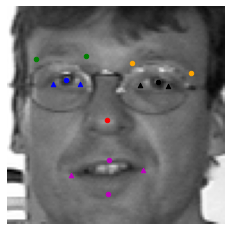

EVALUATING MODEL FOR img_xflip WITH VALUE: 3
Epoch 1/100
9/9 [==============================] - 1s 161ms/step - loss: 1035.0378 - root_mean_squared_error: 31.8366 - val_loss: 454.4376 - val_root_mean_squared_error: 20.3031
Epoch 2/100
9/9 [==============================] - 1s 133ms/step - loss: 295.4509 - root_mean_squared_error: 15.5301 - val_loss: 237.0226 - val_root_mean_squared_error: 13.0735
Epoch 3/100
9/9 [==============================] - 1s 136ms/step - loss: 225.3829 - root_mean_squared_error: 12.4840 - val_loss: 219.3403 - val_root_mean_squared_error: 12.1438
Epoch 4/100
9/9 [==============================] - 1s 135ms/step - loss: 195.4897 - root_mean_squared_error: 11.1345 - val_loss: 177.3626 - val_root_mean_squared_error: 10.3492
Epoch 5/100
9/9 [==============================] - 1s 135ms/step - loss: 162.3865 - root_mean_squared_error: 9.6754 - val_loss: 146.0671 - val_root_mean_squared_error: 8.9148
Epoch 6/100
9/9 [==============================] - 1s 133ms/step - loss

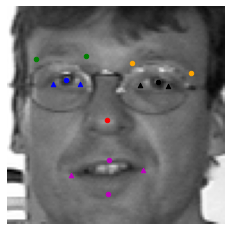

EVALUATING MODEL FOR img_xflip WITH VALUE: 4
Epoch 1/100
9/9 [==============================] - 2s 202ms/step - loss: 1067.5463 - root_mean_squared_error: 32.3368 - val_loss: 415.1985 - val_root_mean_squared_error: 19.2753
Epoch 2/100
9/9 [==============================] - 1s 137ms/step - loss: 288.2391 - root_mean_squared_error: 15.2291 - val_loss: 230.2423 - val_root_mean_squared_error: 12.7090
Epoch 3/100
9/9 [==============================] - 1s 138ms/step - loss: 233.2746 - root_mean_squared_error: 12.6884 - val_loss: 243.7825 - val_root_mean_squared_error: 13.0049
Epoch 4/100
9/9 [==============================] - 1s 138ms/step - loss: 206.9362 - root_mean_squared_error: 11.5199 - val_loss: 209.6686 - val_root_mean_squared_error: 11.6981
Epoch 5/100
9/9 [==============================] - 1s 135ms/step - loss: 173.1280 - root_mean_squared_error: 10.0950 - val_loss: 152.9596 - val_root_mean_squared_error: 9.1698
Epoch 6/100
9/9 [==============================] - 1s 134ms/step - los

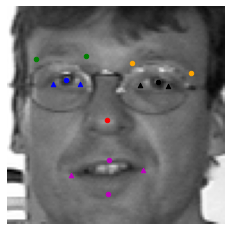

EVALUATING MODEL FOR img_xflip WITH VALUE: 5
Epoch 1/100
9/9 [==============================] - 1s 168ms/step - loss: 1164.0227 - root_mean_squared_error: 33.7889 - val_loss: 401.3681 - val_root_mean_squared_error: 18.8782
Epoch 2/100
9/9 [==============================] - 1s 136ms/step - loss: 310.3575 - root_mean_squared_error: 15.8850 - val_loss: 263.2423 - val_root_mean_squared_error: 13.8740
Epoch 3/100
9/9 [==============================] - 1s 138ms/step - loss: 239.3820 - root_mean_squared_error: 12.8456 - val_loss: 235.3456 - val_root_mean_squared_error: 12.5932
Epoch 4/100
9/9 [==============================] - 1s 135ms/step - loss: 212.0999 - root_mean_squared_error: 11.6544 - val_loss: 186.3208 - val_root_mean_squared_error: 10.5602
Epoch 5/100
9/9 [==============================] - 1s 136ms/step - loss: 176.3945 - root_mean_squared_error: 10.1621 - val_loss: 156.7180 - val_root_mean_squared_error: 9.2750
Epoch 6/100
9/9 [==============================] - 1s 142ms/step - los

In [ ]:
# Define a number of iterations to run horizontal flip
xflip_iters = [i for i in range(1,6)]
xflip_histories, xflip_scores = eval_augmentation(img_xflip, xflip_iters, model, path + initial_weights, train_data, train_labels)

The impact of the augmentation on the model performance was plotted. From the plot, it was determined for each separate iteration of augmentation, the model performance was within the range of the baseline performance. The mean validation RMSE across the 5 iterations was 1.8467.

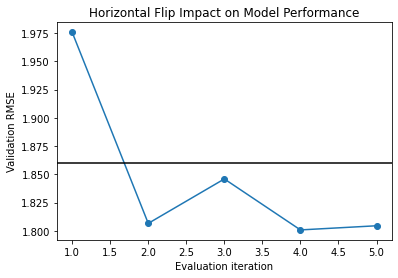

In [ ]:
# Plot the impact on the baseline model performance

plt.plot(xflip_iters, np.array(xflip_scores)[:,1], marker='o')
plt.axhline(y=1.86, color='black')

plt.title("Horizontal Flip Impact on Model Performance")
plt.xlabel("Evaluation iteration")
plt.ylabel("Validation RMSE")
plt.show()

In [ ]:
print("Average RMSE:", np.mean(np.array(xflip_scores)[:,1]))

Average RMSE: 1.8467218399047851


#### Vertical Flip Augmentation

For the vertical flip augmentation, the baseline model was trained on the augmented dataset on 5 iterations. An example image after augmentation is plotted for each iteration.

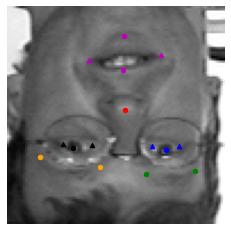

EVALUATING MODEL FOR img_yflip WITH VALUE: 1
Epoch 1/100
9/9 [==============================] - 1s 161ms/step - loss: 2407.0046 - root_mean_squared_error: 48.8226 - val_loss: 596.4819 - val_root_mean_squared_error: 23.3780
Epoch 2/100
9/9 [==============================] - 1s 137ms/step - loss: 830.6972 - root_mean_squared_error: 27.6462 - val_loss: 920.4478 - val_root_mean_squared_error: 28.9380
Epoch 3/100
9/9 [==============================] - 1s 139ms/step - loss: 644.9396 - root_mean_squared_error: 23.5910 - val_loss: 603.8763 - val_root_mean_squared_error: 22.6110
Epoch 4/100
9/9 [==============================] - 1s 148ms/step - loss: 539.4804 - root_mean_squared_error: 21.1323 - val_loss: 533.6219 - val_root_mean_squared_error: 21.0087
Epoch 5/100
9/9 [==============================] - 1s 136ms/step - loss: 511.9933 - root_mean_squared_error: 20.5179 - val_loss: 449.6288 - val_root_mean_squared_error: 18.9875
Epoch 6/100
9/9 [==============================] - 1s 139ms/step - lo

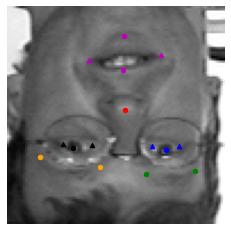

EVALUATING MODEL FOR img_yflip WITH VALUE: 2
Epoch 1/100
9/9 [==============================] - 1s 168ms/step - loss: 1060.2183 - root_mean_squared_error: 32.2476 - val_loss: 736.1265 - val_root_mean_squared_error: 26.4196
Epoch 2/100
9/9 [==============================] - 1s 139ms/step - loss: 491.6188 - root_mean_squared_error: 21.0512 - val_loss: 469.3932 - val_root_mean_squared_error: 20.2492
Epoch 3/100
9/9 [==============================] - 1s 139ms/step - loss: 322.0900 - root_mean_squared_error: 16.0841 - val_loss: 225.5288 - val_root_mean_squared_error: 12.5793
Epoch 4/100
9/9 [==============================] - 1s 140ms/step - loss: 216.0498 - root_mean_squared_error: 12.1699 - val_loss: 173.6644 - val_root_mean_squared_error: 10.2935
Epoch 5/100
9/9 [==============================] - 1s 138ms/step - loss: 163.8743 - root_mean_squared_error: 9.8664 - val_loss: 142.7122 - val_root_mean_squared_error: 8.8420
Epoch 6/100
9/9 [==============================] - 1s 138ms/step - loss

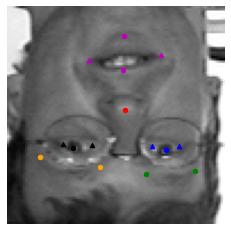

EVALUATING MODEL FOR img_yflip WITH VALUE: 3
Epoch 1/100
9/9 [==============================] - 1s 165ms/step - loss: 1204.9822 - root_mean_squared_error: 34.4033 - val_loss: 748.8950 - val_root_mean_squared_error: 26.5902
Epoch 2/100
9/9 [==============================] - 1s 136ms/step - loss: 552.6457 - root_mean_squared_error: 22.3376 - val_loss: 432.5699 - val_root_mean_squared_error: 19.1640
Epoch 3/100
9/9 [==============================] - 1s 142ms/step - loss: 394.2084 - root_mean_squared_error: 18.0355 - val_loss: 298.7974 - val_root_mean_squared_error: 15.0640
Epoch 4/100
9/9 [==============================] - 1s 136ms/step - loss: 257.0473 - root_mean_squared_error: 13.5919 - val_loss: 225.6215 - val_root_mean_squared_error: 12.3902
Epoch 5/100
9/9 [==============================] - 1s 180ms/step - loss: 219.1085 - root_mean_squared_error: 12.1597 - val_loss: 199.1308 - val_root_mean_squared_error: 11.3778
Epoch 6/100
9/9 [==============================] - 1s 133ms/step - lo

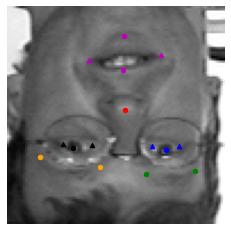

EVALUATING MODEL FOR img_yflip WITH VALUE: 4
Epoch 1/100
9/9 [==============================] - 1s 166ms/step - loss: 1230.8348 - root_mean_squared_error: 34.7718 - val_loss: 689.1365 - val_root_mean_squared_error: 25.4203
Epoch 2/100
9/9 [==============================] - 1s 178ms/step - loss: 570.8461 - root_mean_squared_error: 22.7120 - val_loss: 411.8362 - val_root_mean_squared_error: 18.5788
Epoch 3/100
9/9 [==============================] - 1s 139ms/step - loss: 437.6894 - root_mean_squared_error: 19.1781 - val_loss: 396.4407 - val_root_mean_squared_error: 18.0106
Epoch 4/100
9/9 [==============================] - 1s 141ms/step - loss: 319.8214 - root_mean_squared_error: 15.7497 - val_loss: 244.1394 - val_root_mean_squared_error: 13.1665
Epoch 5/100
9/9 [==============================] - 1s 137ms/step - loss: 231.1114 - root_mean_squared_error: 12.7110 - val_loss: 214.9989 - val_root_mean_squared_error: 12.1395
Epoch 6/100
9/9 [==============================] - 1s 134ms/step - lo

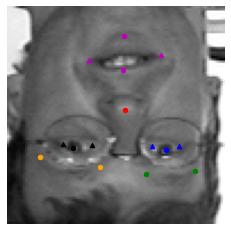

EVALUATING MODEL FOR img_yflip WITH VALUE: 5
Epoch 1/100
9/9 [==============================] - 1s 169ms/step - loss: 1418.1008 - root_mean_squared_error: 37.3563 - val_loss: 703.7776 - val_root_mean_squared_error: 25.6511
Epoch 2/100
9/9 [==============================] - 1s 139ms/step - loss: 621.8581 - root_mean_squared_error: 23.7213 - val_loss: 491.6697 - val_root_mean_squared_error: 20.4822
Epoch 3/100
9/9 [==============================] - 1s 143ms/step - loss: 457.0970 - root_mean_squared_error: 19.5261 - val_loss: 373.1635 - val_root_mean_squared_error: 17.1689
Epoch 4/100
9/9 [==============================] - 1s 139ms/step - loss: 317.2196 - root_mean_squared_error: 15.4592 - val_loss: 276.1631 - val_root_mean_squared_error: 14.1026
Epoch 5/100
9/9 [==============================] - 1s 139ms/step - loss: 237.4350 - root_mean_squared_error: 12.7103 - val_loss: 214.1399 - val_root_mean_squared_error: 11.8498
Epoch 6/100
9/9 [==============================] - 1s 141ms/step - lo

In [ ]:
# Define a number of iterations to run vertical flip
yflip_iters = [i for i in range(1,6)]
yflip_histories, yflip_scores = eval_augmentation(img_yflip, yflip_iters, model, path + initial_weights, train_data, train_labels)

The impact of the augmentation on the model performance was plotted. From the plot, it was determined for each separate iteration of augmentation, the model performance was far outside of the range of the baseline performance. The mean validation RMSE across the 5 iterations was 2.6343.

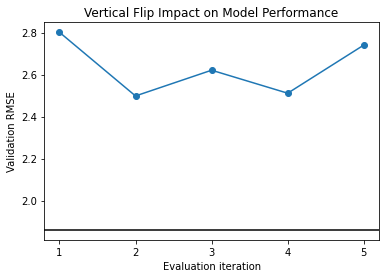

In [ ]:
# Plot the impact on the baseline model performance

plt.plot(yflip_iters, np.array(yflip_scores)[:,1], marker='o')
plt.axhline(y=1.86, color='black')
plt.xticks(range(1, 6))

plt.title("Vertical Flip Impact on Model Performance")
plt.xlabel("Evaluation iteration")
plt.ylabel("Validation RMSE")
plt.show()

In [ ]:
print("Average RMSE:", np.mean(np.array(yflip_scores)[:,1]))

Average RMSE: 2.6343106746673586


## 4. Random Augmentation (RandAug)

In order to add variation in the train data, a random augmentation (or RandAug) method was implemented to apply augmentations to the data. The RandAug implementation randomly selects N augmentations out of the augmentation operations specified without replacement to be performed on the data. Each augmentation has a 1/K probability of being selected, where K is the number of possible augmetation functions. An augmentation magnitude of M is then applied for each augmentation operation. The magnitude M is on a scale of 1 to 10, and is applied to the range of acceptable values for each augmentation operation.

>  Value = (Upper value - lower value)/10 * M + lower value


E.g., for a Gaussian noise augmentation which is defined as having a value between 0 and 40, a magnitude of 3 would result in a noise value of 12.

> Noise = (40-0)/10 * 3 + 0 = 12

For operations that can take on both positive and negative values, the direction (i.e., positive or negative) was also selected randomly with equal probability.





In [ ]:
def augment_sequence(transforms, N, M):

  '''
  Creates the random sequence of augmentations of size N that should be 
  performed. Each augmentation is chosen with 1/K probability (uniform distribution).
  '''

  augs = np.random.choice(transforms, N, replace=False)
  return [(aug, M) for aug in augs]

def scale_augmentation(transform, scale, divisions, M):

  '''
  Scales the augmentation by some magnitude M based on the provided scale.
  Returns the magnitude of the augmentation desired based on the type of transform.
  '''
  
  scale = scale[1] - scale[0]

  value = scale/divisions*M + scale[0]

  if transform in ['brightness', 'rotation']:
    direction = np.random.choice([-1,1])
    value *= direction

  return value

def rand_aug(img, label, aug_dict, N, M, div):

  '''
  Run a Random Augmentation of an image using N augmentations with magnitude M.
  '''

  new_img = img
  new_label = label

  seq = augment_sequence(list(aug_dict.keys()), N, M)

  for aug in seq:
    
    transform, mag = aug
    value = scale_augmentation(transform, aug_dict[transform][1], div, mag)

    new_img, new_label = aug_dict[transform][0](new_img, new_label, value)

  return new_img, new_label

### RandAug dictionary

A dictionary of augmentation operations containing the augmentation functions and respective scales was created. The vertical flip and salt noise functions were not included in the dictionary given their poor performance for all values on the baseline model when used as the augmentation function (shown in the previous section).

*The scale for horizontal flip (i.e., xflip) is arbitrary and simply defined for compability, given that the operation has no scale.

In [ ]:
aug_dict = {'xflip':[img_xflip, (1,1)], 'contrast':[contrast_augment, (0, 4)], 'CLAHE':[CLAHE_contrast_augment, (0, 4)], 'brightness':[brightness_augment, (0, 80)], 
                'rotation':[rotate_augmentation, (0, 45)], 'blur':[img_blurb, (1, 3)], 'noise':[img_gauss_noise, (0, 40)]}

### RandAug example

An example of the RandAug process is shown below, with N = 3 and M = 5.

In [ ]:
# Define the number of operations, the augmentation magnitude, and the magnitude scale
N = 3
M = 5
div = 10

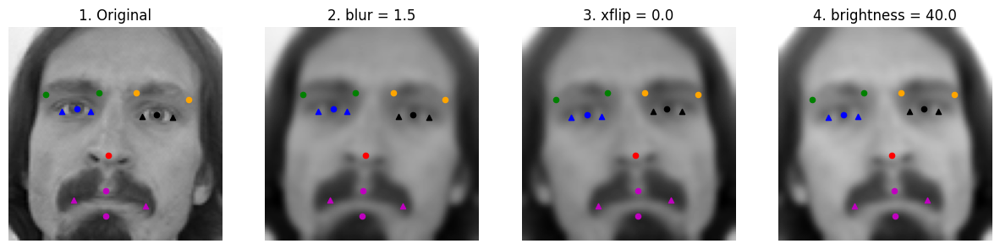

In [ ]:
# Select the augmentation sequence 
aug_pattern = augment_sequence(list(aug_dict.keys()), N, M)

# Get the original image and create a plot
img, label = train_data[0], train_labels[0]
fig, ax = plt.subplots(1, 4, figsize=(15,15))

j = 0

# Show the original image
NPY_feature_show(img, label, ax[j])
ax[j].set_title(f"{j+1}. Original")

# For each augmentation in the RandAug sequence, perform the augmentation
for aug in aug_pattern:

  # Get the augmentation operation and magnitude value to be applied 
  transform, mag = aug
  value = scale_augmentation(transform, aug_dict[transform][1], div, mag)

  # Apply the transformation
  img, label = aug_dict[transform][0](img, label, value)

  j+=1

  # Show the augmented image
  ax[j].set_title(f"{j+1}. {transform} = {value}")
  NPY_feature_show(img, label, ax[j])

plt.show()


### Evaluate RandAug values

To determine the best values of N = number of augmentations, M = magnitude of augmetation for RandAug, a range of combinations for N and M were used to train and validate the model. 

For each N, M pair, 4-fold cross validation was used to get 4 different values of the validation RMSE. Finally, the best mean RMSE across the 4-folds was selected to determine the ideal N, M parameters to be used to RandAug.



In [ ]:
def eval_rand_aug(aug_dict, num_augs, magnitudes, div, model, init_weights, data, labels, n_folds=1, **kwargs):

  '''
  Use K-fold cross validation to identify the best set of parameters for RandAug that has the best improvement
  on validation RMSE of the model provided. The model is retrained from scratch using the initial weights
  passed for every fold of every pair of RandAug parameters. All the histories and scores from the model 
  training are returned.
  '''

  # Capture all the histories and scores
  histories = []
  scores = []

  for n in num_augs:

    for m in magnitudes:

      kfold = KFold(n_splits=n_folds, shuffle=True, random_state=42)

      for i, (train_index, val_index) in enumerate(kfold.split(data, labels)):

        train_X, val_X, train_y, val_y = data[train_index], data[val_index], labels[train_index], labels[val_index]

        augmented_data = []
        augmented_labels = []

        # For each sample and label in the train data, perform augmentation
        for sample, label in zip(train_X, train_y):

          # Augment the sample and label and then append them to the new lists
          new_img, new_label = rand_aug(sample, label, aug_dict, n, m, div)
          augmented_data.append(new_img)
          augmented_labels.append(new_label)

        # Create the combined data and label sets
        train_data = np.vstack((train_X, augmented_data))
        train_labels = np.vstack((train_y, augmented_labels))

        train_data_scaled = train_data/255
        val_data_scaled = val_X/255

        # Reshape the data in matrix form to be used as input to the CNN
        img_rows = 96
        img_cols = 96

        train_data_cnn = train_data_scaled.reshape(train_data_scaled.shape[0], img_rows, img_cols, 1)
        val_data_cnn = val_data_scaled.reshape(val_data_scaled.shape[0], img_rows, img_cols, 1)

        # Load the same initial weights
        model.load_weights(init_weights)

        print(f"FOLD NO. {i+1} FOR N = {n}, M = {m}:")

        history = model.fit(train_data_cnn, train_labels, validation_data=(val_data_cnn, val_y), **kwargs)
        score = model.evaluate(val_data_cnn, val_y, verbose=0)

        histories.append(history)
        scores.append(score)

        print(f"Validation RMSE: {score[1]}\n")

        plot_learning_curves(history, log=True, ax=ax)
        plt.show()

  return histories, scores

In [ ]:
# Reduce the batch size and increase the number of epochs for the models that will be trained with RandAug 
BATCH_SIZE = 16 * tpu_strategy.num_replicas_in_sync
print(BATCH_SIZE)
epochs = 125

128


In [ ]:
# Set the training parameters
train_params = {'batch_size':BATCH_SIZE, 'epochs':epochs, 'verbose':1}

# The range of number of augmentations and magnitudes to try
Ns = [2, 3, 4]
Ms = [1, 2, 4, 6]
div = 10

In [ ]:
# Evaluate each RandAug parameter pair
randaug_histories, randaug_scores = eval_rand_aug(aug_dict, Ns, Ms, div, model, path + initial_weights, train_data, train_labels, n_folds=4, **train_params)

Streaming output truncated to the last 5000 lines.
26/26 [==============================] - 2s 82ms/step - loss: 58.5825 - root_mean_squared_error: 3.3699 - val_loss: 52.5728 - val_root_mean_squared_error: 2.5224
Epoch 21/125
26/26 [==============================] - 2s 69ms/step - loss: 56.9468 - root_mean_squared_error: 3.4025 - val_loss: 50.0937 - val_root_mean_squared_error: 2.3831
Epoch 22/125
26/26 [==============================] - 2s 69ms/step - loss: 54.4003 - root_mean_squared_error: 3.2817 - val_loss: 48.8533 - val_root_mean_squared_error: 2.4742
Epoch 23/125
26/26 [==============================] - 2s 68ms/step - loss: 52.4794 - root_mean_squared_error: 3.2397 - val_loss: 46.3694 - val_root_mean_squared_error: 2.2884
Epoch 24/125
26/26 [==============================] - 2s 69ms/step - loss: 50.8880 - root_mean_squared_error: 3.2322 - val_loss: 45.2683 - val_root_mean_squared_error: 2.3708
Epoch 25/125
26/26 [==============================] - 2s 69ms/step - loss: 49.9332 - ro

After all 4-fold cross validation was performed for each pair of RandAug parameters, the results were stored in a dataframe in order to group each fold by parameter pair and to find the mean validation RMSE for each pair.

In [ ]:
# Check the results of the RandAug search
randaug_scores_df = pd.DataFrame(randaug_scores)
randaug_scores_df

,0,1
0,4.944269,1.966141
1,7.487167,2.457243
2,6.485312,2.339609
3,4.597034,1.761795
4,4.212809,1.724805
5,5.395422,1.982345
6,4.407715,1.805171
7,4.626781,1.843282
8,5.208580,1.860009
9,6.085848,2.102937


In [ ]:
# Save the scores to a csv
randaug_scores_df.to_csv(path + 'randaug_histories/randaug_scores.csv')

In [ ]:
# Create the dataframe so we can compute aggregate statistics from the Kfolds
randaug_scores_df['N'] = [n for n in Ns for i in range(0,16)]
randaug_scores_df['M'] = [m for i in range(3) for m in Ms for j in range(4)]
randaug_scores_df.rename(columns={0:'val_loss', 1:'val_RMSE'}, inplace=True)

Once the grouped operation was performed on the dataframe, it was apparent that the RandAug parameters of N = 2, M = 2, led to the best improvement on model performance. For all subsequent models, those were the parameters used in the RandAug data preprocessing step before model training.

In [ ]:
randaug_agg_scores = randaug_scores_df.groupby(['N', 'M']).mean()

In [ ]:
randaug_agg_scores

val_loss  val_RMSE
N M                    
2 1  5.878446  2.131197
  2  4.660682  1.838901
  4  5.911309  2.040543
  6  6.062521  2.001893
3 1  6.190468  2.200067
  2  5.209471  1.972105
  4  7.838401  2.407683
  6  7.469869  2.217635
4 1  4.971709  1.957128
  2  6.065892  2.165992
  4  6.272268  2.055572
  6  6.730119  2.021575

## 5. Model Development


To further improve the prediction performance on the validation set, the model was iteratively tuned and developed through a range of architecture alterations, hyperparameter tuning, and implementation of the optimal RandAug of the train data. 

Below, 7 different models are iteratively developed in order to try and improve upon the previous model developed, and both the final validation RMSE and learning curves are evaluated to determine how well the models performed.

In [ ]:
def eval_model(aug_dict, N, M, div, model, data, labels, split_size=0.2, **kwargs):

  '''
  Runs RandAug on the train data set and then uses the augmented data set
  to train the model passed to the function. The final validation RMSE is printed
  and the history and score of the model training/evaluation is returned.
  '''

  # Do a single split for train and validation data
  train_X, val_X, train_y, val_y = train_test_split(data, labels, random_state=42, test_size=split_size)

  augmented_data = []
  augmented_labels = []

  # For each sample and label in the train data, perform augmentation
  for sample, label in zip(train_X, train_y):

    # Augment the sample and label and then append them to the new lists
    new_img, new_label = rand_aug(sample, label, aug_dict, N, M, div)
    augmented_data.append(new_img)
    augmented_labels.append(new_label)

  # Create the combined data and label sets
  train_data = np.vstack((train_X, augmented_data))
  train_labels = np.vstack((train_y, augmented_labels))

  # Scale the data
  train_data_scaled = train_data/255
  val_data_scaled = val_X/255

  # Reshape the data in matrix form to be used as input to the CNN
  img_rows = 96
  img_cols = 96

  train_data_cnn = train_data_scaled.reshape(train_data_scaled.shape[0], img_rows, img_cols, 1)
  val_data_cnn = val_data_scaled.reshape(val_data_scaled.shape[0], img_rows, img_cols, 1)

  history = model.fit(train_data_cnn, train_labels, validation_data=(val_data_cnn, val_y), **kwargs)
  score = model.evaluate(val_data_cnn, val_y, verbose=0)

  print(f"Validation RMSE: {score[1]}\n")

  return history, score

In [ ]:
# Define the parameters for RandAug
best_N = 2
best_M = 2
div = 10

### Model 1 - Baseline model with RandAug (N=2, M=2)

In the first model, the RandAug is simply applied to the baseline model architecture.

In [ ]:
# Set the training parameters
train_params = {'batch_size':BATCH_SIZE, 'epochs':epochs, 'verbose':1}

In [ ]:
# Load the same initial weights
model.load_weights(path + initial_weights)

# Evaluate the model
history1, score1 = eval_model(aug_dict, best_N, best_M, div, model, train_data, train_labels, split_size=0.2, **train_params)

Epoch 1/125
27/27 [==============================] - 7s 282ms/step - loss: 2355.8635 - root_mean_squared_error: 47.6619 - val_loss: 465.3376 - val_root_mean_squared_error: 18.3093
Epoch 2/125
27/27 [==============================] - 2s 65ms/step - loss: 322.4072 - root_mean_squared_error: 14.0857 - val_loss: 168.6330 - val_root_mean_squared_error: 7.4358
Epoch 3/125
27/27 [==============================] - 2s 65ms/step - loss: 132.5556 - root_mean_squared_error: 5.3037 - val_loss: 107.3027 - val_root_mean_squared_error: 3.4295
Epoch 4/125
27/27 [==============================] - 2s 65ms/step - loss: 105.0133 - root_mean_squared_error: 3.9688 - val_loss: 93.5826 - val_root_mean_squared_error: 3.2254
Epoch 5/125
27/27 [==============================] - 2s 65ms/step - loss: 92.0608 - root_mean_squared_error: 3.6568 - val_loss: 81.9502 - val_root_mean_squared_error: 2.7935
Epoch 6/125
27/27 [==============================] - 2s 66ms/step - loss: 83.8015 - root_mean_squared_error: 3.6292 - 

In [ ]:
print(f"Validation RMSE: {score1[1]}\n")

Validation RMSE: 1.784947395324707



**Final validation RMSE - 1.7849**

After evaluation, it can be seen that the validation RMSE improves from 1.8648 to 1.7849. From the model loss learning curves below, it can be seen that the model training may have ended too early, given that the curve had yet to flatten out. 

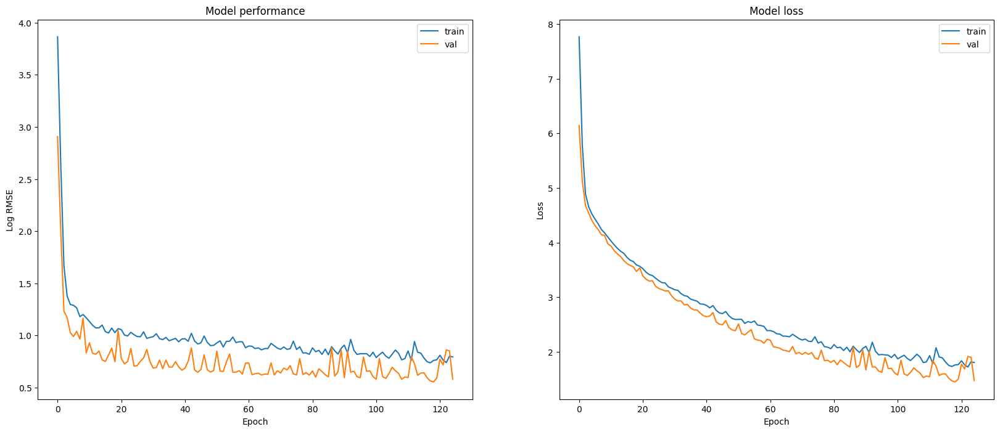

In [ ]:
plot_learning_curves(history1, log=True)
plt.show()

The model is saved so that it can be reused.

In [ ]:
# Save the model
model_path = path + "models/"

save_model(model, model_path)

Saved model_2021-04-11-0328Z.h5 to gdrive/MyDrive/207_final_project/data/models/


### Model 2 - Creating a deeper network with 6 layers

To improve on Model 1, the complexity of the model is increased in an attempt to fit to the data better and reduce the loss function at a greater rate in the same number of epochs.

The following alterations are made to Model 2:
- The number of filters in layer 1 is increased to 96
- The number of filters in layer 2 is increased to 256
- 2 additional convolution layers are added 
- The max pooling layer is removed and replaced with a stride of size 2 in the last convolution layer
- The number of nodes in the first dense layer is reduced from 600 to 300

As a result, the number of model parameters increase from 39,393,034 to 66,767,378.


In [ ]:
# instantiating the model in the strategy scope creates the model on the TPU
with tpu_strategy.scope():

  # Initialize the model
  model2 = Sequential() 

  # Use four convolutional layers instead of two
  model2.add(Conv2D(filters=96, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform', input_shape=(img_rows, img_cols, 1)))
  model2.add(Conv2D(filters=256, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform'))
  model2.add(Conv2D(filters=128, kernel_size=(2, 2), padding='same', activation='relu', kernel_initializer='he_uniform'))
  model2.add(Conv2D(filters=96, kernel_size=(2, 2), strides= (2,2), padding='same', activation='relu', kernel_initializer='he_uniform'))

  # Flatten to create the input for the feed-forward layers
  model2.add(Flatten())
  
  # First connected layer
  model2.add(Dropout(0.5))
  model2.add(Dense(units=300, activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l2(0.01))) 

  # Second conected layer
  model2.add(Dropout(0.5))
  model2.add(Dense(input_dim=300, units=30, activation='linear')) 

  opt = Adam(learning_rate=0.001)

  # Cost function & Objective (and solver)
  model2.compile(optimizer=opt, loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])

  # Show the architecture of the new model
  model2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 96, 96, 96)        960       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 96, 96, 256)       221440    
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 96, 96, 128)       131200    
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 48, 48, 96)        49248     
_________________________________________________________________
flatten_1 (Flatten)          (None, 221184)            0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 221184)            0         
_________________________________________________________________
dense_2 (Dense)              (None, 300)              

In [ ]:
# Show the architecture of the old model
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 96, 96, 90)        900       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 96, 96, 64)        51904     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 32, 32, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 32, 32, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 65536)             0         
_________________________________________________________________
dense (Dense)                (None, 600)               39322200  
_________________________________________________________________
dense_1 (Dense)              (None, 30)                1

In [ ]:
# Save the model weights before training to be reused 
initial_weights2 = 'models/random_initial_weights2.h5'
# model2.save_weights(path + initial_weights2)

**Final validation RMSE - 2.7705**

As can be seen from the final validation RMSE and the learning curve, the model does much worse than Model 1, largely as a result of what seems to be underfitting to the training data. This could be due to there not being enough data points to train a model of such great complexity.

In [ ]:
model2.load_weights(path + initial_weights2)
history2, score2 = eval_model(aug_dict, best_N, best_M, div, model2, train_data, train_labels, split_size=0.2, **train_params)

Epoch 1/125
27/27 [==============================] - 31s 786ms/step - loss: 4072.0579 - root_mean_squared_error: 61.4609 - val_loss: 364.1075 - val_root_mean_squared_error: 18.7493
Epoch 2/125
27/27 [==============================] - 2s 83ms/step - loss: 690.3706 - root_mean_squared_error: 26.0198 - val_loss: 192.5715 - val_root_mean_squared_error: 13.4002
Epoch 3/125
27/27 [==============================] - 2s 94ms/step - loss: 501.4439 - root_mean_squared_error: 22.1025 - val_loss: 265.5038 - val_root_mean_squared_error: 15.9058
Epoch 4/125
27/27 [==============================] - 2s 84ms/step - loss: 403.1863 - root_mean_squared_error: 19.7611 - val_loss: 240.0763 - val_root_mean_squared_error: 15.1001
Epoch 5/125
27/27 [==============================] - 2s 83ms/step - loss: 319.7867 - root_mean_squared_error: 17.5274 - val_loss: 65.8311 - val_root_mean_squared_error: 7.3557
Epoch 6/125
27/27 [==============================] - 2s 83ms/step - loss: 244.1608 - root_mean_squared_error:

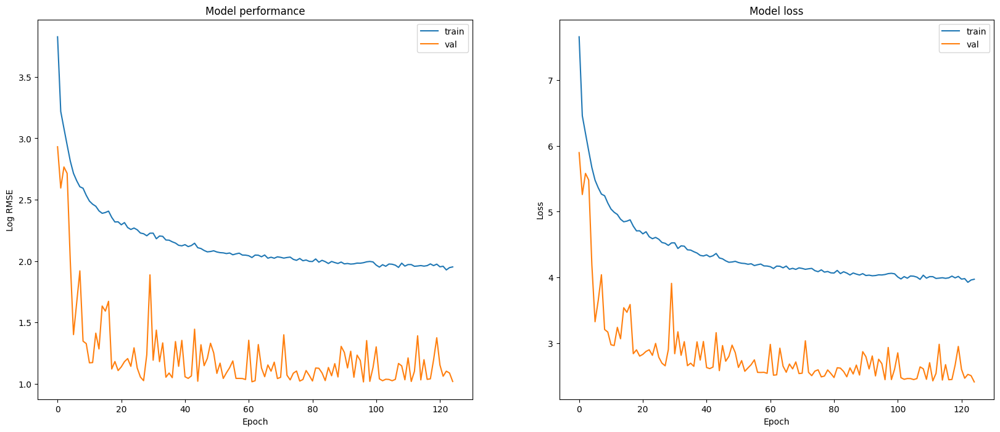

In [ ]:
plot_learning_curves(history2, log=True)
plt.show()

### Model 3 - Decrease the width of the 6 layer model

To improve on Model 2, the complexity of the model is this time decreased in an attempt to fit to the data better. The number of layers are kept the same, but the width of the model (i.e., number of filters) is reduced.

The following alterations are made to Model 3:

- The number of filters in layer 1 is decreased to 64
- The number of filters in layer 2 is decreased to 96
- The number of filters in layer 3 is decreased to 96
- The number of filters in layer 4 is decreased to 64
- The dropout layer is moved to before the first dense layer

As a result, the number of model parameters decreased from 66,767,378 to 44,363,762.

In [ ]:
# instantiating the model in the strategy scope creates the model on the TPU
with tpu_strategy.scope():

  # Initialize the model
  model3 = Sequential() 

  # Use four convolutional layers instead of two
  model3.add(Conv2D(filters=64, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform', input_shape=(img_rows, img_cols, 1)))
  model3.add(Conv2D(filters=96, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform'))
  model3.add(Conv2D(filters=96, kernel_size=(2, 2), padding='same', activation='relu', kernel_initializer='he_uniform'))
  model3.add(Conv2D(filters=64, kernel_size=(2, 2), strides= (2,2), padding='same', activation='relu', kernel_initializer='he_uniform'))

  # Flatten to create the input for the feed-forward layers
  model3.add(Flatten())
  
  # First connected layer
  model3.add(Dropout(0.5))
  model3.add(Dense(units=300, activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l2(0.01))) 

  # Second conected layer
  model3.add(Dense(input_dim=300, units=30, activation='linear')) 

  opt = Adam(learning_rate=0.001)

  # Cost function & Objective (and solver)
  model3.compile(optimizer=opt, loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])

  # Show the new model architecture
  model3.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 96, 96, 64)        640       
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 96, 96, 96)        55392     
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 96, 96, 96)        36960     
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 48, 48, 64)        24640     
_________________________________________________________________
flatten_2 (Flatten)          (None, 147456)            0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 147456)            0         
_________________________________________________________________
dense_4 (Dense)              (None, 300)              

In [ ]:
# Show the old model architecture
model2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 96, 96, 96)        960       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 96, 96, 256)       221440    
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 96, 96, 128)       131200    
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 48, 48, 96)        49248     
_________________________________________________________________
flatten_1 (Flatten)          (None, 221184)            0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 221184)            0         
_________________________________________________________________
dense_2 (Dense)              (None, 300)              

In [ ]:
# Save the model weights before training to be reused 
initial_weights3 = 'models/random_initial_weights3.h5'
#model3.save_weights(path + initial_weights3)

**Final validation RMSE - 1.7353**

As can be seen from the final validation RMSE and the learning curve, the model does better than both Model 1 and Model 2, with faster convergence to a better local minima which leads to greater reduction in the loss and RMSE.

However, there is great fluctuation in the learning curve as well as an increase in the training loss towards the end, which seems to suggest that the model is overfit.

In [ ]:
# Load the initial weights and evaluate the model
model3.load_weights(path + initial_weights3)
history3, score3 = eval_model(aug_dict, best_N, best_M, div, model3, train_data, train_labels, split_size=0.2, **train_params)

Epoch 1/125
27/27 [==============================] - 18s 425ms/step - loss: 693.2902 - root_mean_squared_error: 25.0300 - val_loss: 104.7604 - val_root_mean_squared_error: 9.7328
Epoch 2/125
27/27 [==============================] - 2s 67ms/step - loss: 149.8948 - root_mean_squared_error: 11.8067 - val_loss: 77.1073 - val_root_mean_squared_error: 8.1935
Epoch 3/125
27/27 [==============================] - 2s 63ms/step - loss: 62.5895 - root_mean_squared_error: 7.2464 - val_loss: 28.4731 - val_root_mean_squared_error: 4.3387
Epoch 4/125
27/27 [==============================] - 2s 65ms/step - loss: 28.4821 - root_mean_squared_error: 4.3430 - val_loss: 17.9554 - val_root_mean_squared_error: 2.9723
Epoch 5/125
27/27 [==============================] - 2s 64ms/step - loss: 17.8140 - root_mean_squared_error: 2.9680 - val_loss: 16.3031 - val_root_mean_squared_error: 2.7853
Epoch 6/125
27/27 [==============================] - 2s 65ms/step - loss: 15.0753 - root_mean_squared_error: 2.5818 - val_l

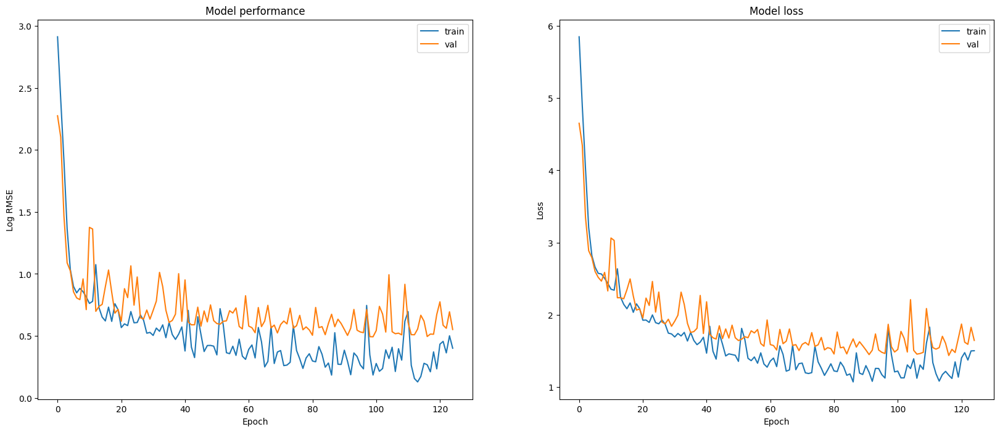

In [ ]:
plot_learning_curves(history3, log=True)
plt.show()

The model is saved so that it can be reused.

In [ ]:
model_path = path + "models/"

# Save the model
save_model(model3, model_path)

Saved model_2021-04-11-0514Z.h5 to gdrive/MyDrive/207_final_project/data/models/


### Model 4a - Reduce overfitting and training noise

To improve on Model 3, additional regularization is added in the form of a batch normalization model to reduce the overfitting. In order to control for the noisy training and validation learning curves, the learning rate is also decreased.

The following alterations are made to Model 4:

- Add a batch normalization layer between the dense layers
- Reduce the Adam learning rate from 0.001 to 0.0009

In [ ]:
# instantiating the model in the strategy scope creates the model on the TPU
with tpu_strategy.scope():

  # Initialize the model
  model4 = Sequential() 

  # Use four convolutional layers instead of two
  model4.add(Conv2D(filters=64, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform', input_shape=(img_rows, img_cols, 1)))
  model4.add(Conv2D(filters=96, kernel_size=(3, 3), padding='same', activation='relu', kernel_initializer='he_uniform'))
  model4.add(Conv2D(filters=96, kernel_size=(2, 2), padding='same', activation='relu', kernel_initializer='he_uniform'))
  model4.add(Conv2D(filters=64, kernel_size=(2, 2), strides= (2,2), padding='same', activation='relu', kernel_initializer='he_uniform'))

  # Flatten to create the input for the feed-forward layers
  model4.add(Flatten())
  
  # First connected layer
  model4.add(Dropout(0.5))
  model4.add(Dense(units=300, activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l2(0.001))) 

  # Add a batch normalization layer
  model4.add(BatchNormalization())

  # Second conected layer
  model4.add(Dense(input_dim=300, units=30, activation='linear')) 

  opt = Adam(learning_rate=0.0009)

  # Cost function & Objective (and solver)
  model4.compile(optimizer=opt, loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])

  # Show the new model architecture
  model4.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_26 (Conv2D)           (None, 96, 96, 64)        640       
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 96, 96, 96)        55392     
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 96, 96, 96)        36960     
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 48, 48, 64)        24640     
_________________________________________________________________
flatten_7 (Flatten)          (None, 147456)            0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 147456)            0         
_________________________________________________________________
dense_13 (Dense)             (None, 300)              

In [ ]:
# Show the old model architecture
model3.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 96, 96, 64)        640       
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 96, 96, 96)        55392     
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 96, 96, 96)        36960     
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 48, 48, 64)        24640     
_________________________________________________________________
flatten_2 (Flatten)          (None, 147456)            0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 147456)            0         
_________________________________________________________________
dense_4 (Dense)              (None, 300)              

In [ ]:
# Save the model weights before training to be reused 
initial_weights4 = 'models/random_initial_weights4.h5'
# model4.save_weights(path + initial_weights4)

**Final validation RMSE - 1.7062**

As can be seen from the final validation RMSE and the learning curve, the model does better than Model 3, again improving on the rate of convergence to a better local minima which leads to greater reduction in the loss and RMSE. Additionally, there seems to be no overfitting of the train dataset.

However, there is even greater fluctuation in the learning curve during the first half of the model training, although these fluctuations decrease during the second half of the model training.

In [ ]:
model4.load_weights(path + initial_weights4)
history4, score4 = eval_model(aug_dict, best_N, best_M, div, model4, train_data, train_labels, split_size=0.2, **train_params)

Epoch 1/125
27/27 [==============================] - 18s 436ms/step - loss: 2606.6499 - root_mean_squared_error: 51.0488 - val_loss: 2590.1204 - val_root_mean_squared_error: 50.8822
Epoch 2/125
27/27 [==============================] - 2s 68ms/step - loss: 2574.0119 - root_mean_squared_error: 50.7225 - val_loss: 2579.5840 - val_root_mean_squared_error: 50.7764
Epoch 3/125
27/27 [==============================] - 2s 69ms/step - loss: 2466.1686 - root_mean_squared_error: 49.6462 - val_loss: 2178.0603 - val_root_mean_squared_error: 46.6531
Epoch 4/125
27/27 [==============================] - 2s 67ms/step - loss: 2291.2883 - root_mean_squared_error: 47.8492 - val_loss: 2140.6904 - val_root_mean_squared_error: 46.2468
Epoch 5/125
27/27 [==============================] - 2s 69ms/step - loss: 2048.9689 - root_mean_squared_error: 45.2411 - val_loss: 1782.6232 - val_root_mean_squared_error: 42.1950
Epoch 6/125
27/27 [==============================] - 2s 67ms/step - loss: 1755.2358 - root_mean_sq

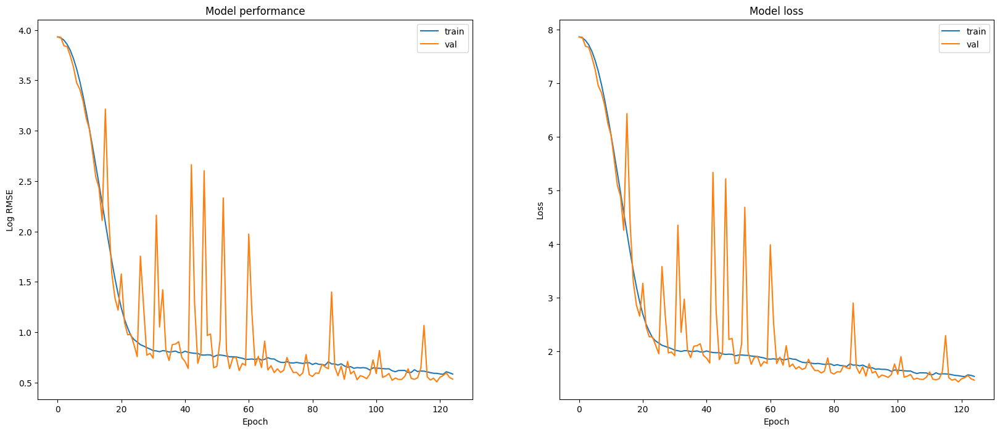

In [ ]:
plot_learning_curves(history4, log=True)
plt.show()

The model is saved so that it can be reused.

In [ ]:
model_path = path + "models/"

# Save the model
save_model(model4, model_path)

Saved model_2021-04-11-1536Z.h5 to gdrive/MyDrive/207_final_project/data/models/


### Model 4b - Reduce variance in the validation set and increase fit

To improve Model 4, no changes are made to the model architecture, but instead the training specific hyperparameters are altered in an attempt to reduce the fluctuations in the learning curve. It was hypothesized that the fluctuations in validation loss was due to the variance in the validation data set as well as the mini batches. 

Additionally, the model was trained longer in order to allow for further reduction in the loss function.

The following adjustments were made to the training parameter:

- Increase the validation set size to 0.25 to allow for more variation
- Increase the batch size to reduce the variance
- Increase the number of epochs to allow for the model to train longer

In [ ]:
# Increase the batch size again to try and improve upon baseline performance
BATCH_SIZE = 32 * tpu_strategy.num_replicas_in_sync
print(BATCH_SIZE)

256


In [ ]:
# Increase the number of epochs
epochs = 150
train_params = {'batch_size':BATCH_SIZE, 'epochs':epochs, 'verbose':1}

**Final validation RMSE - 1.5624**

As can be seen from the final validation RMSE and the learning curve, the model does better than the prevoiusly trained Model 4 as a direct result of the longer training given the increase in number of epochs.

However, there is even greater fluctuation than the first training of Model 4, and the fluctuations occur all throughout the learning curve.

In [ ]:
# Load the initial model weights and evaluate the model using a validation set of 0.25
model4.load_weights(path + initial_weights4)
history4, score4 = eval_model(aug_dict, best_N, best_M, div, model4, train_data, train_labels, split_size=0.25, **train_params)

Epoch 1/150
13/13 [==============================] - 2s 129ms/step - loss: 2610.7129 - root_mean_squared_error: 51.0743 - val_loss: 2704.6531 - val_root_mean_squared_error: 51.9627
Epoch 2/150
13/13 [==============================] - 1s 106ms/step - loss: 2602.4026 - root_mean_squared_error: 50.9565 - val_loss: 2513.5959 - val_root_mean_squared_error: 50.0665
Epoch 3/150
13/13 [==============================] - 1s 104ms/step - loss: 2586.6221 - root_mean_squared_error: 50.7896 - val_loss: 2656.4302 - val_root_mean_squared_error: 51.4742
Epoch 4/150
13/13 [==============================] - 1s 103ms/step - loss: 2555.4653 - root_mean_squared_error: 50.4873 - val_loss: 2526.1760 - val_root_mean_squared_error: 50.2011
Epoch 5/150
13/13 [==============================] - 1s 104ms/step - loss: 2488.6404 - root_mean_squared_error: 49.8290 - val_loss: 2384.5898 - val_root_mean_squared_error: 48.7772
Epoch 6/150
13/13 [==============================] - 1s 104ms/step - loss: 2351.3892 - root_mea

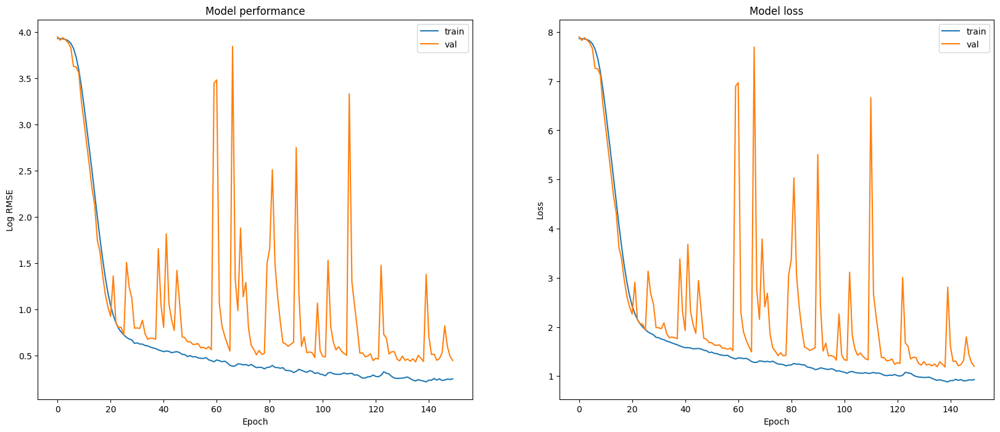

In [ ]:
plot_learning_curves(history4, log=True)
plt.show()

The model is saved so that it can be reused.

In [ ]:
model_path = path + "models/"

# Save the model
save_model(model4, model_path)

Saved model_2021-04-11-1652Z.h5 to gdrive/MyDrive/207_final_project/data/models/


### Model 5 - Reduce fluctuations in validation loss by reducing model complexity

To improve Model 4, the model complexity is greatly reduced in order to minimize the effect of varied validation data on the loss function. In order to reduce model complexity, the number of parameters within the model is greatly reduced by decreasing the number and size of the feature maps within each layer. This is achieved by increasing stride size in each layer.


The following alterations are made to Model 5:
- Increased stride length to 4 in layer 1
- Increased kernel size to 5x5 in layer 1
- Increased stride length to 3 in layer 2
- Increased stride length to 2 in layer 3
- Increased kernel size to 3x3 in layer 3
- Increased stride length to 2 in layer 4
- Increased kernel size to 3x3 in layer 4
- Reduced number of nodes to 150 in layer 5
- Changed L2 regularization to L1 regularization in layer 5
- Increased the learning rate to 0.003

As a result, the number of model parameters decreased from 44,363,762 to 341,344.

In [ ]:
# instantiating the model in the strategy scope creates the model on the TPU
with tpu_strategy.scope():

  # Initialize the model
  model5 = Sequential() 

  # Add greater stride length
  model5.add(Conv2D(filters=64, kernel_size=(5, 5), strides=(4,4), padding='same', activation='relu', kernel_initializer='he_uniform', input_shape=(img_rows, img_cols, 1)))
  model5.add(Conv2D(filters=96, kernel_size=(3, 3), strides=(3,3), padding='same', activation='relu', kernel_initializer='he_uniform'))
  model5.add(Conv2D(filters=128, kernel_size=(3, 3), strides=(2,2), padding='same', activation='relu', kernel_initializer='he_uniform'))
  model5.add(Conv2D(filters=96, kernel_size=(3, 3), strides=(2,2), padding='same', activation='relu', kernel_initializer='he_uniform'))

  # Flatten to create the input for the feed-forward layers
  model5.add(Flatten())
  
  # First connected layer, use l1 regularization instead
  model5.add(Dropout(0.5))
  model5.add(Dense(units=150, activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l1(0.001))) 

  # Add a batch normalization layer
  model5.add(BatchNormalization())

  # Second conected layer
  model5.add(Dense(input_dim=150, units=30, activation='linear')) 

  # Increase learning rate
  opt = Adam(learning_rate=0.003)

  # Cost function & Objective (and solver)
  model5.compile(optimizer=opt, loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])

  # Show the new model architecture
  model5.summary()

Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_103 (Conv2D)          (None, 24, 24, 64)        1664      
_________________________________________________________________
conv2d_104 (Conv2D)          (None, 8, 8, 96)          55392     
_________________________________________________________________
conv2d_105 (Conv2D)          (None, 4, 4, 128)         110720    
_________________________________________________________________
conv2d_106 (Conv2D)          (None, 2, 2, 96)          110688    
_________________________________________________________________
flatten_30 (Flatten)         (None, 384)               0         
_________________________________________________________________
dropout_31 (Dropout)         (None, 384)               0         
_________________________________________________________________
dense_60 (Dense)             (None, 150)             

In [ ]:
# Show the old model architecture
model4.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_26 (Conv2D)           (None, 96, 96, 64)        640       
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 96, 96, 96)        55392     
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 96, 96, 96)        36960     
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 48, 48, 64)        24640     
_________________________________________________________________
flatten_7 (Flatten)          (None, 147456)            0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 147456)            0         
_________________________________________________________________
dense_13 (Dense)             (None, 300)              

In [ ]:
# Save the model weights before training to be reused 
initial_weights5 = 'models/random_initial_weights5.h5'
#model5.save_weights(path + initial_weights5)

**Final validation RMSE - 1.6824**

As can be seen from the final validation RMSE, the model does worse than the prevoiusly trained Model 4. Conversely, when observing the learning curve for the validation loss and RMSE, there is a great reduction in the fluctuations during training, leading to a relatively smooth curve. This is likely a result of the reduced number of parameters that are not as sensitive to variation in the validation data.

However, as stated, some of the RMSE performance from Model 4 is lost, which could be a result of too much reduction in model complexity.

In [ ]:
model5.load_weights(path + initial_weights5)
history5, score5 = eval_model(aug_dict, best_N, best_M, div, model5, train_data, train_labels, split_size=0.2, **train_params)

Epoch 1/150
14/14 [==============================] - 10s 324ms/step - loss: 2615.3589 - root_mean_squared_error: 51.1077 - val_loss: 2694.1609 - val_root_mean_squared_error: 51.8793
Epoch 2/150
14/14 [==============================] - 1s 64ms/step - loss: 2563.0279 - root_mean_squared_error: 50.6015 - val_loss: 2508.1541 - val_root_mean_squared_error: 50.0614
Epoch 3/150
14/14 [==============================] - 1s 66ms/step - loss: 2449.4022 - root_mean_squared_error: 49.4716 - val_loss: 2315.4873 - val_root_mean_squared_error: 48.1028
Epoch 4/150
14/14 [==============================] - 1s 66ms/step - loss: 2241.2102 - root_mean_squared_error: 47.3232 - val_loss: 2039.8488 - val_root_mean_squared_error: 45.1490
Epoch 5/150
14/14 [==============================] - 1s 63ms/step - loss: 1949.8558 - root_mean_squared_error: 44.1378 - val_loss: 1684.1829 - val_root_mean_squared_error: 41.0228
Epoch 6/150
14/14 [==============================] - 1s 69ms/step - loss: 1598.0825 - root_mean_sq

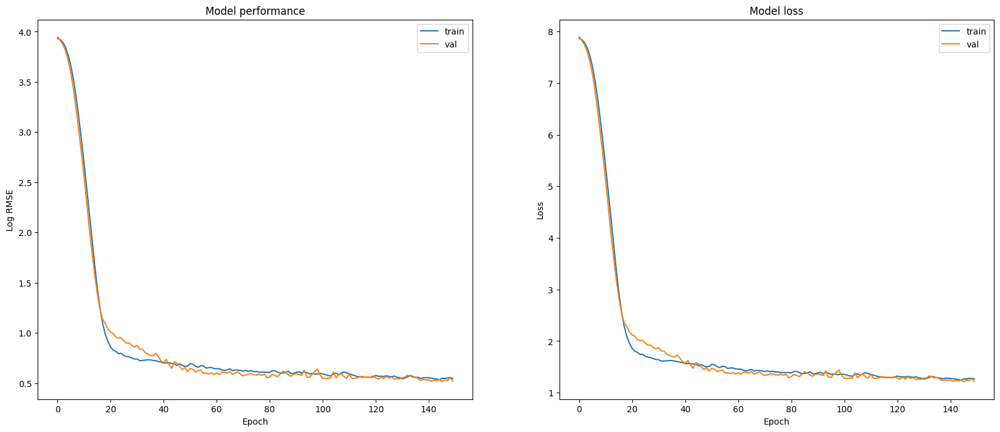

In [ ]:
plot_learning_curves(history5, log=True)
plt.show()

The model is saved so that it can be reused.

In [ ]:
model_path = path + "models/"

# Save the model
save_model(model5, model_path)

Saved model_2021-04-11-1912Z.h5 to gdrive/MyDrive/207_final_project/data/models/


### Model 6 - Add a 7th layer to increase the model complexity again

To improve Model 5, the model complexity is slightly increased in an attempt to make minor gains on the validation RMSE. This is achieved by adding another convolutional layer between the 3rd and 4th layers.

The following alterations are made to Model 6:

- Added a convolutional layer with 128 filters and stride of 2

As a result, the number of model parameters increased from 341,344 to 427,488.


In [ ]:
# instantiating the model in the strategy scope creates the model on the TPU
with tpu_strategy.scope():

  # Initialize the model
  model6 = Sequential() 

  # Reduce number of convolutional layers from 4 to 3
  model6.add(Conv2D(filters=64, kernel_size=(5, 5), strides=(4,4), padding='same', activation='relu', kernel_initializer='he_uniform', input_shape=(img_rows, img_cols, 1)))
  model6.add(Conv2D(filters=96, kernel_size=(3, 3), strides=(3,3), padding='same', activation='relu', kernel_initializer='he_uniform'))
  model6.add(Conv2D(filters=128, kernel_size=(3, 3), strides=(2,2), padding='same', activation='relu', kernel_initializer='he_uniform'))
  model6.add(Conv2D(filters=128, kernel_size=(3, 3), strides=(2,2), padding='same', activation='relu', kernel_initializer='he_uniform'))
  model6.add(Conv2D(filters=96, kernel_size=(2, 2), padding='same', activation='relu', kernel_initializer='he_uniform'))

  # Flatten to create the input for the feed-forward layers
  model6.add(Flatten())
  
  # First connected layer
  model6.add(Dropout(0.5))
  model6.add(Dense(units=150, activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l2(0.01))) 

  # Add a batch normalization layer
  model6.add(BatchNormalization())

  # Second conected layer
  model6.add(Dense(input_dim=150, units=30, activation='linear')) 

  opt = Adam(learning_rate=0.003)

  # Cost function & Objective (and solver)
  model6.compile(optimizer=opt, loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])
  model6.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 24, 24, 64)        1664      
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 8, 8, 96)          55392     
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 4, 4, 128)         110720    
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 2, 2, 128)         147584    
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 2, 2, 96)          49248     
_________________________________________________________________
flatten_3 (Flatten)          (None, 384)               0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 384)              

In [ ]:
model5.summary()

Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_103 (Conv2D)          (None, 24, 24, 64)        1664      
_________________________________________________________________
conv2d_104 (Conv2D)          (None, 8, 8, 96)          55392     
_________________________________________________________________
conv2d_105 (Conv2D)          (None, 4, 4, 128)         110720    
_________________________________________________________________
conv2d_106 (Conv2D)          (None, 2, 2, 96)          110688    
_________________________________________________________________
flatten_30 (Flatten)         (None, 384)               0         
_________________________________________________________________
dropout_31 (Dropout)         (None, 384)               0         
_________________________________________________________________
dense_60 (Dense)             (None, 150)             

In [ ]:
# Save the model weights before training to be reused 
initial_weights6 = 'models/random_initial_weights6.h5'
#model6.save_weights(path + initial_weights6)

**Final validation RMSE - 2.0839**

As can be seen from the final validation RMSE, the model does worse than Model 5. Although the fluctuations within the validation learning curve is still kept to a minimum, there is a small degree of overfitting that occurs in the latter half of the training. This is likely a result of the increased number of parameters leading to too much model complexity.

In [ ]:
model6.load_weights(path + initial_weights6)
history6, score6 = eval_model(aug_dict, best_N, best_M, div, model6, train_data, train_labels, split_size=0.2, **train_params)

Epoch 1/150
14/14 [==============================] - 10s 327ms/step - loss: 2612.3444 - root_mean_squared_error: 51.0853 - val_loss: 2618.7866 - val_root_mean_squared_error: 51.1578
Epoch 2/150
14/14 [==============================] - 1s 64ms/step - loss: 2563.7929 - root_mean_squared_error: 50.6194 - val_loss: 2326.4644 - val_root_mean_squared_error: 48.2233
Epoch 3/150
14/14 [==============================] - 1s 63ms/step - loss: 2447.6935 - root_mean_squared_error: 49.4645 - val_loss: 2312.7256 - val_root_mean_squared_error: 48.0838
Epoch 4/150
14/14 [==============================] - 1s 68ms/step - loss: 2238.7147 - root_mean_squared_error: 47.3069 - val_loss: 2013.4235 - val_root_mean_squared_error: 44.8652
Epoch 5/150
14/14 [==============================] - 1s 67ms/step - loss: 1951.2591 - root_mean_squared_error: 44.1637 - val_loss: 1663.8541 - val_root_mean_squared_error: 40.7846
Epoch 6/150
14/14 [==============================] - 1s 67ms/step - loss: 1599.9885 - root_mean_sq

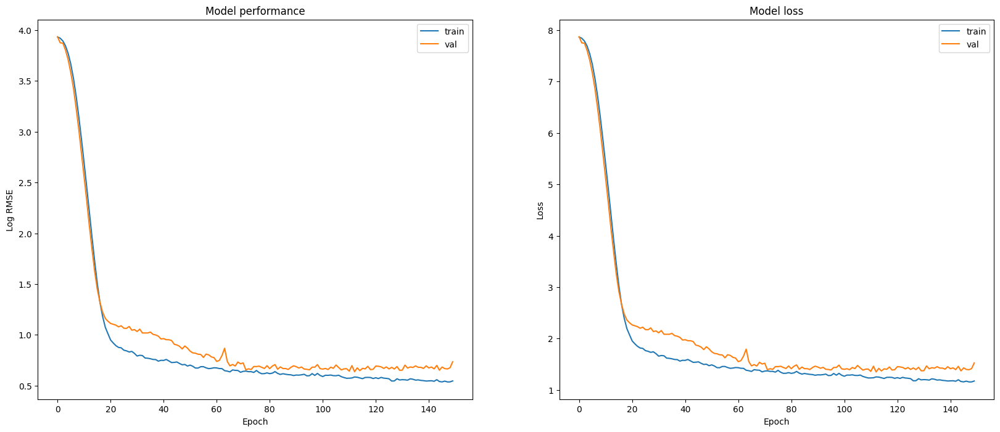

In [ ]:
plot_learning_curves(history6, log=True)
plt.show()

### Model 7 - Revert to the 6 layer model but increase model complexity

To improve Model 6, the model is reverted to 6 layers and complexity is slightly increased using the increase of kernels and decreased regularization in the dense layers. However, to prevent too much under-regularization and counteract increased complexity, slight regularization is introduced in the latter convolutional layers.

The following alterations are made to Model 7:

- Increase the number of kernels in layer 1 
- Decrease the dropout ratio to 0.4
- Increase the L2 regularization in layer 5 to 0.003
- Add L2 regularization with a value of 0.001 to the convolutional layers 3 and 4

As a result, the number of model parameters decreased from 427,488 to 369,824 (Model 5 had 341,344).


Additionally, the number of epochs is decreased to 125 to stop the model training early and stem the resulting overfitting.

In [ ]:
# instantiating the model in the strategy scope creates the model on the TPU
with tpu_strategy.scope():

  # Initialize the model
  model7 = Sequential() 

  # Add more filters to the model
  model7.add(Conv2D(filters=96, kernel_size=(5, 5), strides=(3,3), padding='same', activation='relu', kernel_initializer='he_uniform', input_shape=(img_rows, img_cols, 1)))
  model7.add(Conv2D(filters=96, kernel_size=(3, 3), strides=(3,3), padding='same', activation='relu', kernel_initializer='he_uniform'))
  model7.add(Conv2D(filters=128, kernel_size=(3, 3), strides=(3,3), padding='same', activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l2(0.001)))
  model7.add(Conv2D(filters=96, kernel_size=(3, 3), strides=(2,2), padding='same', activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l2(0.001)))

  # Flatten to create the input for the feed-forward layers
  model7.add(Flatten())
  
  # First connected layer, use l1 regularization instead
  model7.add(Dropout(0.4))
  model7.add(Dense(units=150, activation='relu', kernel_initializer='he_uniform', kernel_regularizer=l2(0.003))) 

  # Add a batch normalization layer
  model7.add(BatchNormalization())

  # Second conected layer
  model7.add(Dense(input_dim=150, units=30, activation='linear')) 

  # Increase learning rate
  opt = Adam(learning_rate=0.003)

  # Cost function & Objective (and solver)
  model7.compile(optimizer=opt, loss='mse', metrics=[keras.metrics.RootMeanSquaredError()])
  model7.summary()

Model: "sequential_69"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_271 (Conv2D)          (None, 32, 32, 96)        2496      
_________________________________________________________________
conv2d_272 (Conv2D)          (None, 11, 11, 96)        83040     
_________________________________________________________________
conv2d_273 (Conv2D)          (None, 4, 4, 128)         110720    
_________________________________________________________________
conv2d_274 (Conv2D)          (None, 2, 2, 96)          110688    
_________________________________________________________________
flatten_67 (Flatten)         (None, 384)               0         
_________________________________________________________________
dropout_68 (Dropout)         (None, 384)               0         
_________________________________________________________________
dense_134 (Dense)            (None, 150)             

In [ ]:
model6.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 24, 24, 64)        1664      
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 8, 8, 96)          55392     
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 4, 4, 128)         110720    
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 2, 2, 128)         147584    
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 2, 2, 96)          49248     
_________________________________________________________________
flatten_3 (Flatten)          (None, 384)               0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 384)              

In [ ]:
# Save the model weights before training to be reused 
initial_weights7 = 'models/random_initial_weights7.h5'
#model7.save_weights(path + initial_weights7)

In [ ]:
# Reduce the number of epochs to prevent overfitting
epochs = 125
train_params = {'batch_size':BATCH_SIZE, 'epochs':epochs, 'verbose':1}

**Final validation RMSE - 1.6894**

As can be seen from the final validation RMSE, the model does better than Model 6, but cannot improve on the performance of Model 5. Again, the fluctuations within the validation learning curve is kept to a minimum, and the overfitting that previously occured towards the end of training is absent. However, the reduction of both the validation and training loss seems to taper early on and is mainly flat for the rest of the training period. This seems to suggest the for the given model complexity, the model performance has reached it's limit.


In [ ]:
model7.load_weights(path + initial_weights7)
history7, score7 = eval_model(aug_dict, best_N, best_M, div, model7, train_data, train_labels, split_size=0.2, **train_params)

Epoch 1/125
14/14 [==============================] - 9s 325ms/step - loss: 2611.2445 - root_mean_squared_error: 51.0881 - val_loss: 2615.7920 - val_root_mean_squared_error: 51.1350
Epoch 2/125
14/14 [==============================] - 1s 63ms/step - loss: 2563.6422 - root_mean_squared_error: 50.6228 - val_loss: 2597.9355 - val_root_mean_squared_error: 50.9619
Epoch 3/125
14/14 [==============================] - 1s 64ms/step - loss: 2445.4072 - root_mean_squared_error: 49.4423 - val_loss: 2278.1121 - val_root_mean_squared_error: 47.7219
Epoch 4/125
14/14 [==============================] - 1s 64ms/step - loss: 2232.9891 - root_mean_squared_error: 47.2454 - val_loss: 1990.9509 - val_root_mean_squared_error: 44.6123
Epoch 5/125
14/14 [==============================] - 1s 65ms/step - loss: 1942.3933 - root_mean_squared_error: 44.0616 - val_loss: 1677.8597 - val_root_mean_squared_error: 40.9535
Epoch 6/125
14/14 [==============================] - 1s 65ms/step - loss: 1591.9781 - root_mean_squ

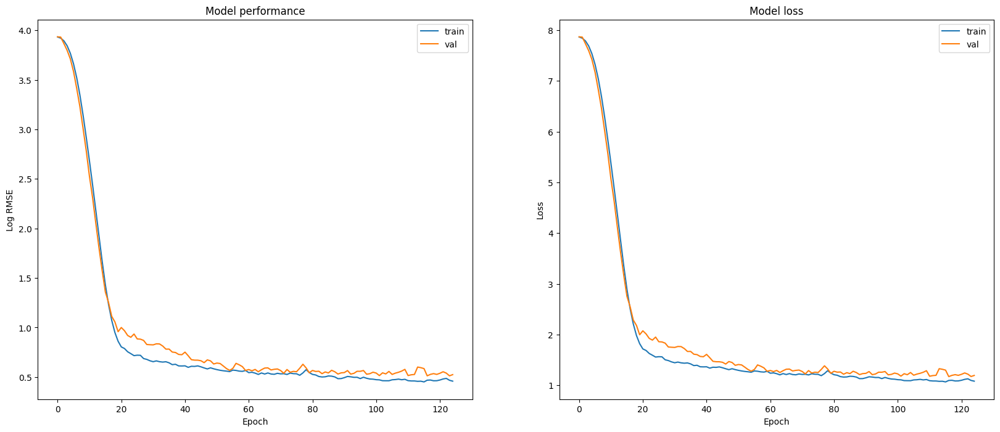

In [ ]:
plot_learning_curves(history7, log=True)
plt.show()

## 6. Prediction of Keypoints on Test Data

From the range of trained models, it was identified that Model 4 (with longer training and greater validation split) had the best performance in terms of validation RMSE. Although there were vast fluctuations in the validation loss during training, the general slope of the learning curve was downward, alleviating concerns of possible overfitting as a result of the complexity of the model.

Model 4 was then used to predict the labels of the test data set. Although the labels were not available to put a firm RMSE value on the performance of the model on the test data set, it is apparent from the plotted predicted labels over the images that the model performs very well on unseen images as well.

In [ ]:
def predict_test(model_path, test_data):

  '''
  Loads a trained model and uses it to predict on some test data, and returns the predictions.
  '''

  test_data = test_data/255

  test_data = test_data.reshape(test_data.shape[0], test_data.shape[1], test_data.shape[2], 1)

  model = load_model(model_path)
  y = model.predict(test_data)

  return y

In [ ]:
# Get the model filename for model 4b
model_file = 'model_2021-04-11-1652Z.h5'

In [ ]:
# Predict the labels for the test data set
predicts = predict_test(model_path + model_file, test_data)

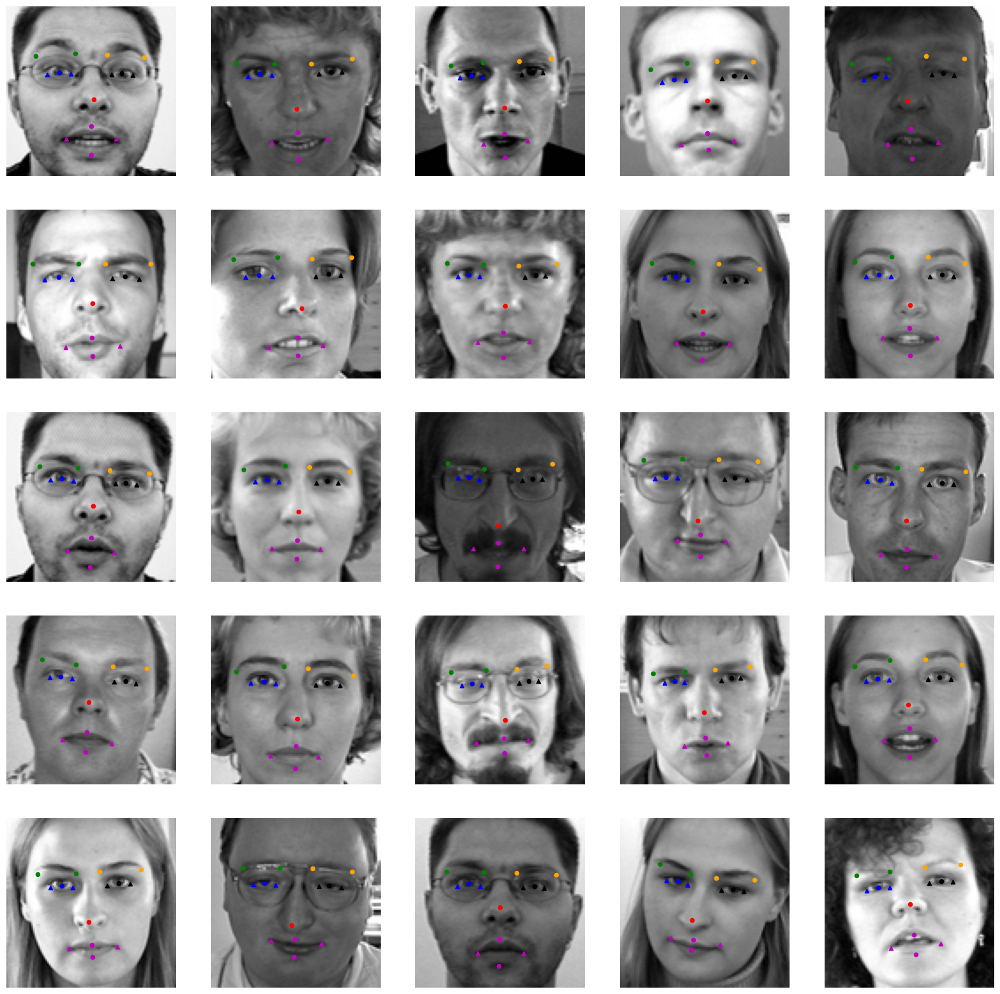

In [ ]:
# Plot the first 25 predicted labels
plot_grid(25, 5, 5, test_data, predicts)

## 7. Challenges & Future Improvements




In the future, the model may benefit from an improvement in both the number of augmentations and magnitudes of augmentations to add variability in the training data set. This variability will enable to model to generalize better to other images that may not fit the framing and positioning of the faces provided within the Kaggle data set, which does not align with images seen in the real world.

### Rotated images from original test set


Below, the model is used to predict on images with random rotations to demonstrate the limitations. The model performs relatively well for minor rotations, but performs poorly on larger degrees of rotation.

In [ ]:
def random_rotate(images):

  '''
  Performs a random rotation between -179 and 180 degrees on the given images
  and returns all the rotated images.
  '''

  rotated_images = []

  for image in images:

    # Generate a random angle
    angle = random.randint(-179, 180)

    # Convert type to unit8 for cv2
    new_image = image.astype(np.uint8)

    # Get the border 
    mean = np.mean(new_image)

    # Get the rotation matrix for the angle
    M = cv2.getRotationMatrix2D((48,48), angle, 1.0)

    # Perform an affine transformation on the original image using the rotation matrix to get the rotated image
    new_image = cv2.warpAffine(new_image, M, (96,96), flags=cv2.INTER_CUBIC, borderValue=np.array([mean, mean, mean]))

    rotated_images.append(new_image)

  return np.array(rotated_images)

In [ ]:
# Rotate the first 25 images
rotated_images = random_rotate(test_data[:25])

In [ ]:
# Predict on the rotated images
predict_rotate = predict_test(model_path + final1_path, rotated_images)

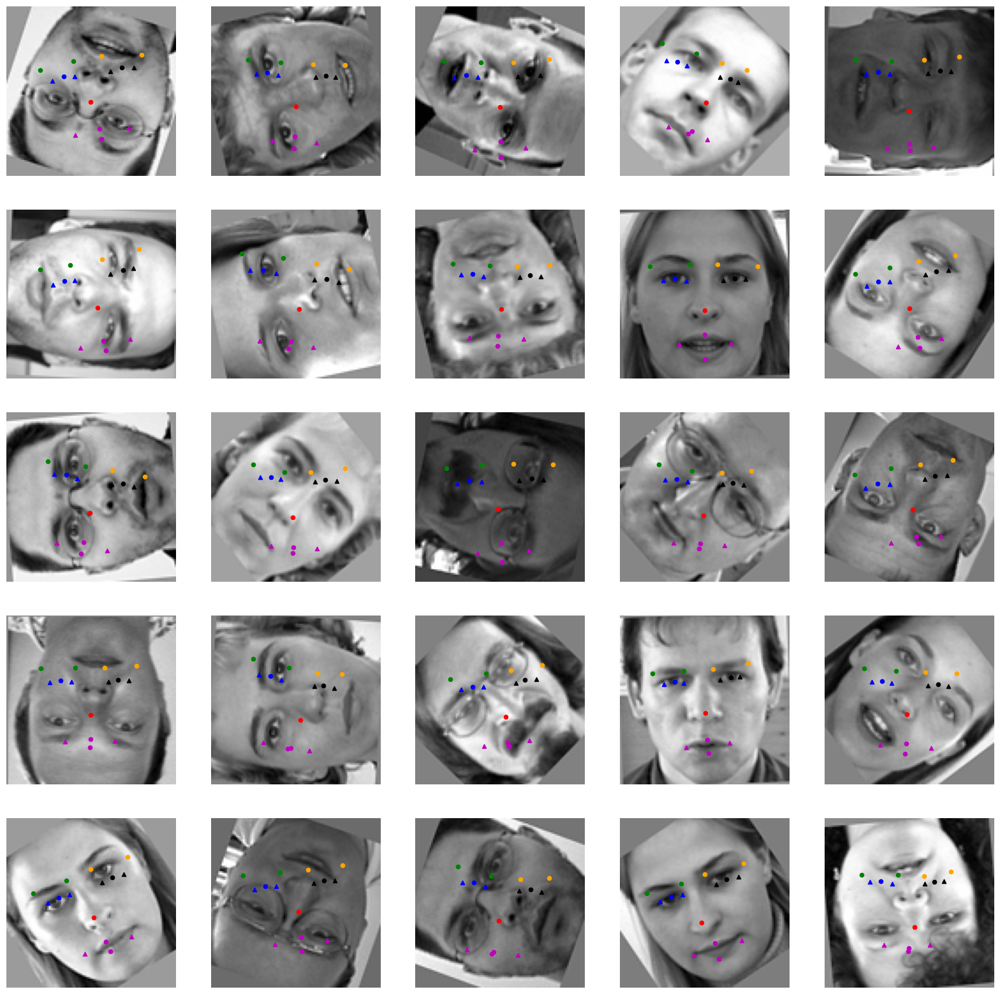

In [ ]:
# Plot the grid of rotate images and the model predictions
plot_grid(25, 5, 5, rotated_images, predict_rotate)

### Real-life face color images 

Here, the model is tested on images of faces found online. It is demonstrated that the model does not perform as well when predicting the facial keypoints for these images, given that the images differ from the ones found in the original Kaggle dataset. For example, they may be in different positions, have different scales, compositions, etc., that lead to variance in the data that the model fails to adapt to.

In [ ]:
def img_to_grayarr(image_name):

  '''
  Transform an RGB image into a greyscale image and resize the image 
  to be used for model training input
  '''

  # load the image
  img = cv2.imread(image_name)

  h, w, c = img.shape

  if h!=96 or w!=96:
      img = cv2.resize(img, dsize=(96, 96))

  gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  
  return gray_img, h, w


def orig_feature_show(img_data, labels, ax=plt):
    
  '''
  Function to display the original image with the predicted labels from 
  the model.
  '''

  # First plot the image
  
  ax.imshow(cv2.cvtColor(img_data, cv2.COLOR_BGR2RGB))

  # Then plot the different feature labels using markers
  ax.scatter(labels[0], labels[1], s=20, c = 'black') # left eye center
  ax.scatter(labels[4:8:2], labels[5:9:2], s=20, c = 'black', marker = '^') #left eye inner and outer corners
  ax.scatter(labels[12:16:2], labels[13:17:2], s=20, c = 'orange') #left eyebrow inner and outer ends

  ax.scatter(labels[2], labels[3], s=20, c = 'b') #right eye center
  ax.scatter(labels[8:12:2], labels[9:13:2], s=20, c = 'b', marker = '^') #right eye inner and outer corners
  ax.scatter(labels[16:20:2], labels[17:21:2], s=20, c = 'g') #right eyebrow inner and outer ends

  ax.scatter(labels[20], labels[21], s=20, c = 'r') # nose tip

  ax.scatter(labels[22:26:2], labels[23:27:2], s=20, c = 'm', marker = '^')  # mouth right and left corners
  ax.scatter(labels[26:29:2], labels[27::2], s=20, c = 'm') # mouth top and bottom lip centers


def model_demo_orig(image_path, model_path):

  '''
  Load the model from the specified model path and use it to predict
  labels for the image specified in the image path. Plot the original image
  and the image with predicted labels side-by-side.
  '''

  model = keras.models.load_model(model_path)
  img = cv2.imread(image_path)

  data, h, w = img_to_grayarr(image_path)

  # print(data.shape)

  input_data = data.reshape((1, 96, 96, 1))/255

  y = model.predict(input_data).reshape(30)

  if h!=96 or w!=96:
      y[0::2] = y[0::2]/96*w
      y[1::2] = y[1::2]/96*h

  fig = plt.figure()
  ax1 = fig.add_subplot(121)  # left side
  ax2 = fig.add_subplot(122)  # right side
  ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  ax1.axis('off')
  orig_feature_show(img, y, ax2)
  ax2.axis('off')

In the photo below, the image clearly has different proportions of facial keypoints compared to that of the original dataset. The photo is also zoomed out further. For certain keypoints such as the eyes and nose, the model does fairly well, but for other keypoints, the model does poorly given the proportions.

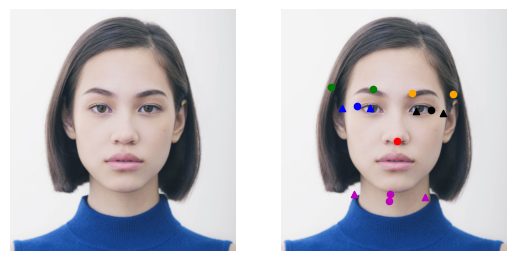

In [ ]:
image_name = 'demo2.jpeg'

model_demo_orig(path+image_name, model_path + final1_path)

Similarly in the photo below, given the formerly unseen composition of the facial keypoints, the model again does fairly well on the eyes and nose only.

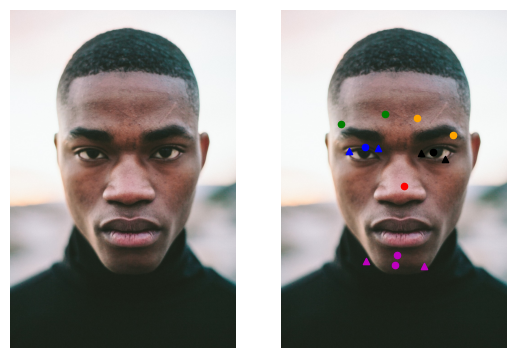

In [ ]:
image_name = 'demo6.jpeg'

model_demo_orig(path+image_name, model_path + final1_path)

The model also performs similarly on realistic drawings of faces!

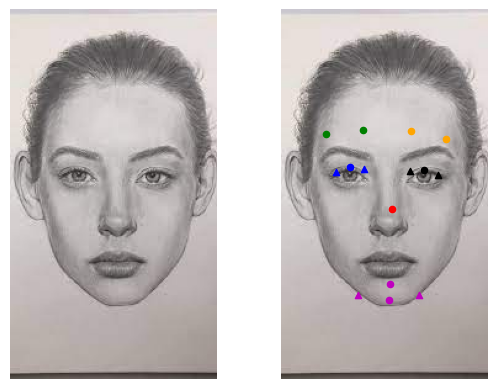

In [ ]:
image_name = 'demo7.jpeg'

model_demo_orig(path+image_name, model_path + final1_path)

Finally, for completely unrelated images, we see that the model fails spectacularly... (if we squint, we can see that the model thinks Peppa's chin is a nose!)

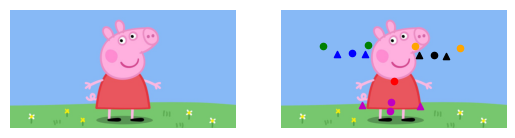

In [ ]:
image_name = 'demo3.jpeg'

model_demo_orig(path+image_name, model_path + final1_path)